# Main code

In [114]:
import os
import numpy as np
import scipy.io
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, mean_squared_error, r2_score
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
from IPython.display import clear_output
import random
import sys

[sklearn.linear_model.LinearRegression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html)

[sklearn.linear_model.Ridge](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Ridge.html#sklearn.linear_model.Ridge)

[sklearn.linear_model.ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html#sklearn.linear_model.ElasticNet)

[sklearn.linear_model.LogisticRegression](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html)

## Read and preprocess mat files

After reading and preprocessing the data in the next code chunk, the data from all cells is stored in a population dictionary. The dictionary's keys correspond to the cell names, and the values contain the data for each respective cell.

The values in the population dictionary are cell dictionaries with keys being `'axons'`, `'green_dFFMeanValues'`,and `'red_dFFMeanValues'`:

- The value of `'axons'`, e.g., `cell_data_dict['CL090_230515']['axons']` is a 1 dimensional numpy array, of which the length is the number of groups and the elements are 1 dimensional numpy arrays consisting of components belonging to the group.
- The value of `'green_dFFMeanValues'` is a 2 dimensional 3 by 49 numpy array (each cell has 3 rounds, and each round has 8 directions \* 2 time frequencies \* 3 space frequencies = 48 settings plus a extra period so in total there are 49 columns), of which the elements are still 2 dimensional numpy arrays with size being 10 by N (N is the number of components).
- The value of `'red_dFFMeanValues'` is similarly a 2 dimensional 3 by 49 numpy array, of which the elements are still 2 dimensional numpy arrays with size being 10 by 1 (only recording the data at the soma).

In [115]:
root_path = "/content/drive/MyDrive/Fluorescence_Data/FluoData4Fitting_Average"

# Get a list of all the subdirectories: subfolders are viewed as cell names
cell_names = [f for f in os.listdir(root_path) if os.path.isdir(os.path.join(root_path, f))]
# for cell in cell_names:
#     print(cell)

# Create a dictionary with default values
default_value = 0
cell_data_dict = {cell: default_value for cell in cell_names}
# print(cell_data_dict)

file_suffixes = ['green_Axon.mat', 'green_dFFMeanValues.mat', 'red_dFFMeanValues.mat']

for cell in cell_names:
    print(cell)
    file_names = [cell + suffix for suffix in file_suffixes]

    path_ = file_names[0] # green_Axon.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    axons = mat_data['Axons'] # array containing nested arrays/sub-arrays
    # Squeeze the outer array
    axons = np.squeeze(axons, axis=0)
    for i in range(len(axons)):
        # Squeeze the inner array and convert the data type to 'int'
        axons[i] = np.squeeze(axons[i].astype(int), axis=0)
    # final axons' length is the number of groups with
    # each elements being a nested array of components

    path_ = file_names[1] # green_dFFMeanValues.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    dFFMeanValues_green = mat_data['dFFMeanValues'] # 3 by 49

    path_ = file_names[2] # red_dFFMeanValues.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    dFFMeanValues_red = mat_data['dFFMeanValues'] # 3 by 49

    cell_data_dict[cell] = {'axons': axons,
                'green_dFFMeanValues': dFFMeanValues_green,
                'red_dFFMeanValues': dFFMeanValues_red}

# Print keys and types
for key, value in cell_data_dict.items():
    print("-- * * * * * --")
    print(key, type(value))
    for key_, value_ in value.items():
        print(key_, type(value_))
print("-- * * * * * --")

CL090_230515
CL090_230518
CL083_230413
CL075_230303
-- * * * * * --
CL090_230515 <class 'dict'>
axons <class 'numpy.ndarray'>
green_dFFMeanValues <class 'numpy.ndarray'>
red_dFFMeanValues <class 'numpy.ndarray'>
-- * * * * * --
CL090_230518 <class 'dict'>
axons <class 'numpy.ndarray'>
green_dFFMeanValues <class 'numpy.ndarray'>
red_dFFMeanValues <class 'numpy.ndarray'>
-- * * * * * --
CL083_230413 <class 'dict'>
axons <class 'numpy.ndarray'>
green_dFFMeanValues <class 'numpy.ndarray'>
red_dFFMeanValues <class 'numpy.ndarray'>
-- * * * * * --
CL075_230303 <class 'dict'>
axons <class 'numpy.ndarray'>
green_dFFMeanValues <class 'numpy.ndarray'>
red_dFFMeanValues <class 'numpy.ndarray'>
-- * * * * * --


In [116]:
# print to see data type and size
print(cell_data_dict['CL090_230515'].keys())
print(type(cell_data_dict['CL090_230515']['axons']))
print(cell_data_dict['CL090_230515']['axons'].shape)
print(cell_data_dict['CL090_230515']['axons'][1].shape)
print(cell_data_dict['CL090_230515']['axons'][1].dtype)
print("--------------------------------")
print(type(cell_data_dict['CL090_230515']['green_dFFMeanValues']))
print(cell_data_dict['CL090_230515']['green_dFFMeanValues'].shape)
print(type(cell_data_dict['CL090_230515']['green_dFFMeanValues'][1,1]))
print(cell_data_dict['CL090_230515']['green_dFFMeanValues'][0,1].shape)
print(cell_data_dict['CL083_230413']['green_dFFMeanValues'][0,1].shape)
print(cell_data_dict['CL083_230413']['green_dFFMeanValues'][0,1].dtype)
print("--------------------------------")
print(type(cell_data_dict['CL090_230515']['red_dFFMeanValues']))
print(cell_data_dict['CL090_230515']['red_dFFMeanValues'].shape)
print(type(cell_data_dict['CL090_230515']['red_dFFMeanValues'][1,1]))
print(cell_data_dict['CL090_230515']['red_dFFMeanValues'][0,1].shape)
print(cell_data_dict['CL083_230413']['red_dFFMeanValues'][0,1].shape)
print(cell_data_dict['CL083_230413']['red_dFFMeanValues'][0,1].dtype)

dict_keys(['axons', 'green_dFFMeanValues', 'red_dFFMeanValues'])
<class 'numpy.ndarray'>
(25,)
(19,)
int64
--------------------------------
<class 'numpy.ndarray'>
(3, 49)
<class 'numpy.ndarray'>
(10, 281)
(10, 155)
float64
--------------------------------
<class 'numpy.ndarray'>
(3, 49)
<class 'numpy.ndarray'>
(10, 1)
(10, 2)
float64


Note:

- Four cells: `'CL090_230515'`, `'CL090_230518'`, `'CL083_230413'`, `'CL075_230303'`.

- `'red_dFFMeanValues'` and `'green_dFFMeanValues'` have 49 columns,where the last column should be excluded. They are supposed to have 3 rows (3 rounds), but `'CL090_230518'` only has 2 rows.

- In `'CL083_230413'`, elements in `'red_dFFMeanValues'` have 2 columns (10 × 2， should be 10 × 1), so `'CL083_230413'` is not used.

## Fit data to model

### Functions

In [117]:
def plot_comparison(y_test, y_pred, subtitle = ''):
    # Sort y_pred and y_test based on y_test
    sorted_indices = np.argsort(y_test)
    sorted_y_pred = y_pred[sorted_indices]
    sorted_y_test = y_test[sorted_indices]
    # Plot sorted_y_pred and sorted_y_test
    plt.plot(sorted_y_pred, label='Sorted Predictions')
    plt.plot(sorted_y_test, label='Sorted Ground Truth')
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title(f'Comparison of Sorted Predictions and Sorted Ground Truth \n ({subtitle})')
    plt.legend()
    plt.savefig(f'Comparison ({subtitle}).png', bbox_inches='tight')
    # bbox_inches='tight' will adjust the figure's bounding box to fit all the content, ensuring that
    # the complete words are visible in the saved figure. Otherwise, the saved figure may not show the
    # complete words, e.g., for x-label, or for the long title.
    # The default setting can sometimes result in cutoff or clipped text. It tries to include the entire
    # figure within the saved image, but there may be cases where the default behavior is not sufficient
    # to capture all the content. The default behavior assumes the figure content fits within the predefined
    # margins and padding.
    plt.show()

### Reorganize the data (vstack)

In [118]:
# cell_data = cell_data_dict['CL090_230515']
cell_data = cell_data_dict['CL075_230303']

delete_small_group = True # delete groups (axons) with less than 3 components

data_green = cell_data['green_dFFMeanValues'][:,:-1] # exclude 49th column
data_red = cell_data['red_dFFMeanValues'][:,:-1] # exclude 49th column
data_axons = cell_data['axons']
# print(data_axons)
# print(type(data_axons),len(data_axons),data_axons)
if delete_small_group:
    data_axons = np.array([axons_ for axons_ in data_axons if len(axons_) >= 3])
# print(type(data_axons),len(data_axons),data_axons)

# vstack green data
stacked_green = np.empty((0, data_green[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(data_green):
    stacked_green = np.vstack((stacked_green, value))
print(stacked_green.shape, 48*3*10)

# group columns of green data
group_num = data_axons.shape[0]
group_satcked_green = np.zeros((stacked_green.shape[0], group_num))
for i, cols in enumerate(data_axons):
    group_satcked_green[:, i] = np.sum(stacked_green[:, cols-1], axis=1)
print(group_satcked_green.shape, data_axons.shape)

# vstack red data
stacked_red = np.empty((0, data_red[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(data_red):
    stacked_red = np.vstack((stacked_red, value))
print(stacked_red.shape, 48*3*10)

print(np.max(group_satcked_green), np.min(group_satcked_green))
print(np.max(stacked_red), np.min(stacked_red))

(1440, 80) 1440
(1440, 5) (5,)
(1440, 1) 1440
27.44283678657392 -9.505092954427656
0.4404603811981394 -0.20703030293882338


<ipython-input-118-ddad8385ad7f>:12: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  data_axons = np.array([axons_ for axons_ in data_axons if len(axons_) >= 3])


### Linear regression

#### Divide train and val datasets

In [119]:
# independent data
x = group_satcked_green

# dependent data (labels/targets)
y = np.squeeze(stacked_red)

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

x_train shape: (1368, 5)
y_train shape: (1368,)
x_test shape: (72, 5)
y_test shape: (72,)


#### Ordinary linear regression

Ordinary least squares Linear Regression.

Linear Regression fits a linear model with coefficients to minimize the residual sum of squares between the observed targets in the dataset, and the targets predicted by the linear approximation.

##### Fit and predict

In [120]:
# Create a LinearRegression object
model = linear_model.LinearRegression()

# Fit the model on the training data
model.fit(x_train, y_train)
# Print the fitted coefficients
print("Fitted Coefficients:", model.coef_)
# Print the fitted intercept
print("Fitted Intercept:", model.intercept_)

# Predict on the test data
y_pred = model.predict(x_test)

Fitted Coefficients: [ 0.02750133  0.00644773  0.01610286 -0.00245954  0.00325725]
Fitted Intercept: 0.021384507405425024


##### Evaluate

In [121]:
mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

Mean squared error: 0.0021013740360479637
Correlation coefficient: 0.5516491307623594
Coefficient of determination (R-squared score, R2 score): 0.30412235302891344


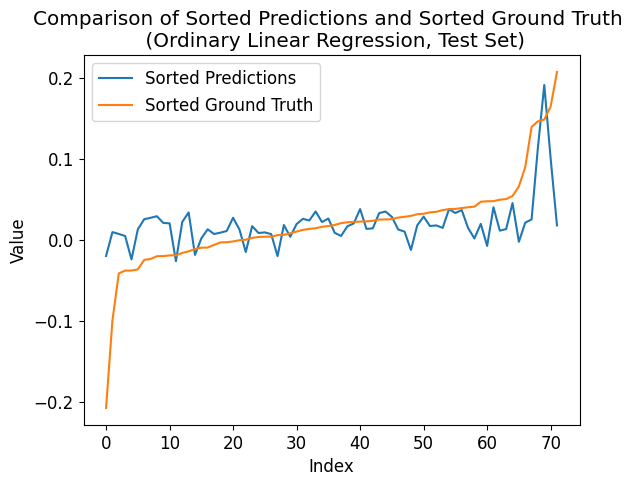

In [122]:
plot_comparison(y_test, y_pred, 'Ordinary Linear Regression, Test Set')

In [123]:
# predict on train
# Use the trained model to make predictions
y_pred_ = model.predict(x_train)

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

Mean squared error: 0.0016130542307865325
Correlation coefficient: 0.5303604736894671
Coefficient of determination (R-squared score, R2 score): 0.2812822320521161


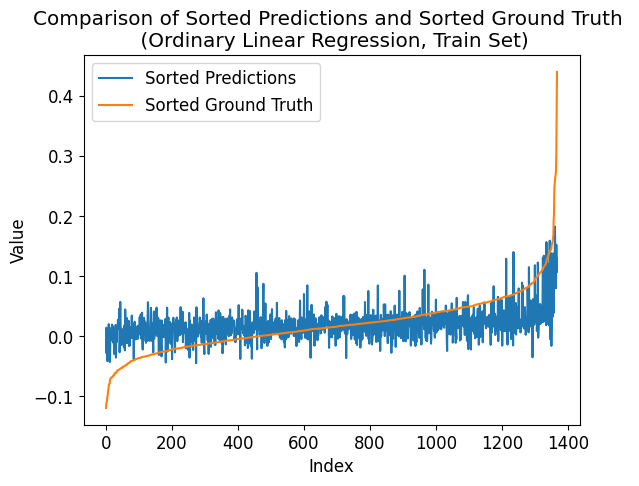

In [124]:
plot_comparison(y_train, y_pred_, 'Ordinary Linear Regression, Train Set')

In [125]:
# digitized results
print("---- ---- ----")
class_num = 16
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

---- ---- ----
Mean squared error: 1.3611111111111112
Correlation coefficient: 0.5192778681631646
Coefficient of determination (R-squared score, R2 score): 0.2679738562091504
Mean squared error: 1.1140350877192982
Correlation coefficient: 0.47374351663713143
Coefficient of determination (R-squared score, R2 score): 0.21872132035869019


#### Ridge linear regression

Linear least squares with l2 regularization.

Minimizes the objective function:

$$
||y - Xw||^2_2 + \alpha  ||w||^2_2
$$

This model solves a regression model where the loss function is the linear least squares function and regularization is given by the l2-norm.

##### Fit and predict

In [126]:
# Create a Ridge Regression object
ridge_model = linear_model.Ridge(alpha=1.0)  # You can adjust the value of alpha as per your requirements

# Fit the model on the training data
ridge_model.fit(x_train, y_train)

# Print the fitted coefficients
print("Fitted Coefficients:", ridge_model.coef_)

# Print the fitted intercept
print("Fitted Intercept:", ridge_model.intercept_)

# Predict on the test data
y_pred = ridge_model.predict(x_test)

Fitted Coefficients: [ 0.02737809  0.00640785  0.01592334 -0.00242911  0.00326877]
Fitted Intercept: 0.02141557952594624


##### Evaluate

Mean squared error: 0.0020998258646144365
Correlation coefficient: 0.5521413386329813
Coefficient of determination (R-squared score, R2 score): 0.30463503562410577


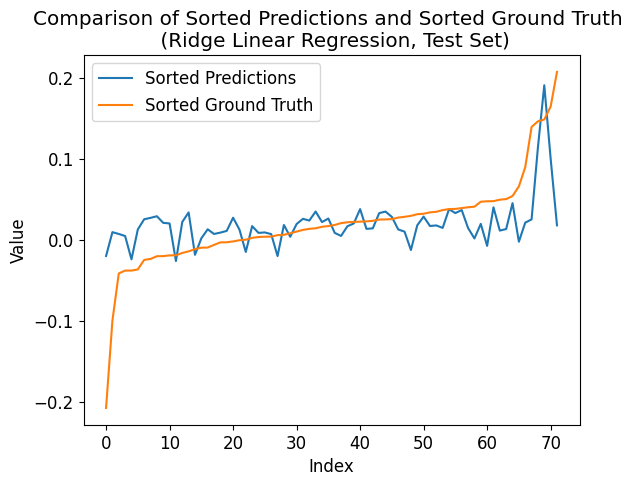

In [127]:
mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_test, y_pred, 'Ridge Linear Regression, Test Set')

Mean squared error: 0.0016130590000993249
Correlation coefficient: 0.5303588713620216
Coefficient of determination (R-squared score, R2 score): 0.2812801070213643


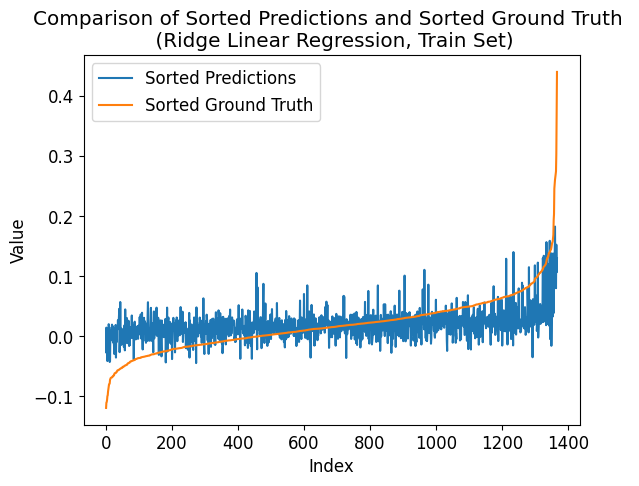

In [128]:
# predict on train
# Use the trained model to make predictions
y_pred_ = ridge_model.predict(x_train)

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_train, y_pred_, 'Ridge Linear Regression, Train Set')

In [129]:
# digitized results
print("---- ---- ----")
class_num = 16
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

---- ---- ----
Mean squared error: 1.3611111111111112
Correlation coefficient: 0.5192778681631646
Coefficient of determination (R-squared score, R2 score): 0.2679738562091504
Mean squared error: 1.1103801169590644
Correlation coefficient: 0.47591543732849056
Coefficient of determination (R-squared score, R2 score): 0.22128457061998064


#### ElasticNet linear regression

Linear regression with combined L1 and L2 priors as regularizer.

Minimizes the objective function:

$$
1 / (2 * n_{samples}) * ||y - Xw||^2_2
+ \alpha * l1_{ratio} * ||w||_1
+ 0.5 * \alpha * (1 - l1_{ratio}) * ||w||^2_2
$$

If controlling the L1 and L2 penalty separately, that this is equivalent to:

$$
a * ||w||_1 + 0.5 * b * ||w||_2^2
$$

where: $\alpha = a + b$ and $l1_{ratio} = a / (a + b)$.

##### Fit and predict

In [130]:
# Create an ElasticNet object
a = 0.004; b = 0.00
alpha = a + b; l1_ratio = a / (a + b)
elasticnet_model = linear_model.ElasticNet(alpha=alpha, l1_ratio=l1_ratio, max_iter=100000)
# adjust the values of alpha and l1_ratio as per your requirements

# Fit the model on the training data
elasticnet_model.fit(x_train, y_train)

# Print the fitted coefficients
print("Fitted Coefficients:", elasticnet_model.coef_)

# Print the fitted intercept
print("Fitted Intercept:", elasticnet_model.intercept_)

# Predict on the test data
y_pred = elasticnet_model.predict(x_test)

# It is normal to encounter warning here, because our data is not linear enough
# and not normailized to guarantee a low error/residual, even though we set a very
# large max_iter. But the results is similar to that of ordinary and Ridge linear
# regression. Like alpha = 0 results in the same results as the ordinary linear
# rergession.

Fitted Coefficients: [0.00866444 0.         0.         0.00158259 0.0047032 ]
Fitted Intercept: 0.022844047405427618


##### Evaluate

Mean squared error: 0.0020020605564851465
Correlation coefficient: 0.6136634710485406
Coefficient of determination (R-squared score, R2 score): 0.33701037262235


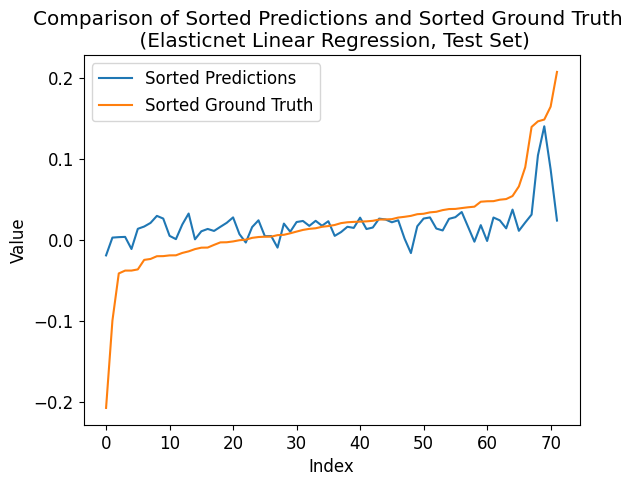

In [131]:
mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_test, y_pred, 'Elasticnet Linear Regression, Test Set')

Mean squared error: 0.0016981988382008856
Correlation coefficient: 0.4970722873576219
Coefficient of determination (R-squared score, R2 score): 0.2433449197003772


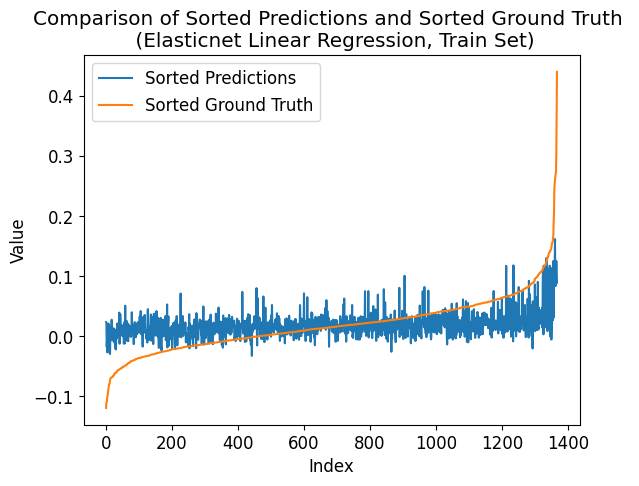

In [132]:
# predict on train
# Use the trained model to make predictions
y_pred_ = elasticnet_model.predict(x_train)

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_train, y_pred_, 'Elasticnet Linear Regression, Train Set')

In [133]:
# digitized results
print("---- ---- ----")
class_num = 16
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

---- ---- ----
Mean squared error: 1.3472222222222223
Correlation coefficient: 0.5463431384225381
Coefficient of determination (R-squared score, R2 score): 0.2754435107376284
Mean squared error: 1.1359649122807018
Correlation coefficient: 0.4511357285754583
Coefficient of determination (R-squared score, R2 score): 0.20334181879094793


### Power-law regression

Mathematically, a power-law relationship can be expressed as:

$$
y = A  X^C
$$

Here, I modify it, shown as:

$$
y = A  (X+B)^C + D
$$

where, $X = \beta_1 x_1 + \beta_2 x_2 \dots + \beta_N x_N$. $X+D$ is a linear regression part. $A$, $B$, $C$, $D$, $\beta_1$, $\beta_2$, ...,$\beta_N$ are parameters to be determined.

#### Divide train and val datasets

In [134]:
# independent data
x = group_satcked_green

# dependent data (labels/targets)
y = np.squeeze(stacked_red)

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

x_train shape: (1368, 5)
y_train shape: (1368,)
x_test shape: (72, 5)
y_test shape: (72,)


#### Fit, predict and evaluate (Example 1)

Fitted Parameters: [ 1.18600565e+01  3.44121000e-01 -4.05562036e-02  2.77702818e-02
  2.47117908e-03  2.09451252e-02 -2.56362694e-03  3.66822262e-03]
Mean squared error: 0.0026229360598610057
Correlation coefficient: 0.47446924924518413
Coefficient of determination (R-squared score, R2 score): 0.13140519384906468


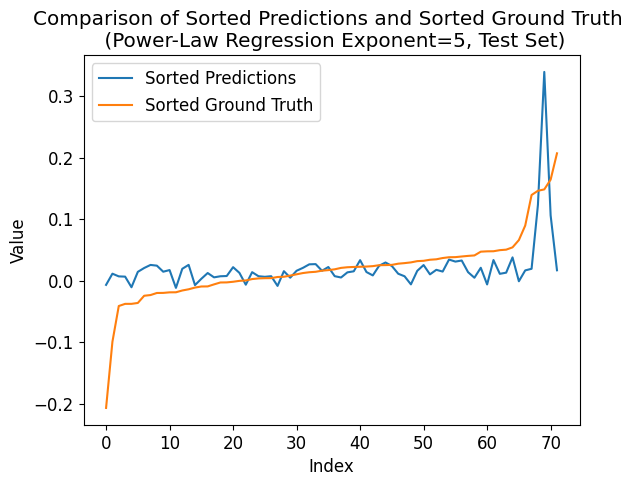

Mean squared error: 0.001563847057598201
Correlation coefficient: 0.550642481932762
Coefficient of determination (R-squared score, R2 score): 0.30320714257648085


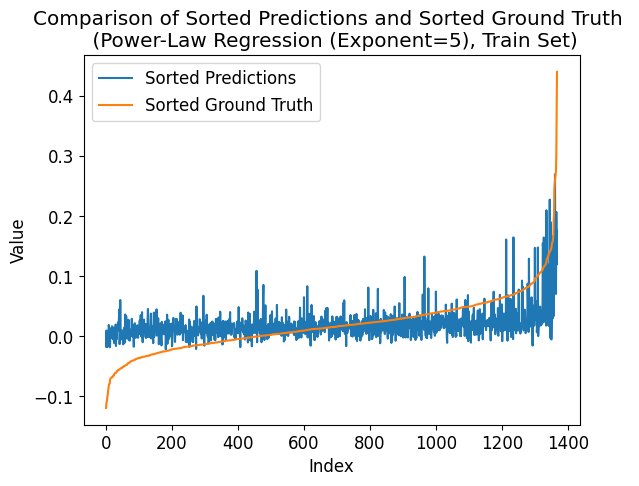

---- ---- ----
Mean squared error: 1.7083333333333333
Correlation coefficient: 0.45098751419685795
Coefficient of determination (R-squared score, R2 score): 0.08123249299719892
Mean squared error: 1.1001461988304093
Correlation coefficient: 0.4832959693241634
Coefficient of determination (R-squared score, R2 score): 0.22846167135159368


In [135]:
exponent = 5
# Define the model function
def func(X, *params):
    A, B, D = params[:3]
    # Compute the weighted sum
    weighted_sum = np.sum(X * np.array(params[3:]), axis=1)
    base = weighted_sum + B
    power_result = np.power(base, exponent)
    return A * power_result + D

# Create a LinearRegression object
model = linear_model.LinearRegression()

# give the initial params using linear regression
# so that the params are within a reasonable range
model.fit(x_train, y_train)
# print("Fitted Coefficients:", model.coef_)
# print("Fitted Intercept:", model.intercept_)
num_features = x_train.shape[1]
# Assuming model.coef_ is the np array containing the coefficients
model_coefs = model.coef_
# Set negative elements to 0 using np.clip()
initial_params = [1, model.intercept_, 0] + list(model_coefs) # Initial parameter guesses
# model_coefs_clipped = np.clip(model_coefs, 0, np.inf)
# initial_params = [1, model.intercept_, 0] + list(model_coefs_clipped) # Initial parameter guesses, no need to clip -- they can be negative

# Set lower and upper bounds for the parameters
lower_bounds = [0, -np.inf, -np.inf] + [0] * num_features
upper_bounds = [np.inf, np.inf, np.inf] + [np.inf] * num_features

# Combine the lower and upper bounds into a 2-tuple of array_like
bounds = (lower_bounds, upper_bounds)

# Perform the curve fit with bounds
params, params_covariance = curve_fit(func, x_train, y_train, p0=initial_params, maxfev=1000000)
# params, params_covariance = curve_fit(func, x_train, y_train, p0=initial_params, bounds=bounds, maxfev=1000000)

# Print the fitted parameters
print("Fitted Parameters:", params)

# predict on test
A, B, D = params[:3]
weighted_sum = np.sum(x_test * np.array(params[3:]), axis=1)
base = weighted_sum + B
abs_base = np.abs(base)
sign = np.sign(base)
power_result = np.power(abs_base, exponent)
y_pred = A * sign * power_result + D

mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_test, y_pred, 'Power-Law Regression Exponent=5, Test Set')


# predict on train
A, B, D = params[:3]
weighted_sum = np.sum(x_train * np.array(params[3:]), axis=1)
base = weighted_sum + B
abs_base = np.abs(base)
sign = np.sign(base)
power_result = np.power(abs_base, exponent)
y_pred_ = A * sign * power_result + D

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_train, y_pred_, 'Power-Law Regression (Exponent=5), Train Set')

# digitized results
print("---- ---- ----")
class_num = 16
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

#### Fit, predict and evaluate (Example 2)

Fitted Coefficients: [ 0.02750133  0.00644773  0.01610286 -0.00245954  0.00325725]
Fitted Intercept: 0.021384507405425024
Fitted Parameters: [4.05181437e+03 1.77237254e-02]
Mean squared error: 0.005299362470883888
Correlation coefficient: 0.2996981978301417
Coefficient of determination (R-squared score, R2 score): -0.7549031364359122


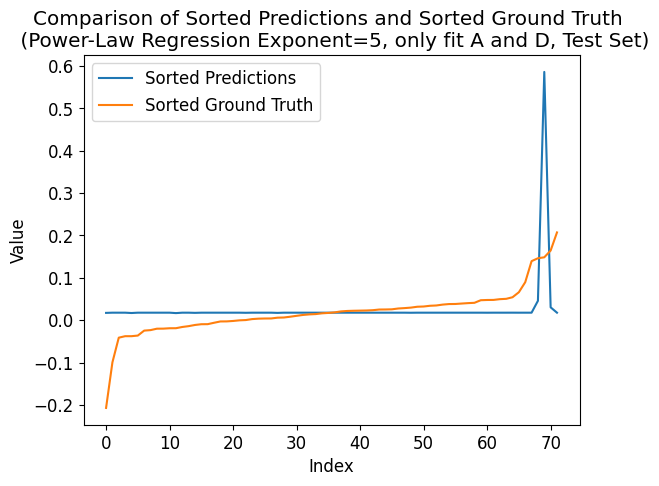

Mean squared error: 0.001978769231784402
Correlation coefficient: 0.3439957106418279
Coefficient of determination (R-squared score, R2 score): 0.1183330489399761


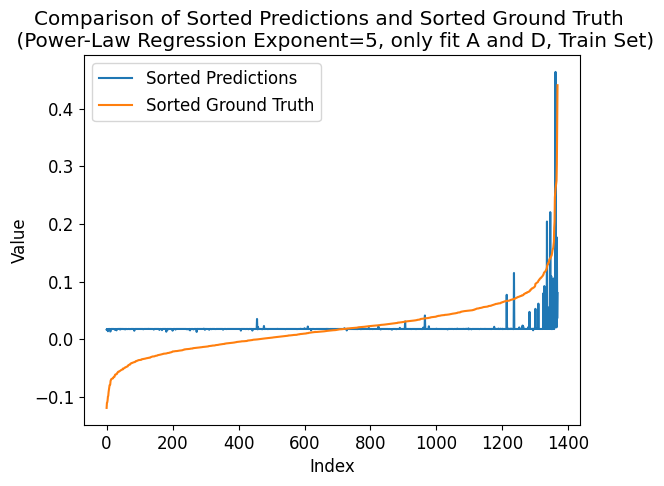

In [136]:
# compared with example 1, here only fit A and D.

exponent = 5

model = linear_model.LinearRegression()
model.fit(x_train, y_train)
# now we have: model.intercept_ and model.coef_
# Print the fitted coefficients
print("Fitted Coefficients:", model.coef_)
# Print the fitted intercept
print("Fitted Intercept:", model.intercept_)

# Define the model function
def func(X, A, D):
    # Compute the weighted sum
    weighted_sum = np.sum(X * np.array(model.coef_), axis=1)
    base = weighted_sum
    power_result = np.power(base, exponent)
    return A * power_result + D

initial_params = [1, 0]

# Perform the curve fit
params, params_covariance = curve_fit(func, x_train, y_train, p0=initial_params, maxfev=1000000)

# Print the fitted parameters
print("Fitted Parameters:", params)


# predict on test
A, D = params
y_pred = func(x_test, A, D)

mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_test, y_pred, 'Power-Law Regression Exponent=5, only fit A and D, Test Set')

# predict on train
A, D = params
y_pred_ = func(x_train, A, D)

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_train, y_pred_, 'Power-Law Regression Exponent=5, only fit A and D, Train Set')

#### Fit and predict

158/99
63/17
87/11
390/43


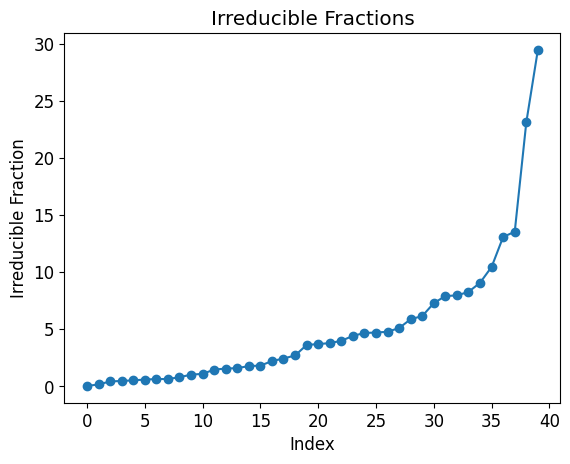

In [137]:
# generate irreducible fraction with an odd number as the denominator
# such numbers can work as the exponent for negative numbers and
# will be used as the parameter "C" in Power-law regression below:
# y = A * (B+b1*x1+b2*x2+...+bN*xN)**C + D

def gcd(a, b): # calculate the greatest common divisor of two numbers
    while b:
        a, b = b, a % b
    return a

def generate_irreducible_fraction(existing_fractions = []):
    while True:
        numerator = random.randint(1, 400)  # Random numerator
        denominator = random.randrange(1, 100, 2)  # Random odd denominator
        if gcd(numerator, denominator) == 1:  # Check if the fraction is irreducible
            fraction = (numerator, denominator)
            if fraction not in existing_fractions:  # Check if the fraction is not a duplicate
                return fraction

# Generate irreducible fraction numbers
N_faction = 40
upper_bound = 50
irreducible_fractions = []
while len(irreducible_fractions) < N_faction:
    fraction = generate_irreducible_fraction(irreducible_fractions)
    if fraction[0]/fraction[1] < upper_bound:
        irreducible_fractions.append(fraction)

# Sort the irreducible fractions
irreducible_fractions.sort(key=lambda f: f[0] / f[1])

# Print the irreducible fraction numbers
for numerator, denominator in irreducible_fractions:
    if random.random() <= 0.1:
        print(f"{numerator}/{denominator}")


# Extract the numerator and denominator values
indexes = range(1, len(irreducible_fractions) + 1)
values = [numerator / denominator for numerator, denominator in irreducible_fractions]

# Plot the irreducible fractions
plt.plot(values, 'o-')
plt.xlabel("Index")
plt.ylabel("Irreducible Fraction")
plt.title("Irreducible Fractions")
plt.show()

## if not use the above random generated irreducible_fractions, define it below.
irreducible_fractions = [(1,95), (30,43), (179,65), (5,1), (221,33), (219,23), (300,17), (73,3)]

In [138]:
# # old code! The new one is in the next chunk.

# params_list = []
# for numerator, denominator in irreducible_fractions:
#     C1, C2 = numerator, denominator

#     # Define the model function
#     def func(X, *params):
#         A, B, D = params[:3]
#         # Compute the weighted sum
#         weighted_sum = np.sum(X * np.array(params[3:]), axis=1)
#         base = weighted_sum + B
#         abs_base = np.abs(base)
#         sign = np.sign(base)
#         power_result = np.power(abs_base, C1 / C2)
#         return A * sign * power_result + D

#     # Create a LinearRegression object
#     model = linear_model.LinearRegression()

#     # give the initial params using linear regression
#     # so that the params are within a reasonable range
#     model.fit(x_train, y_train)
#     # print("Fitted Coefficients:", model.coef_)
#     # print("Fitted Intercept:", model.intercept_)
#     num_features = x_train.shape[1]
#     initial_params = [1, model.intercept_, 0] + list(model.coef_) # Initial parameter guesses

#     # Perform the curve fit
#     params, params_covariance = curve_fit(func, x_train, y_train, p0=initial_params, maxfev=1000000)
#     params_list.append(params)

#     # Print the fitted parameters
#     # print("Fitted Parameters:", params)

# # predict on test
# y_predict_test_list = []
# for (numerator, denominator), params in zip(irreducible_fractions, params_list):
#     C1, C2 = numerator, denominator
#     A, B, D = params[:3]
#     weighted_sum = np.sum(x_test * np.array(params[3:]), axis=1)
#     base = weighted_sum + B
#     abs_base = np.abs(base)
#     sign = np.sign(base)
#     power_result = np.power(abs_base, C1 / C2)
#     y_pred = A * sign * power_result + D
#     y_predict_test_list.append(y_pred)

# # predict on train
# y_predict_train_list = []
# for (numerator, denominator), params in zip(irreducible_fractions, params_list):
#     C1, C2 = numerator, denominator
#     A, B, D = params[:3]
#     weighted_sum = np.sum(x_train * np.array(params[3:]), axis=1)
#     base = weighted_sum + B
#     abs_base = np.abs(base)
#     sign = np.sign(base)
#     power_result = np.power(abs_base, C1 / C2)
#     y_pred_ = A * sign * power_result + D
#     y_predict_train_list.append(y_pred_)

In [139]:
# new code, a updated version for the code in last chunk.
# input and output data normalization is achieved (but it
# seems normalization is redundant).

class CurveFit_with_Normalization:
    def __init__(self, exponent_numerator=1, exponent_denominator=1, input_range=[1,2], output_range=[1,2]):
        self.input_min = input_range[0]
        self.input_max = input_range[1]
        self.output_min = output_range[0]
        self.output_max = output_range[1]
        self.input_scale = None
        self.input_shift = None
        self.output_scale = None
        self.output_shift = None
        self.exponent_numerator = exponent_numerator
        self.exponent_denominator = exponent_denominator
        self.linear_model = linear_model.LinearRegression()

    def fit(self, X, y):
        # Normalize the input and output data
        self.input_scale = (self.input_max - self.input_min) / (np.max(X) - np.min(X))
        self.input_shift = self.input_min - np.min(X) * self.input_scale
        normalized_X = self.input_scale * X + self.input_shift

        self.output_scale = (self.output_max - self.output_min) / (np.max(y) - np.min(y))
        self.output_shift = self.output_min - np.min(y) * self.output_scale
        normalized_y = self.output_scale * y + self.output_shift

        def normalized_func_(X_normalize, *params):
            A, B, D = params[:3]
            # Compute the weighted sum
            weighted_sum = np.sum(X_normalize * np.array(params[3:]), axis=1)
            base = weighted_sum + B
            abs_base = np.abs(base)
            sign = np.sign(base)
            power_result = np.power(abs_base, self.exponent_numerator / self.exponent_denominator)
            return A * sign * power_result + D

        # Give the initial params using linear regression
        self.linear_model.fit(normalized_X, normalized_y)
        # print("Fitted Coefficients:", linear_model.coef_)
        # print("Fitted Intercept:", linear_model.intercept_)
        # num_features = X.shape[1]
        exponent = self.exponent_numerator / self.exponent_denominator
        initial_params = [1, self.linear_model.intercept_ / exponent + (1 - 1 / exponent), 0] + list(self.linear_model.coef_ /
                        exponent)  # Initial parameter guesses
        # initial_params = [1, 0, 0] + [1 / X.shape[1]] * (X.shape[1])

        # Perform the normalized curve fit
        normalized_params, params_covariance = curve_fit(normalized_func_, normalized_X, normalized_y,
                                  p0=initial_params, maxfev=100000000)

        # Store the fitted parameters
        self.normalized_fitted_params = normalized_params

    def predict(self, X):
        # Normalize the input data using the previously calculated scaling and shifting parameters
        normalized_X = self.input_scale * X + self.input_shift

        # Make predictions using the denormalized parameters
        y_pred = self.normalized_func(normalized_X, self.exponent_numerator,
                              self.exponent_denominator, *self.normalized_fitted_params)

        # Denormalize the predicted output
        y_pred = (y_pred - self.output_shift) / self.output_scale

        return y_pred

    @staticmethod
    def normalized_func(X_normalize, exponent_numerator, exponent_denominator, *params):
        A, B, D = params[:3]
        # Compute the weighted sum
        weighted_sum = np.sum(X_normalize * np.array(params[3:]), axis=1)
        base = weighted_sum + B
        abs_base = np.abs(base)
        sign = np.sign(base)
        power_result = np.power(abs_base, exponent_numerator / exponent_denominator)
        return A * sign * power_result + D

model_list = []
for numerator, denominator in irreducible_fractions:
    # Create an instance of NormalizedCurveFit
    model = CurveFit_with_Normalization(numerator, denominator, input_range=[1, 2], output_range=[1, 2])

    # Fit the model to your input and output data
    model.fit(x_train, y_train)

    model_list.append(model)


-------- 
 (numerator, denominator) is: (1, 95)
Mean squared error: 0.002100964640127741
Correlation coefficient: 0.5517910432357731
Coefficient of determination (R-squared score, R2 score): 0.3042579259753555
-------- 
 (numerator, denominator) is: (30, 43)
Mean squared error: 0.002101281865505407
Correlation coefficient: 0.5516808169870028
Coefficient of determination (R-squared score, R2 score): 0.30415287563896487
-------- 
 (numerator, denominator) is: (179, 65)
Mean squared error: 0.0025250507543628977
Correlation coefficient: 0.4832436056815392
Coefficient of determination (R-squared score, R2 score): 0.16382026841198005
-------- 
 (numerator, denominator) is: (5, 1)
Mean squared error: 0.0026225156812671405
Correlation coefficient: 0.47450623106504053
Coefficient of determination (R-squared score, R2 score): 0.13154440374778698
-------- 
 (numerator, denominator) is: (221, 33)
Mean squared error: 0.0026499746952767882
Correlation coefficient: 0.4722949272041147
Coefficient of d

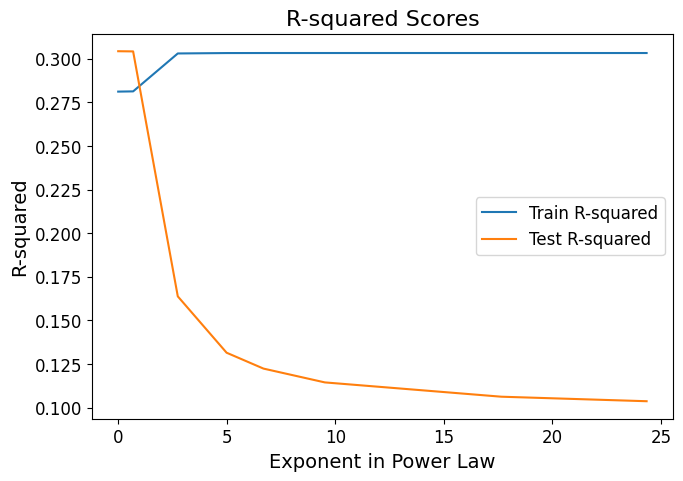

In [140]:
# this is for the new version code in the last chunk

r2_score_test_list = []

# predict on test
y_predict_test_list = []
for model, (numerator, denominator) in zip(model_list, irreducible_fractions):
    y_pred = model.predict(x_test)

    print(f'-------- \n (numerator, denominator) is: ({numerator}, {denominator})')

    mse = mean_squared_error(y_test, y_pred)
    print("Mean squared error:", mse)

    correlation = np.corrcoef(y_pred, y_test)[0, 1]
    print("Correlation coefficient:", correlation)

    r_squared = r2_score(y_test, y_pred)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)

    r2_score_test_list.append(r_squared)

    y_predict_test_list.append(y_pred)

print("|||||||||||||||||||||||||||||||||||||")

r2_score_train_list = []

# predict on train
y_predict_train_list = []
for model, (numerator, denominator) in zip(model_list, irreducible_fractions):
    y_pred_ = model.predict(x_train)

    print(f'-------- \n (numerator, denominator) is: ({numerator}, {denominator})')

    mse = mean_squared_error(y_train, y_pred_)
    print("Mean squared error:", mse)

    # Calculate the correlation coefficient
    correlation = np.corrcoef(y_pred_, y_train)[0, 1]
    print("Correlation coefficient:", correlation)

    r_squared = r2_score(y_train, y_pred_)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)

    r2_score_train_list.append(r_squared)

    y_predict_train_list.append(y_pred_)


x = [numerator / denominator for (numerator, denominator) in irreducible_fractions]



# plot the r2 score curve over exponent
fig, ax = plt.subplots(figsize=(7.5, 5))  # Adjust the values as desired

# Plot the R-squared scores
ax.plot(x, r2_score_train_list, label='Train R-squared')
ax.plot(x, r2_score_test_list, label='Test R-squared')

# Set labels and title with font size
ax.set_xlabel('Exponent in Power Law', fontsize=14)
ax.set_ylabel('R-squared', fontsize=14)
ax.set_title('R-squared Scores', fontsize=16)

# Set tick label font size
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)

# Set legend
ax.legend(fontsize=12)

fig.savefig('Power_Law_r2_scores_plot.png')

# Display the plot
plt.show()

In [141]:
# for model in model_list:
#     print(model.exponent_numerator, model.exponent_denominator)

#### Evaluate

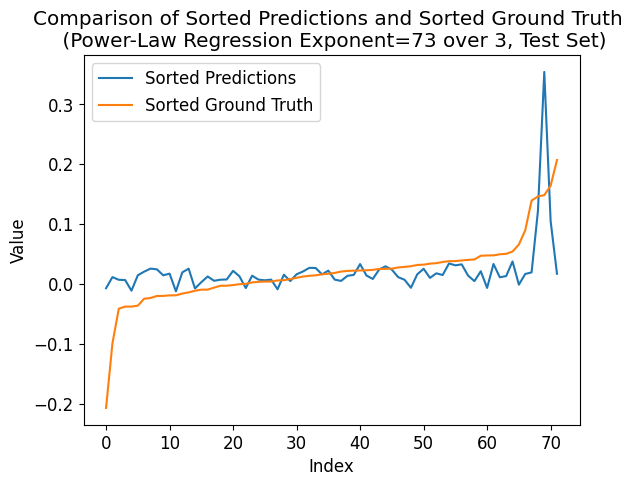

-0.0068363855310673224


In [142]:
# both the old and new versions (in the last subsection "Fit and predict") of code
# share the same evaluate code in this subsectoon.

# Create and update multiple figures (test)
for y_pred, (numerator, denominator) in zip(y_predict_test_list, irreducible_fractions):
    plot_comparison(y_test, y_pred, f'Power-Law Regression Exponent={numerator} over {denominator}, Test Set')
    # here pay attention: cannot use / replace over in the name, otherwise cannot save the fig
    # because / cannot be in a file name.
    print(y_pred[0])
    clear_output(wait=True)  # Clear the previous output

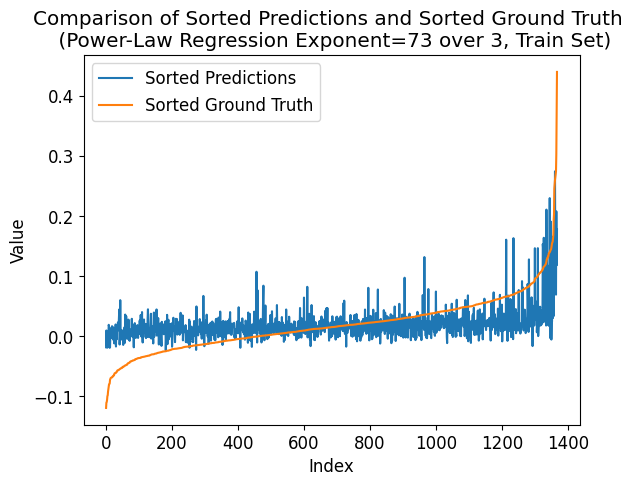

-0.006264150549880837


In [143]:
# Create and update multiple figures (train)
for y_pred_, (numerator, denominator) in zip(y_predict_train_list, irreducible_fractions):
    plot_comparison(y_train, y_pred_, f'Power-Law Regression Exponent={numerator} over {denominator}, Train Set')
    print(y_pred_[0])
    clear_output(wait=True)  # Clear the previous output

### Exponential regression

Let $B = (b_1, b_2, \ldots , b_N)$.
$$
y = A \cdot e^{(b_1 \cdot x_1 + \ldots + b_N \cdot x_N)} + C
$$

#### Divide train and val datasets

In [144]:
# independent data
x = group_satcked_green

# dependent data (labels/targets)
y = np.squeeze(stacked_red)

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

x_train shape: (1368, 5)
y_train shape: (1368,)
x_test shape: (72, 5)
y_test shape: (72,)


#### Fit and predict

In [145]:
# Define the model function
def func(X, *params):
    A, C = params[:2]
    return A * np.exp(np.sum(X * np.array(params[2:]), axis=1)) + C

# give the initial params using linear regression
# so that the params are within a reasonable range
num_features = x_train.shape[1]
initial_params = [np.mean(y_train), 0] + [0] * num_features # Initial parameter guesses

# Perform the curve fit
params, params_covariance = curve_fit(func, x_train, y_train, p0=initial_params, maxfev=1000000)

# Print the fitted parameters
print("Fitted Parameters:", params)

# predict on test
A, C = params[:2]
y_pred = A * np.exp(np.sum(x_test * np.array(params[2:]), axis=1)) + C

mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

# predict on train
A, C = params[:2]
y_pred_ = A * np.exp(np.sum(x_train * np.array(params[2:]), axis=1)) + C

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

r2_score_train_list.append(r_squared)

# digitized results
print("---- ---- ----")
class_num = 16
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
print(y_pred)
print(y_pred_test_digital)
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

Fitted Parameters: [ 0.07779241 -0.06104678  0.29536653  0.02428094  0.22627202 -0.02735473
  0.03966839]
Mean squared error: 0.002726635527392822
Correlation coefficient: 0.466554602832389
Coefficient of determination (R-squared score, R2 score): 0.09706473840405994
Mean squared error: 0.0015638339543745966
Correlation coefficient: 0.5506477829720628
Coefficient of determination (R-squared score, R2 score): 0.3032129808920452
---- ---- ----
[-0.00689957 -0.00666178  0.01360607  0.00661662  0.00731099  0.02449375
  0.01326078  0.03334951  0.00512768  0.03277946  0.00727101  0.01555067
  0.12159638  0.01786017  0.01402178  0.02199172  0.01459452  0.01422314
  0.01935669 -0.00708446  0.03325915  0.0069828   0.00489899  0.01448913
  0.00301878  0.35765372  0.00477497  0.02670886  0.01733475 -0.01236122
  0.01620576  0.02950386 -0.00751631  0.0071461   0.0206256   0.00699687
  0.01942845  0.03431444  0.01141902  0.02229449  0.0212914  -0.01130567
  0.02393423  0.01708261  0.03761861  0.013

#### Evaluate

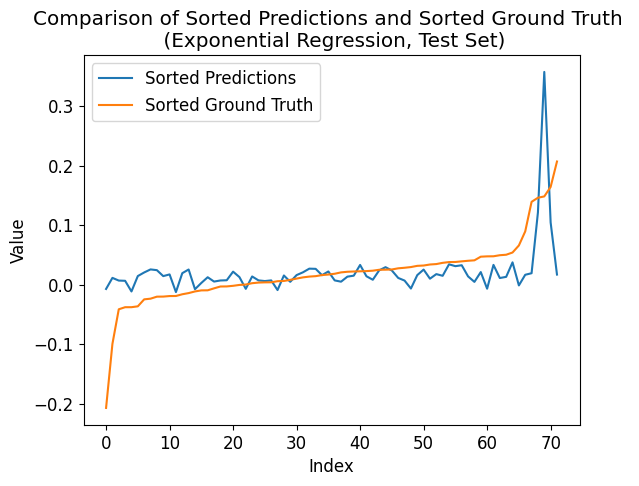

In [146]:
plot_comparison(y_test, y_pred, 'Exponential Regression, Test Set')

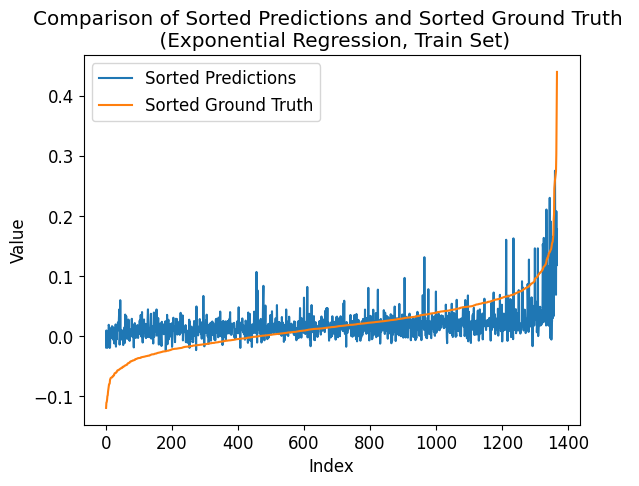

In [147]:
plot_comparison(y_train, y_pred_, 'Exponential Regression, Train Set')

### Logistic regression

#### Divide train and val datasets

In [148]:
# independent data
x = group_satcked_green

class_num = 480

# dependent data (labels/targets)
y = np.squeeze(stacked_red)
# print(np.max(y), np.min(y))

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
# print(intervals)
# Digitize the array to get the indices of the intervals
y_train = np.digitize(y_train, intervals) - 1
y_test = np.digitize(y_test, intervals) - 1
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

# to see unique elements (see if we have all 0, 1,..., class_num-1 classes, better close to all)
unique_elements = np.unique(y_train)
print("Unique elements:", unique_elements)
print("Number of unique elements:", len(unique_elements))


x_train shape: (1368, 5)
y_train shape: (1368,)
x_test shape: (72, 5)
y_test shape: (72,)
Unique elements: [ 65  71  72  75  79  80  85  88  91  94  95  99 101 102 103 104 105 106
 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124
 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142
 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160
 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178
 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196
 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214
 215 216 217 218 219 220 221 224 225 226 227 228 229 230 231 232 233 234
 235 236 237 238 239 240 241 242 244 245 248 250 252 255 256 257 259 260
 262 265 268 269 270 274 278 297 304 335 341 346 350 353 357 378 429 479]
Number of unique elements: 180


#### Fit and predict

'multinomial' (default option for multi-calss) achieves better performance than 'ovr'.

In [149]:
# fit
model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='multinomial')
# model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='ovr')

fit_result = model.fit(x_train, y_train)
print(fit_result.intercept_.shape, fit_result.coef_.shape)
# print("Coefficients:", model.coef_[0,:])
# print("Intercept:", model.intercept_[0])
print('--- --- ---')

# predict
# Use the trained model to make predictions
y_pred = model.predict(x_test)
# Alternatively, you can get the predicted probabilities for each class
y_prob = model.predict_proba(x_test)

print('y_prob.shape:', y_prob.shape)
print(np.sum(y_prob, axis = 1))
# print(y_prob[0,:])

# Print the predicted class labels
print('y_pred:', y_pred)
print('y_test:', y_test)
print('y_pred shape:', y_pred.shape, 'y_test shape:', y_test.shape)
# Print the predicted probabilities
# print(y_prob)

(180,) (180, 5)
--- --- ---
y_prob.shape: (72, 180)
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
y_pred: [162 141 167 152 162 170 168 166 162 170 152 169 260 138 167 170 157 173
 162  99 166 152 162 163 162 378 152 190 140 162 162 166 162 162 190 140
 150 180 162 166 157 147 166 170 163 166 152 138 162 202 190 162 190 166
 174 190 171 162 190 170 162 162 190 140 147 162 158 138 162 158 199 184]
y_test: [153 188 169 125 156 138 190 188 168 182 167 158 261 179 183 152 126 170
 256   0 170 174 159 138 146 263 183 164 139 139 161 172 145 151 135 122
 141 181 173 166 188 125 172 307 193 155 156 180 151 275 143 177 172 162
 178 156 153 148 165 177 219 146 169 175 157 190 136  79 202 170 163 181]
y_pred shape: (72,) y_test shape: (72,)


#### Evaluate

##### Evaluate (normal)

In previous data division, I classify data into class_num (e.g., class_num = 160) intervals (histogram, by np.digitize). Here, evaluate the results with the same number of classes (e.g., class_num = 160).

Accuracy: 0.013888888888888888
Mean squared error: 1318.5694444444443
Correlation coefficient: 0.5212639786009838
Coefficient of determination (R-squared score, R2 score): 0.20414204593680674


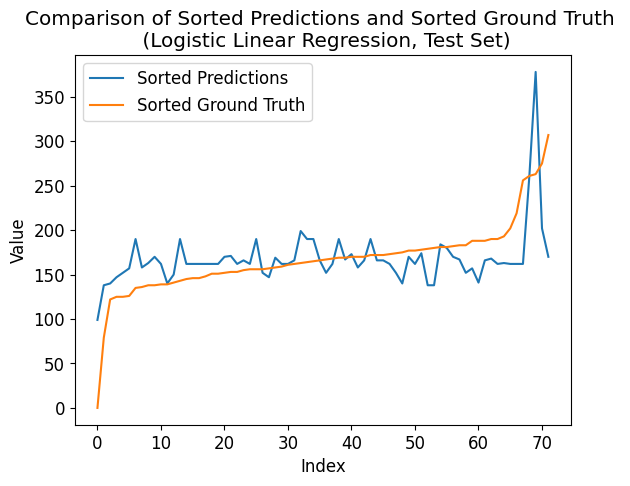

In [150]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_test, y_pred)
# print("Confusion Matrix:") # y_test doesn't include all classes, so confusion matrix is less than num_class by num_class
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#           |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)


# Sort y_pred and y_test based on y_test
plot_comparison(y_test, y_pred, 'Logistic Linear Regression, Test Set')

Accuracy: 0.04751461988304093
Mean squared error: 1031.3523391812867
Correlation coefficient: 0.504515155991152
Coefficient of determination (R-squared score, R2 score): 0.16281542471269117


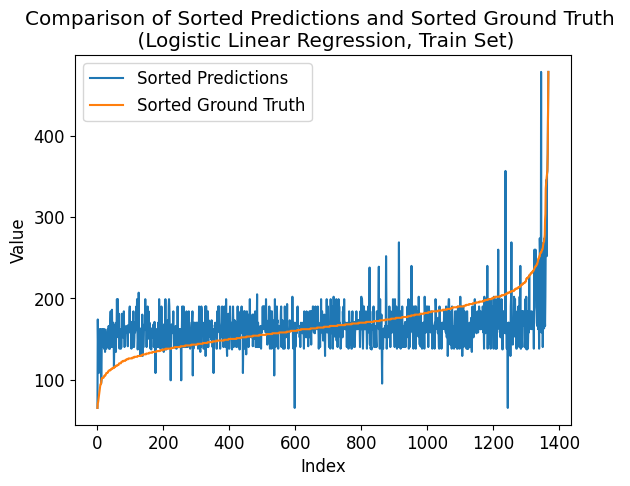

In [151]:
# predict on train
# Use the trained model to make predictions
y_pred_ = model.predict(x_train)
# Alternatively, you can get the predicted probabilities for each class
y_prob_ = model.predict_proba(x_train)

accuracy = accuracy_score(y_train, y_pred_)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_train, y_pred_)
# print("Confusion Matrix:")
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#              |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_train, y_pred_, 'Logistic Linear Regression, Train Set')

##### Evaluate (reduced)

The model is based on classifying data into class_num (e.g., class_num = 160) intervals (histogram, by np.digitize). Here, evaluate the results a smaller number of classes (e.g., reduced_class_num = 16), that is, for the example of class_num = 160 and reduced_class_num = 16, classes 0, 1, ..., 15 become one class, i.e., 0; ...; classes 144, 145, ..., 159 become one class, i.e., 15.

In [152]:
print("---- ---- ----")
# Define the boundaries for digitization
reduced_class_num = 16
intervals = np.arange(0, class_num + 1, class_num / reduced_class_num)
print(intervals)

y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
print(y_pred)
print(y_pred_test_digital)
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

---- ---- ----
[  0.  30.  60.  90. 120. 150. 180. 210. 240. 270. 300. 330. 360. 390.
 420. 450. 480.]
[162 141 167 152 162 170 168 166 162 170 152 169 260 138 167 170 157 173
 162  99 166 152 162 163 162 378 152 190 140 162 162 166 162 162 190 140
 150 180 162 166 157 147 166 170 163 166 152 138 162 202 190 162 190 166
 174 190 171 162 190 170 162 162 190 140 147 162 158 138 162 158 199 184]
[ 5  4  5  5  5  5  5  5  5  5  5  5  8  4  5  5  5  5  5  3  5  5  5  5
  5 12  5  6  4  5  5  5  5  5  6  4  5  6  5  5  5  4  5  5  5  5  5  4
  5  6  6  5  6  5  5  6  5  5  6  5  5  5  6  4  4  5  5  4  5  5  6  6]
Mean squared error: 1.6805555555555556
Correlation coefficient: 0.45002269860598076
Coefficient of determination (R-squared score, R2 score): 0.09617180205415499
Mean squared error: 1.2814327485380117
Correlation coefficient: 0.46589994996224815
Coefficient of determination (R-squared score, R2 score): 0.10132445839159054


Fixing the reduced class number, I enumerate the original class number to see what a original class number is better.

x_train shape: (1368, 5)
y_train shape: (1368,)
x_test shape: (72, 5)
y_test shape: (72,)
---- ---- ----
class_num = 16
Number of unique elements: 13
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16.]
test eval:
Mean squared error: 1.5416666666666667
Correlation coefficient: 0.4453030497739079
Coefficient of determination (R-squared score, R2 score): 0.17086834733893552
train eval:
Mean squared error: 1.1608187134502923
Correlation coefficient: 0.44378410042157646
Coefficient of determination (R-squared score, R2 score): 0.1859117170141732


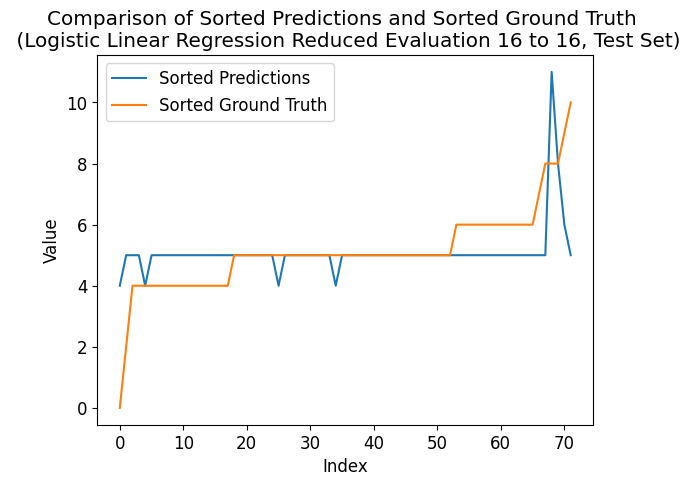

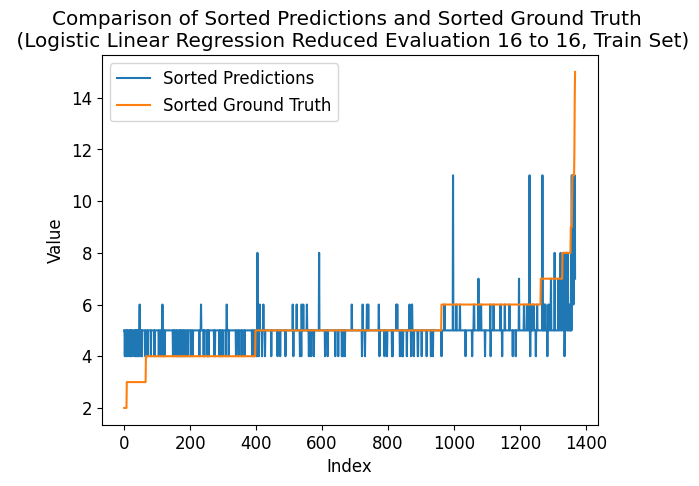

---- ---- ----
class_num = 32
Number of unique elements: 22
[ 0.  2.  4.  6.  8. 10. 12. 14. 16. 18. 20. 22. 24. 26. 28. 30. 32.]
test eval:
Mean squared error: 1.6944444444444444
Correlation coefficient: 0.4582084037679691
Coefficient of determination (R-squared score, R2 score): 0.08870214752567696
train eval:
Mean squared error: 1.1747076023391814
Correlation coefficient: 0.46298174070265335
Coefficient of determination (R-squared score, R2 score): 0.17617136602126982


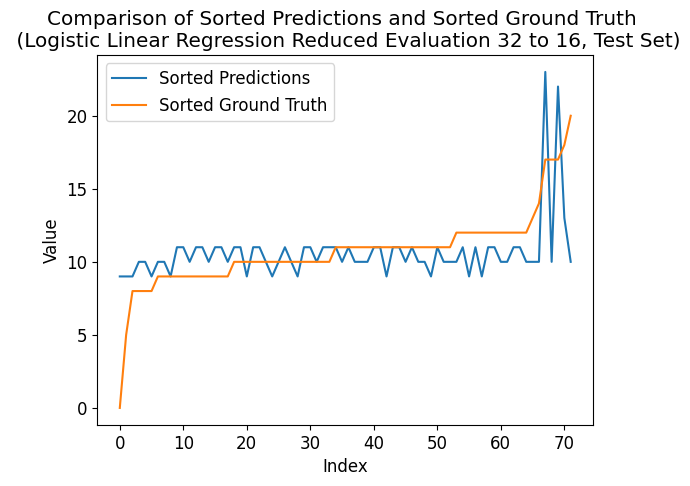

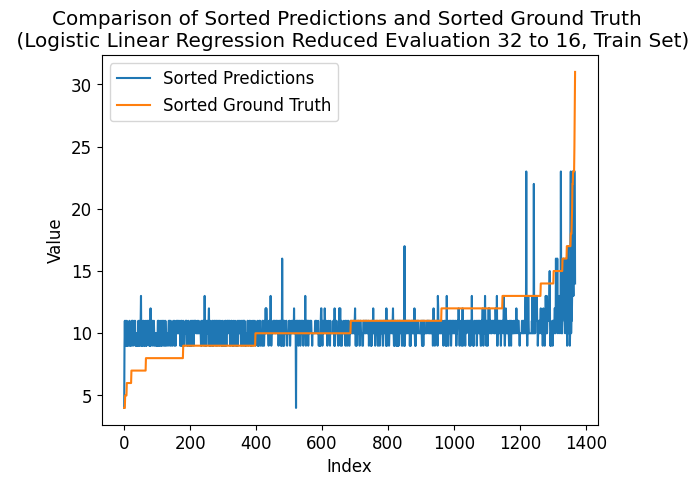

---- ---- ----
class_num = 48
Number of unique elements: 30
[ 0.  3.  6.  9. 12. 15. 18. 21. 24. 27. 30. 33. 36. 39. 42. 45. 48.]
test eval:
Mean squared error: 1.8611111111111112
Correlation coefficient: 0.43969624320050904
Coefficient of determination (R-squared score, R2 score): -0.0009337068160597539
train eval:
Mean squared error: 1.2478070175438596
Correlation coefficient: 0.4327504506197096
Coefficient of determination (R-squared score, R2 score): 0.12490636079546202


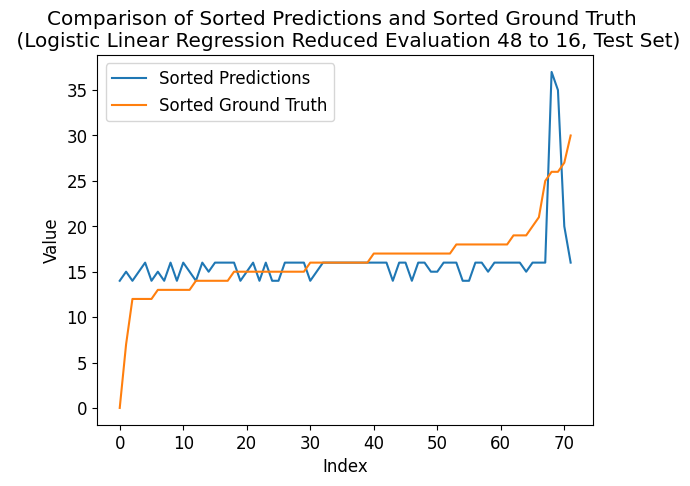

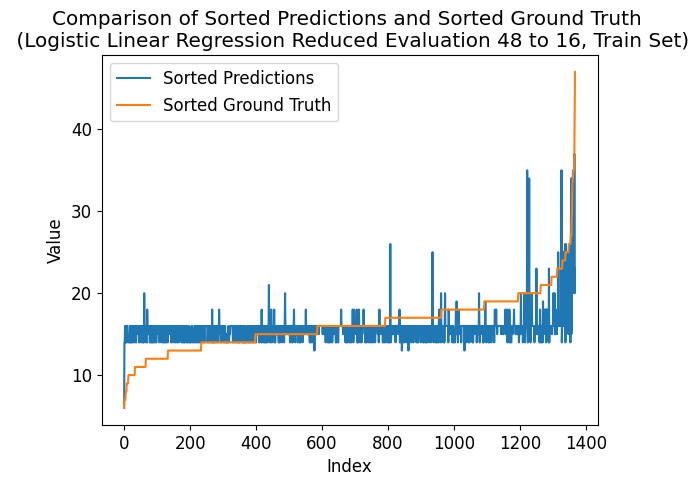

---- ---- ----
class_num = 64
Number of unique elements: 39
[ 0.  4.  8. 12. 16. 20. 24. 28. 32. 36. 40. 44. 48. 52. 56. 60. 64.]
test eval:
Mean squared error: 1.5416666666666667
Correlation coefficient: 0.4427237599869571
Coefficient of determination (R-squared score, R2 score): 0.17086834733893552
train eval:
Mean squared error: 1.1834795321637428
Correlation coefficient: 0.45276394446722484
Coefficient of determination (R-squared score, R2 score): 0.17001956539417284


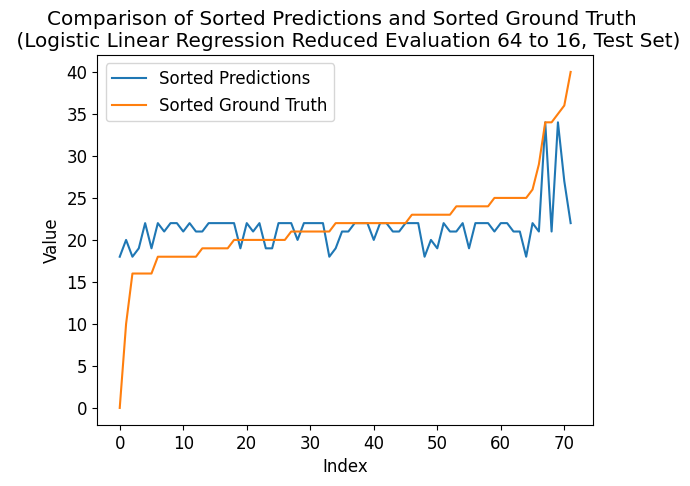

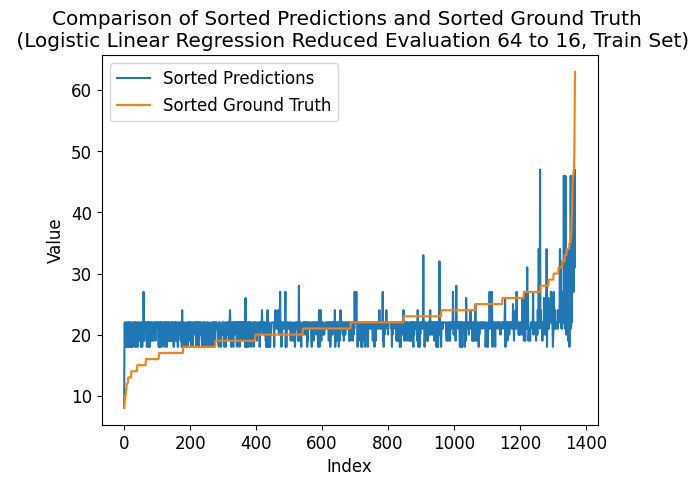

---- ---- ----
class_num = 80
Number of unique elements: 47
[ 0.  5. 10. 15. 20. 25. 30. 35. 40. 45. 50. 55. 60. 65. 70. 75. 80.]
test eval:
Mean squared error: 1.6527777777777777
Correlation coefficient: 0.4461650275964236
Coefficient of determination (R-squared score, R2 score): 0.11111111111111116
train eval:
Mean squared error: 1.1769005847953216
Correlation coefficient: 0.47426325398766034
Coefficient of determination (R-squared score, R2 score): 0.17463341586449554


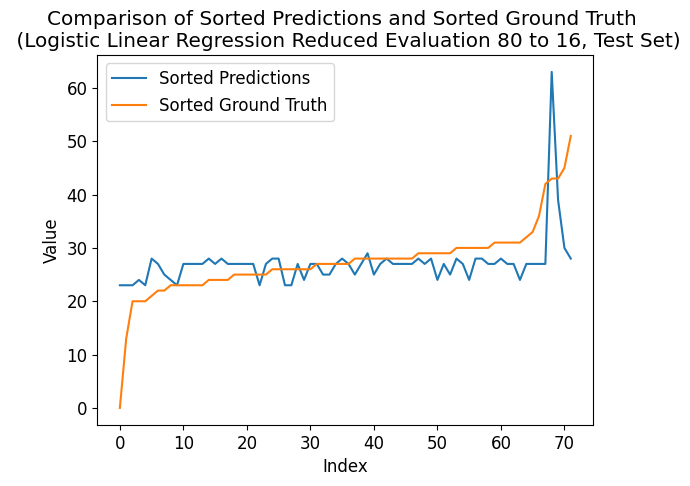

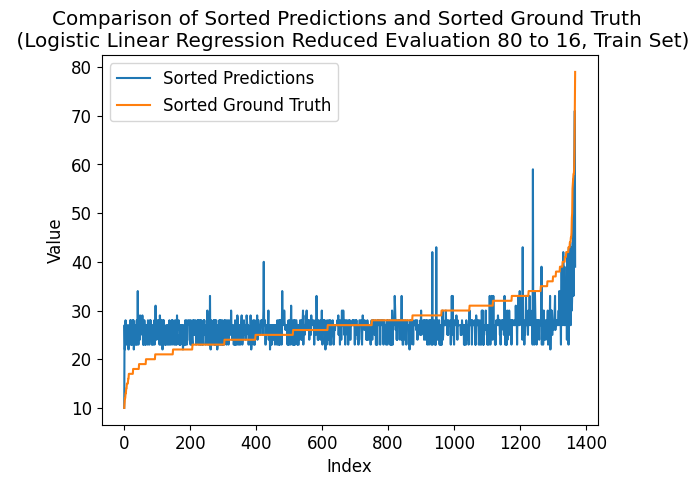

---- ---- ----
class_num = 96
Number of unique elements: 53
[ 0.  6. 12. 18. 24. 30. 36. 42. 48. 54. 60. 66. 72. 78. 84. 90. 96.]
test eval:
Mean squared error: 1.5972222222222223
Correlation coefficient: 0.48152746604882574
Coefficient of determination (R-squared score, R2 score): 0.1409897292250234
train eval:
Mean squared error: 1.2149122807017543
Correlation coefficient: 0.45973521922573
Coefficient of determination (R-squared score, R2 score): 0.14797561314707552


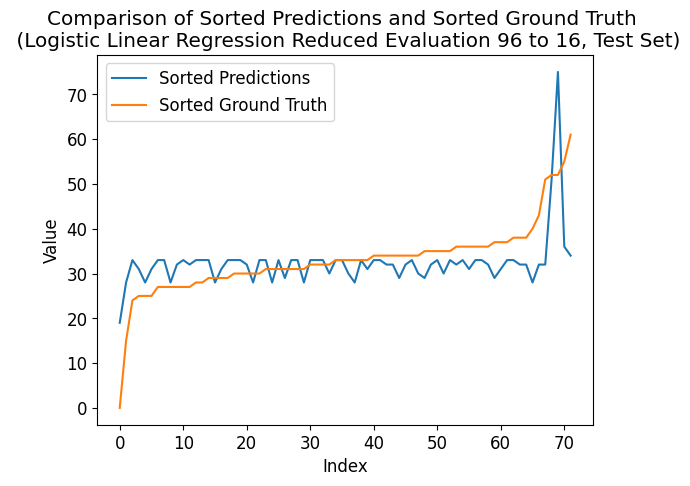

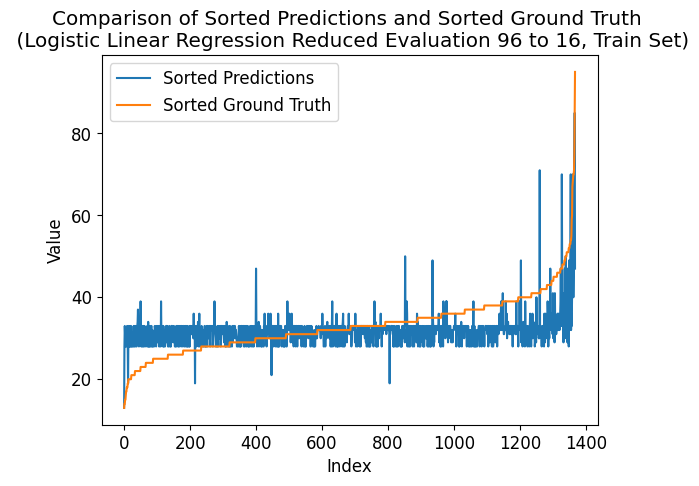

---- ---- ----
class_num = 112
Number of unique elements: 61
[  0.   7.  14.  21.  28.  35.  42.  49.  56.  63.  70.  77.  84.  91.
  98. 105. 112.]
test eval:
Mean squared error: 1.4305555555555556
Correlation coefficient: 0.5105003166926159
Coefficient of determination (R-squared score, R2 score): 0.23062558356676
train eval:
Mean squared error: 1.1739766081871346
Correlation coefficient: 0.45996186883524565
Coefficient of determination (R-squared score, R2 score): 0.1766840160735279


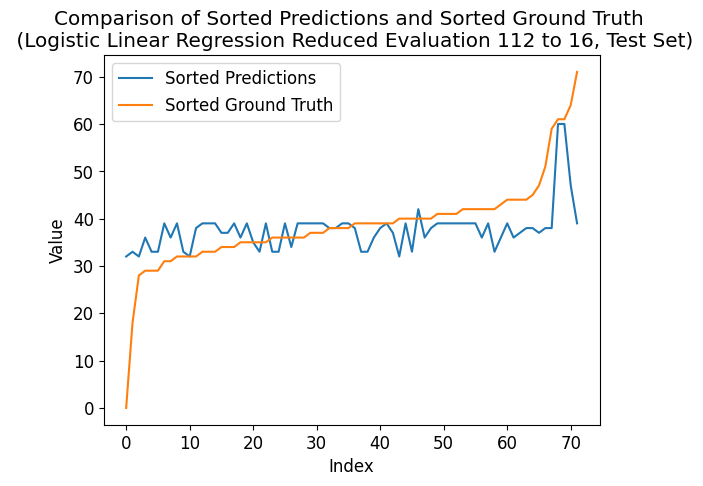

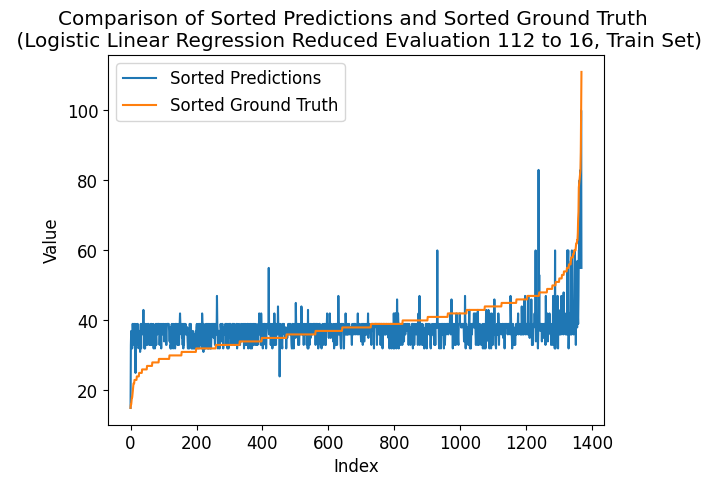

---- ---- ----
class_num = 128
Number of unique elements: 68
[  0.   8.  16.  24.  32.  40.  48.  56.  64.  72.  80.  88.  96. 104.
 112. 120. 128.]
test eval:
Mean squared error: 1.4166666666666667
Correlation coefficient: 0.5145106276111256
Coefficient of determination (R-squared score, R2 score): 0.23809523809523814
train eval:
Mean squared error: 1.2185672514619883
Correlation coefficient: 0.4592849257869412
Coefficient of determination (R-squared score, R2 score): 0.14541236288578518


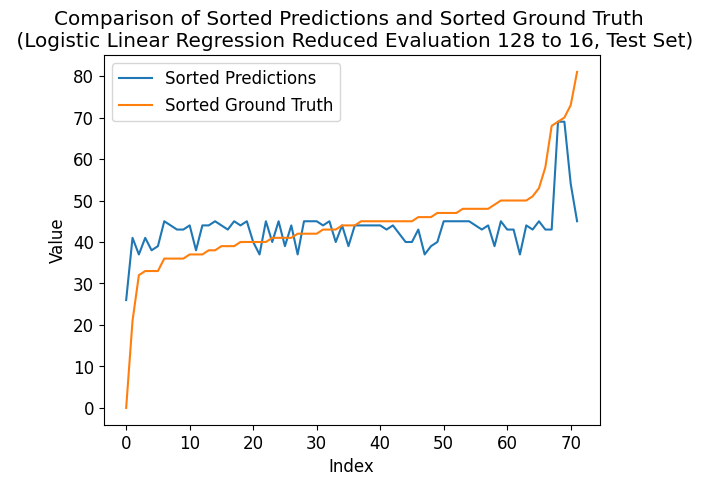

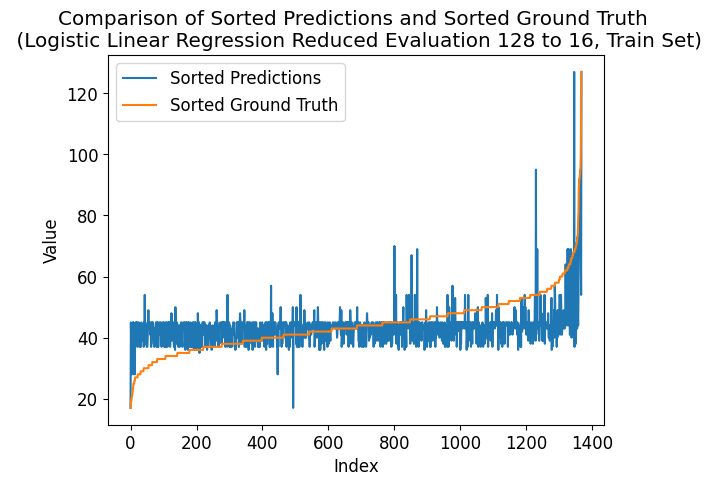

---- ---- ----
class_num = 144
Number of unique elements: 75
[  0.   9.  18.  27.  36.  45.  54.  63.  72.  81.  90.  99. 108. 117.
 126. 135. 144.]
test eval:
Mean squared error: 1.7083333333333333
Correlation coefficient: 0.4878270961758985
Coefficient of determination (R-squared score, R2 score): 0.08123249299719892
train eval:
Mean squared error: 1.2002923976608186
Correlation coefficient: 0.4878416894302014
Coefficient of determination (R-squared score, R2 score): 0.1582286141922371


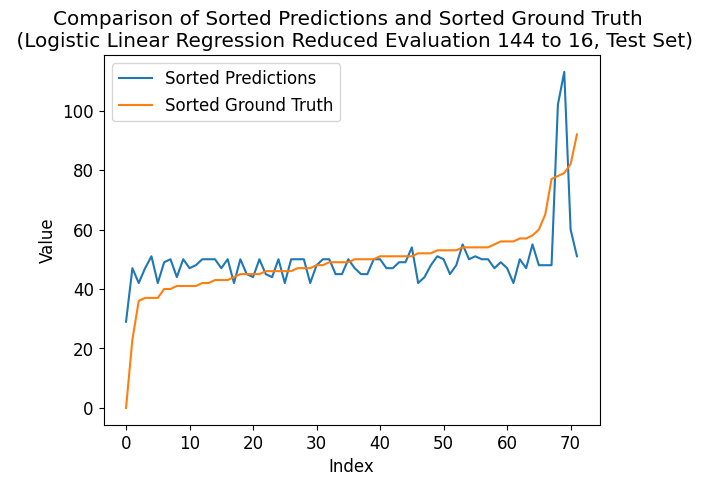

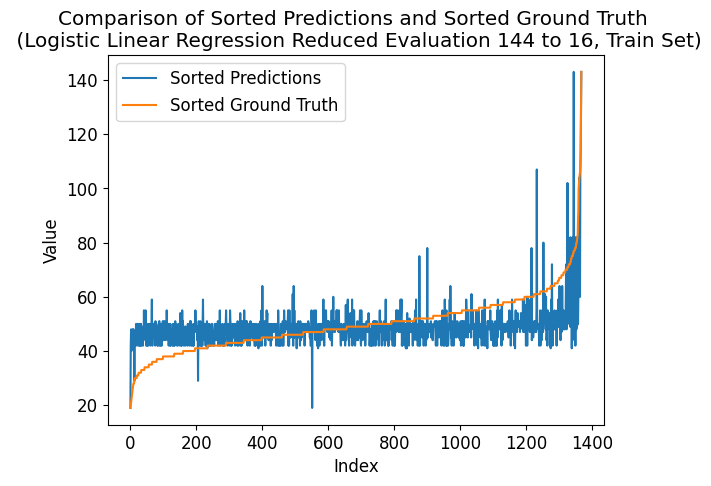

---- ---- ----
class_num = 160
Number of unique elements: 80
[  0.  10.  20.  30.  40.  50.  60.  70.  80.  90. 100. 110. 120. 130.
 140. 150. 160.]
test eval:
Mean squared error: 1.4027777777777777
Correlation coefficient: 0.5081518272956013
Coefficient of determination (R-squared score, R2 score): 0.24556489262371617
train eval:
Mean squared error: 1.1608187134502923
Correlation coefficient: 0.4853767881800101
Coefficient of determination (R-squared score, R2 score): 0.1859117170141732


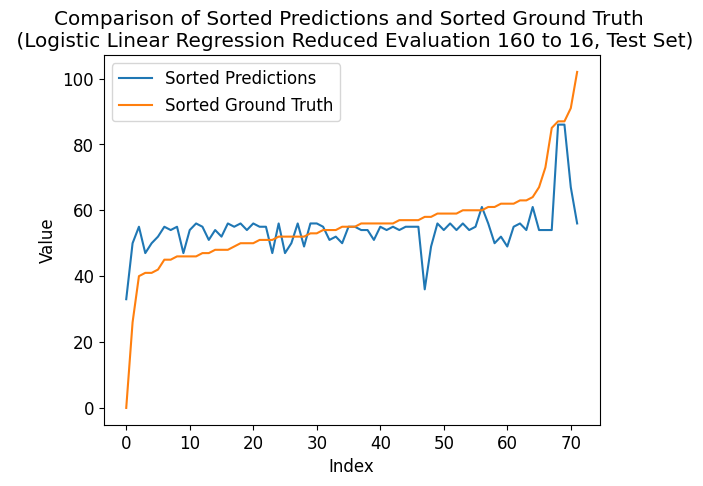

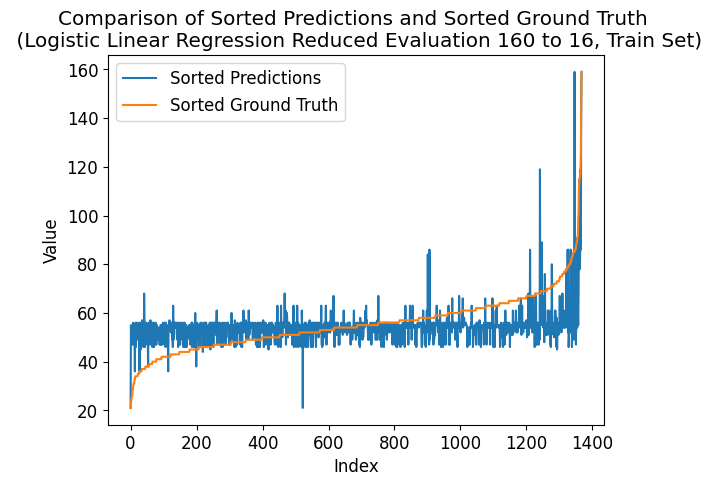

---- ---- ----
class_num = 176
Number of unique elements: 85
[  0.  11.  22.  33.  44.  55.  66.  77.  88.  99. 110. 121. 132. 143.
 154. 165. 176.]
test eval:
Mean squared error: 1.5694444444444444
Correlation coefficient: 0.49056003058201525
Coefficient of determination (R-squared score, R2 score): 0.15592903828197946
train eval:
Mean squared error: 1.2485380116959064
Correlation coefficient: 0.47056104507422336
Coefficient of determination (R-squared score, R2 score): 0.12439371074320393


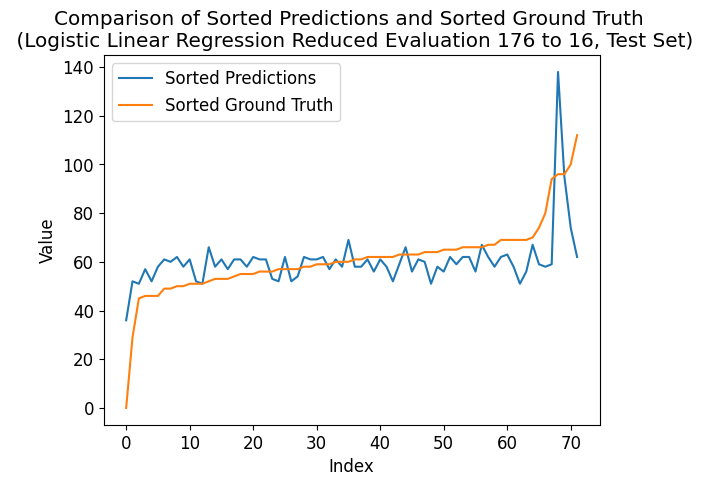

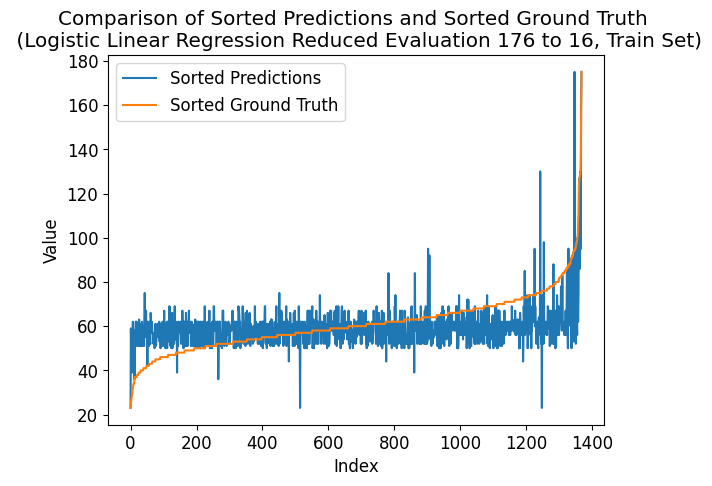

---- ---- ----
class_num = 192
Number of unique elements: 93
[  0.  12.  24.  36.  48.  60.  72.  84.  96. 108. 120. 132. 144. 156.
 168. 180. 192.]
test eval:
Mean squared error: 1.5972222222222223
Correlation coefficient: 0.4795115105550837
Coefficient of determination (R-squared score, R2 score): 0.1409897292250234
train eval:
Mean squared error: 1.1776315789473684
Correlation coefficient: 0.49138666021574107
Coefficient of determination (R-squared score, R2 score): 0.17412076581223745


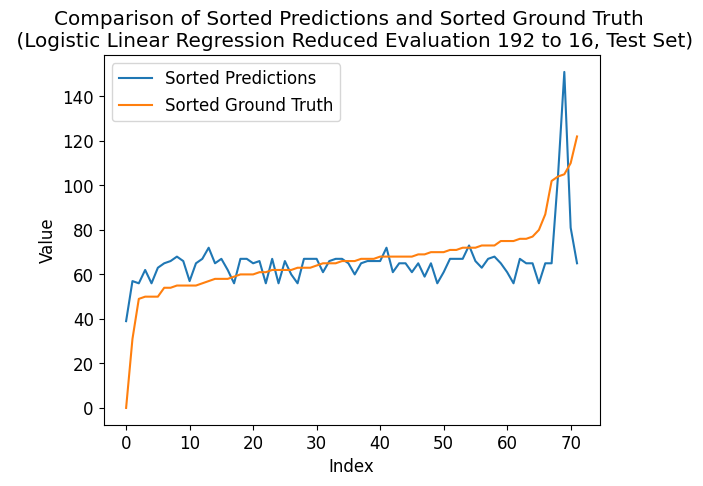

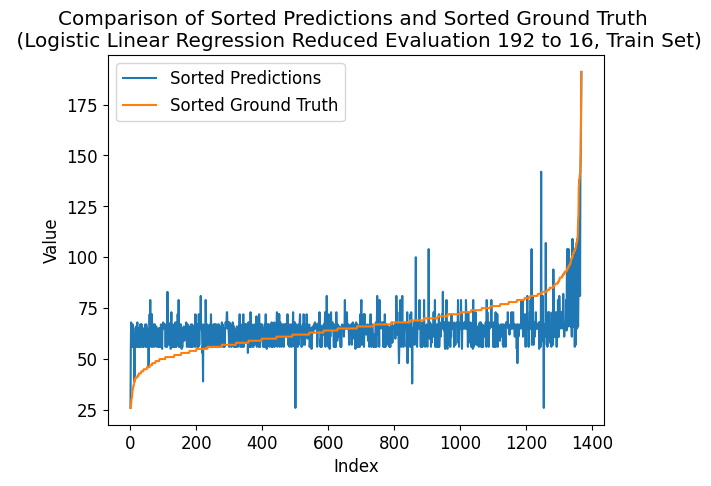

---- ---- ----
class_num = 208
Number of unique elements: 96
[  0.  13.  26.  39.  52.  65.  78.  91. 104. 117. 130. 143. 156. 169.
 182. 195. 208.]
test eval:
Mean squared error: 1.6527777777777777
Correlation coefficient: 0.46381682852195877
Coefficient of determination (R-squared score, R2 score): 0.11111111111111116
train eval:
Mean squared error: 1.1732456140350878
Correlation coefficient: 0.4915007187113366
Coefficient of determination (R-squared score, R2 score): 0.17719666612578588


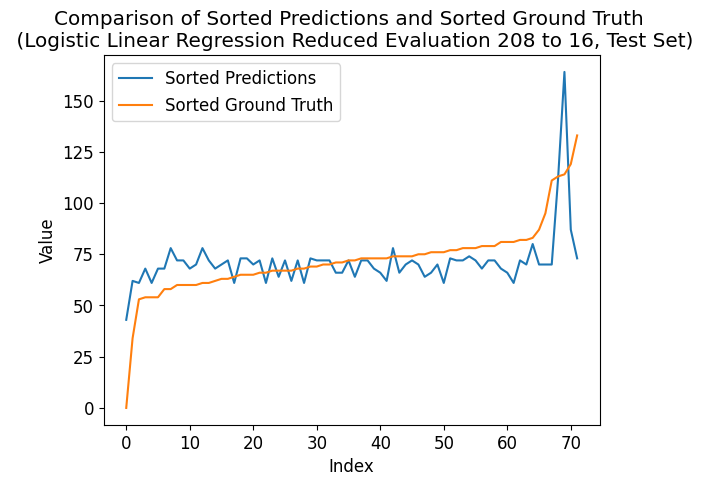

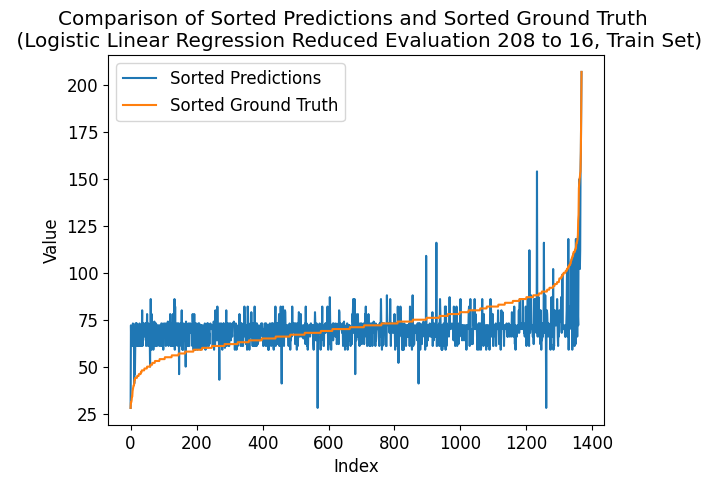

---- ---- ----
class_num = 224
Number of unique elements: 99
[  0.  14.  28.  42.  56.  70.  84.  98. 112. 126. 140. 154. 168. 182.
 196. 210. 224.]
test eval:
Mean squared error: 1.6805555555555556
Correlation coefficient: 0.45002269860598076
Coefficient of determination (R-squared score, R2 score): 0.09617180205415499
train eval:
Mean squared error: 1.182748538011696
Correlation coefficient: 0.4664117652507316
Coefficient of determination (R-squared score, R2 score): 0.17053221544643093


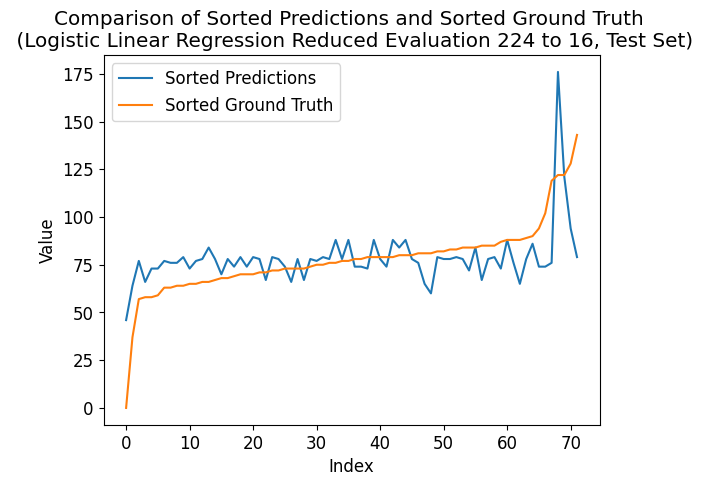

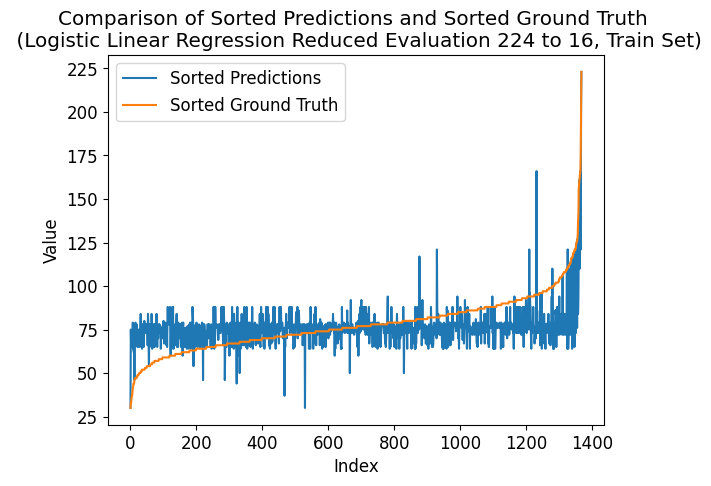

---- ---- ----
class_num = 240
Number of unique elements: 107
[  0.  15.  30.  45.  60.  75.  90. 105. 120. 135. 150. 165. 180. 195.
 210. 225. 240.]
test eval:
Mean squared error: 1.6527777777777777
Correlation coefficient: 0.4477622581118343
Coefficient of determination (R-squared score, R2 score): 0.11111111111111116
train eval:
Mean squared error: 1.1805555555555556
Correlation coefficient: 0.4876444824357047
Coefficient of determination (R-squared score, R2 score): 0.1720701656032052


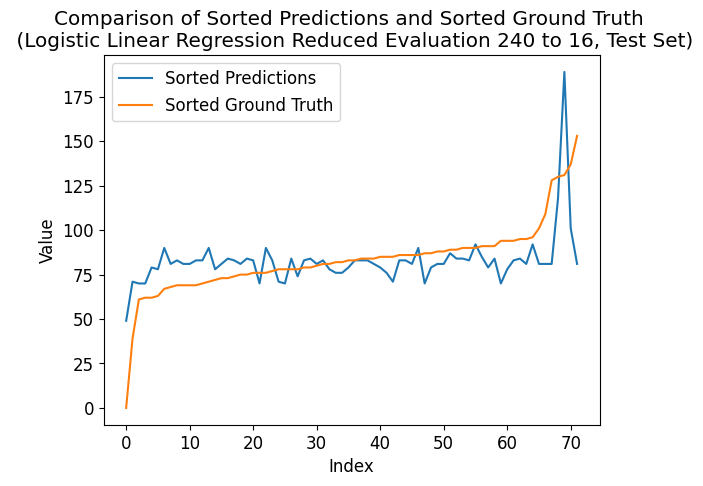

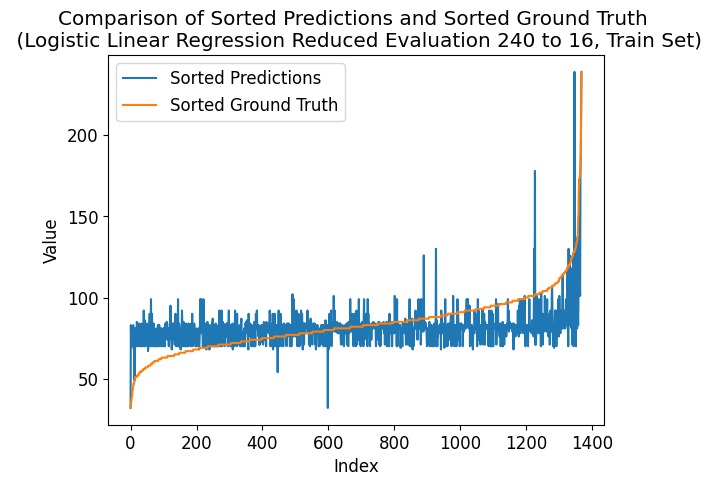

---- ---- ----
class_num = 256
Number of unique elements: 112
[  0.  16.  32.  48.  64.  80.  96. 112. 128. 144. 160. 176. 192. 208.
 224. 240. 256.]
test eval:
Mean squared error: 1.8333333333333333
Correlation coefficient: 0.46074029714410486
Coefficient of determination (R-squared score, R2 score): 0.014005602240896309
train eval:
Mean squared error: 1.182748538011696
Correlation coefficient: 0.5001806407541329
Coefficient of determination (R-squared score, R2 score): 0.17053221544643093


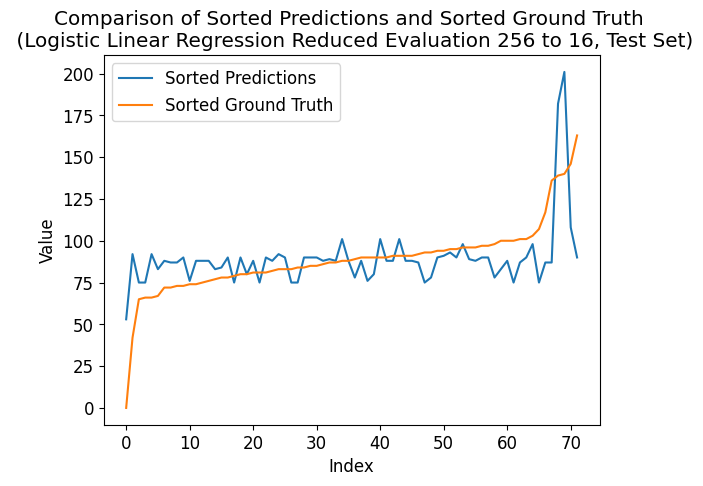

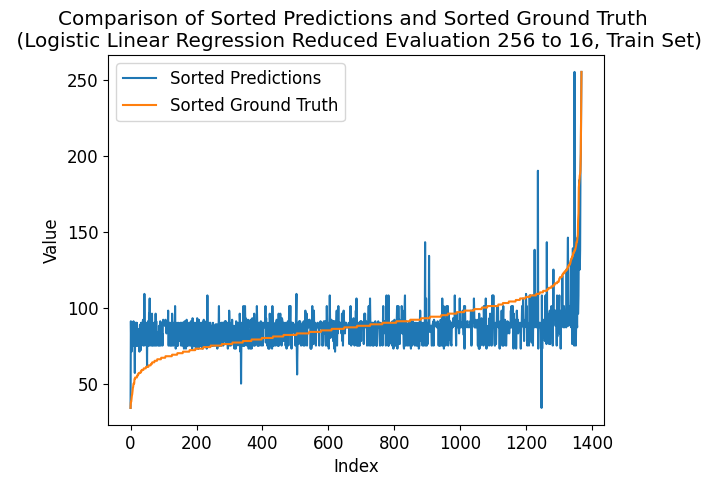

---- ---- ----
class_num = 272
Number of unique elements: 118
[  0.  17.  34.  51.  68.  85. 102. 119. 136. 153. 170. 187. 204. 221.
 238. 255. 272.]
test eval:
Mean squared error: 1.6527777777777777
Correlation coefficient: 0.4826532902908703
Coefficient of determination (R-squared score, R2 score): 0.11111111111111116
train eval:
Mean squared error: 1.2887426900584795
Correlation coefficient: 0.4549296545627164
Coefficient of determination (R-squared score, R2 score): 0.09619795786900975


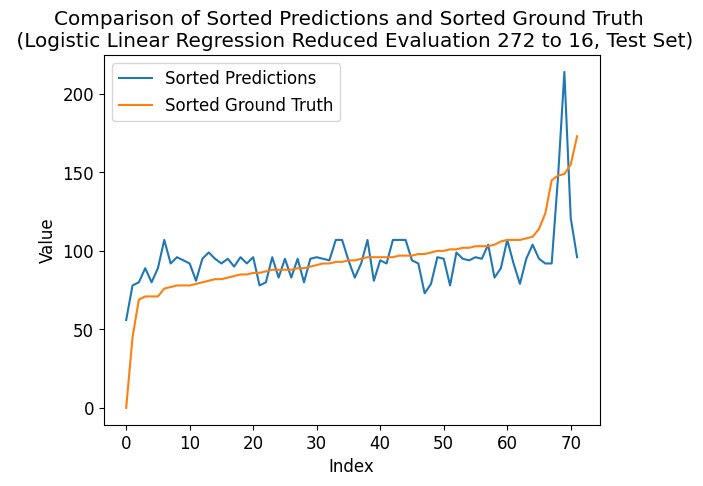

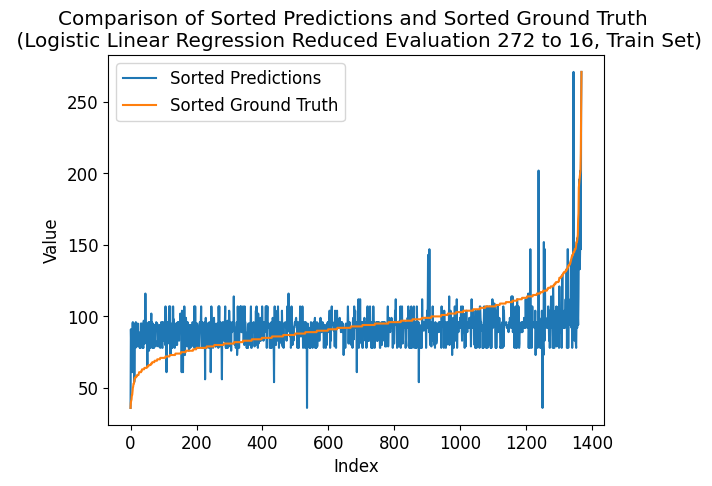

---- ---- ----
class_num = 288
Number of unique elements: 123
[  0.  18.  36.  54.  72.  90. 108. 126. 144. 162. 180. 198. 216. 234.
 252. 270. 288.]
test eval:
Mean squared error: 1.5138888888888888
Correlation coefficient: 0.4980726241918156
Coefficient of determination (R-squared score, R2 score): 0.1858076563958917
train eval:
Mean squared error: 1.1805555555555556
Correlation coefficient: 0.49649744134825496
Coefficient of determination (R-squared score, R2 score): 0.1720701656032052


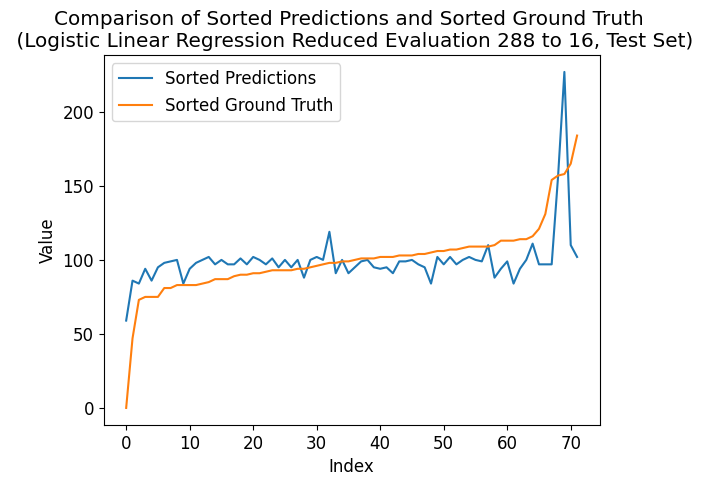

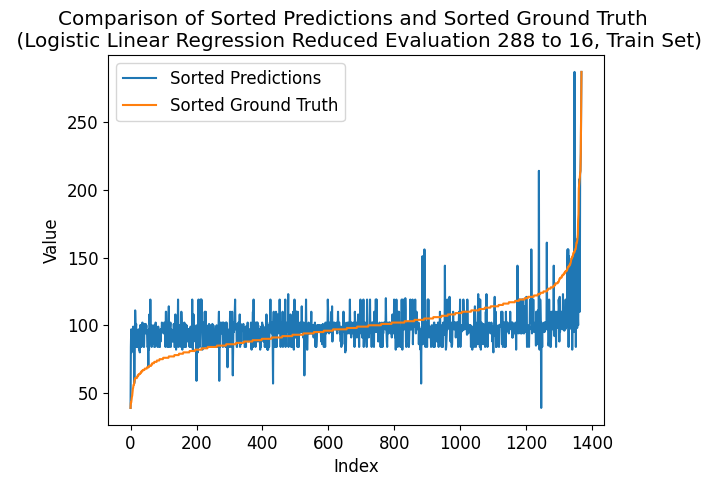

---- ---- ----
class_num = 304
Number of unique elements: 128
[  0.  19.  38.  57.  76.  95. 114. 133. 152. 171. 190. 209. 228. 247.
 266. 285. 304.]
test eval:
Mean squared error: 1.7638888888888888
Correlation coefficient: 0.4798922788412493
Coefficient of determination (R-squared score, R2 score): 0.05135387488328669
train eval:
Mean squared error: 1.2485380116959064
Correlation coefficient: 0.47763995189741704
Coefficient of determination (R-squared score, R2 score): 0.12439371074320393


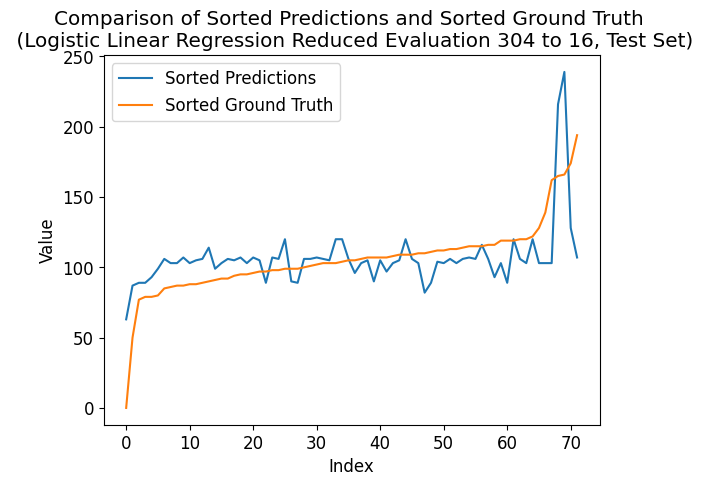

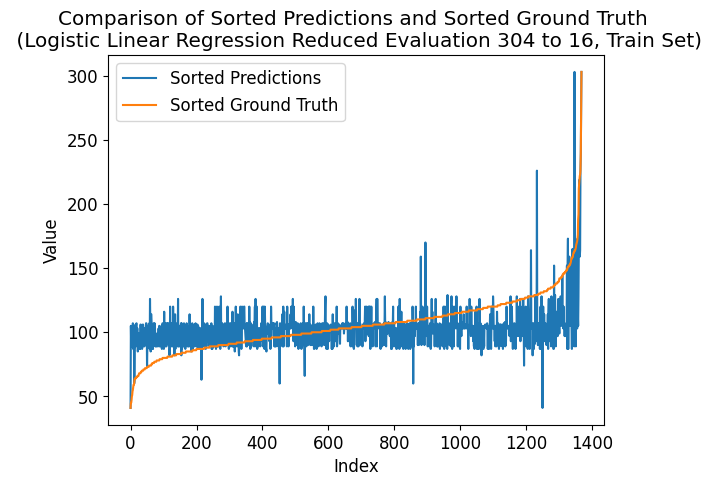

---- ---- ----
class_num = 320
Number of unique elements: 131
[  0.  20.  40.  60.  80. 100. 120. 140. 160. 180. 200. 220. 240. 260.
 280. 300. 320.]
test eval:
Mean squared error: 1.7222222222222223
Correlation coefficient: 0.4578610120916426
Coefficient of determination (R-squared score, R2 score): 0.07376283846872078
train eval:
Mean squared error: 1.246345029239766
Correlation coefficient: 0.46404033191762234
Coefficient of determination (R-squared score, R2 score): 0.1259316608999782


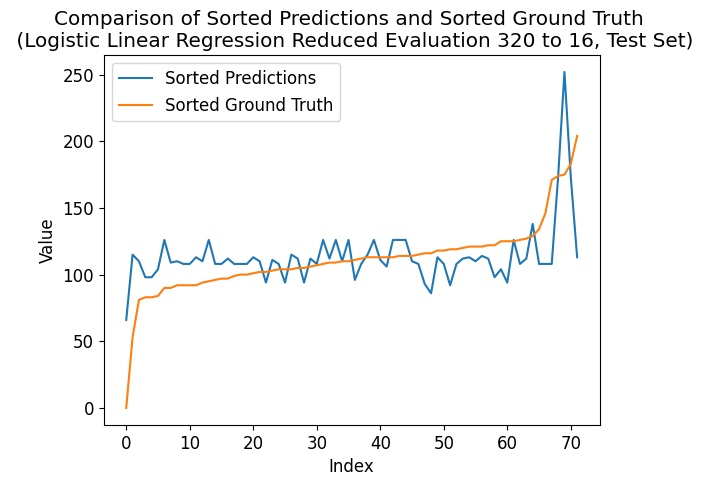

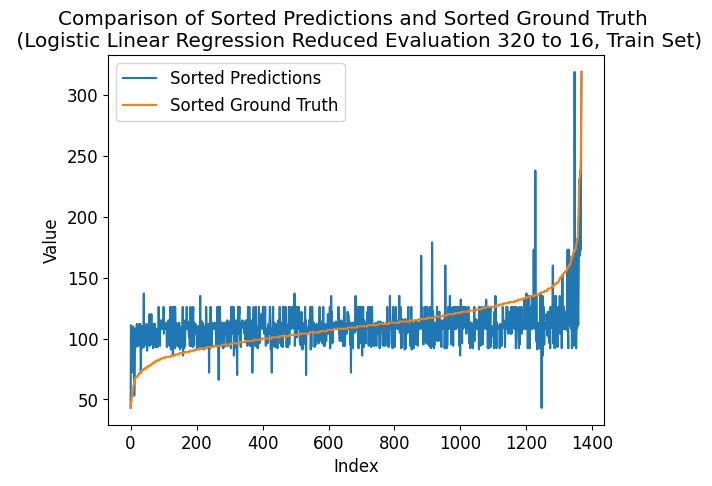

---- ---- ----
class_num = 336
Number of unique elements: 137
[  0.  21.  42.  63.  84. 105. 126. 147. 168. 189. 210. 231. 252. 273.
 294. 315. 336.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.41491897039022546
Coefficient of determination (R-squared score, R2 score): 0.02147525676937445
train eval:
Mean squared error: 1.2353801169590644
Correlation coefficient: 0.4933076950057393
Coefficient of determination (R-squared score, R2 score): 0.13362141168384933


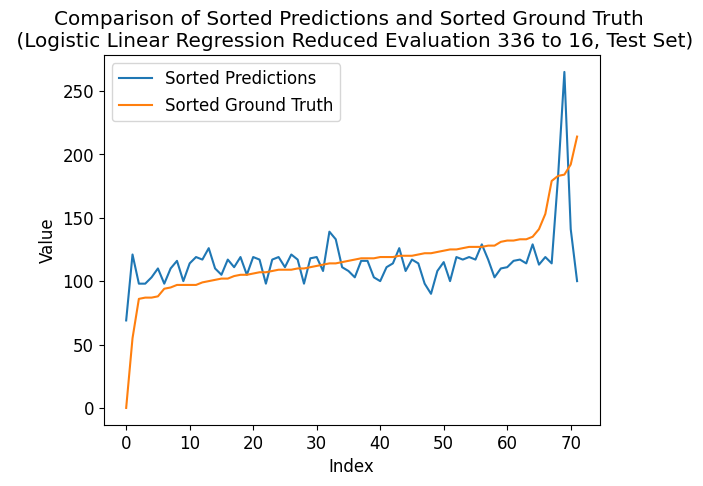

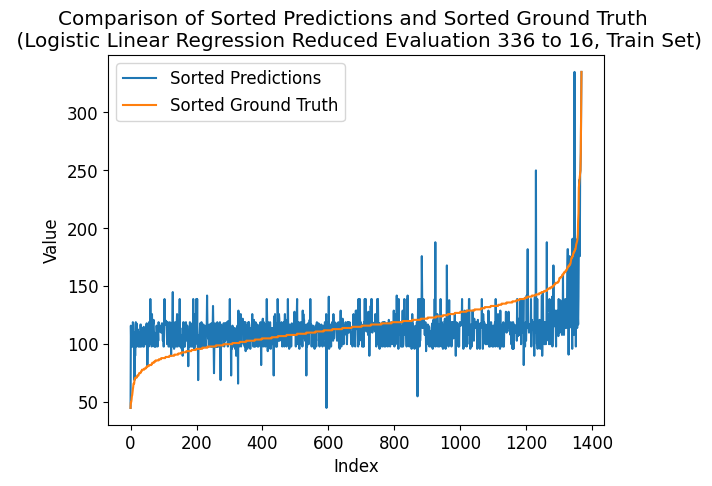

---- ---- ----
class_num = 352
Number of unique elements: 142
[  0.  22.  44.  66.  88. 110. 132. 154. 176. 198. 220. 242. 264. 286.
 308. 330. 352.]
test eval:
Mean squared error: 1.8611111111111112
Correlation coefficient: 0.46310627542869415
Coefficient of determination (R-squared score, R2 score): -0.0009337068160597539
train eval:
Mean squared error: 1.2521929824561404
Correlation coefficient: 0.4731800075940238
Coefficient of determination (R-squared score, R2 score): 0.1218304604819136


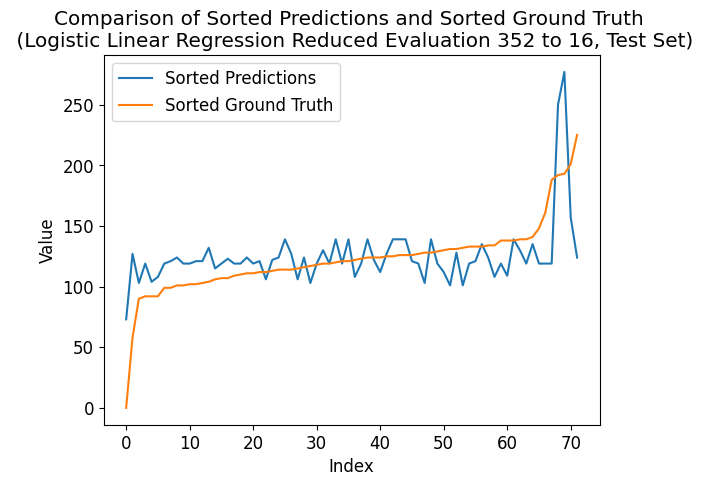

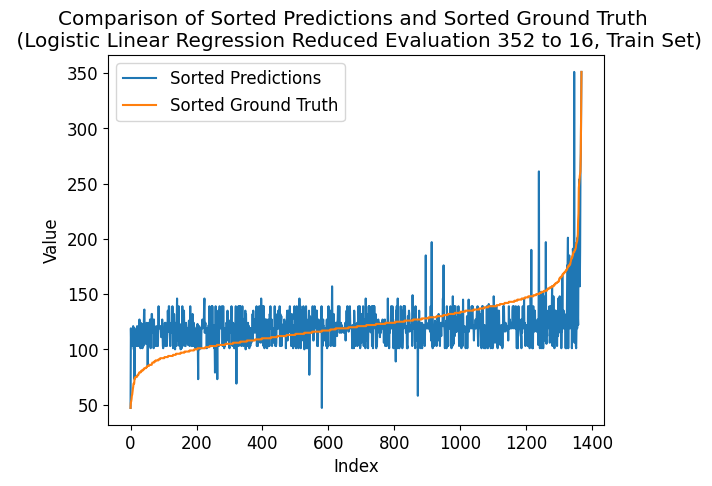

---- ---- ----
class_num = 368
Number of unique elements: 145
[  0.  23.  46.  69.  92. 115. 138. 161. 184. 207. 230. 253. 276. 299.
 322. 345. 368.]
test eval:
Mean squared error: 1.5555555555555556
Correlation coefficient: 0.5017571314715864
Coefficient of determination (R-squared score, R2 score): 0.1633986928104575
train eval:
Mean squared error: 1.222953216374269
Correlation coefficient: 0.4622643321695171
Coefficient of determination (R-squared score, R2 score): 0.14233646257223664


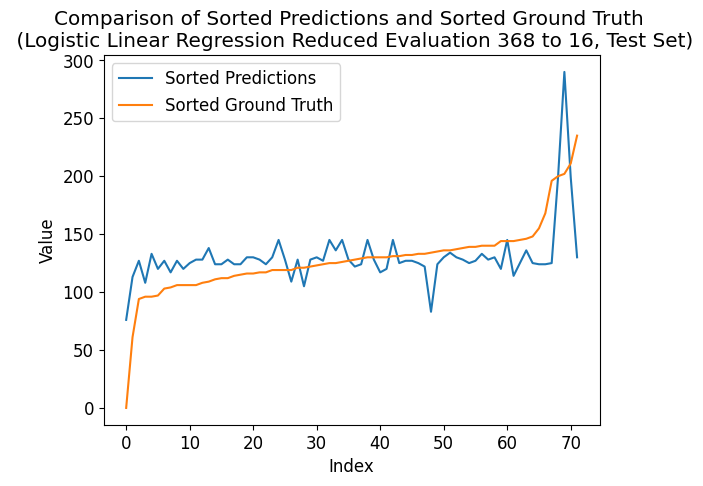

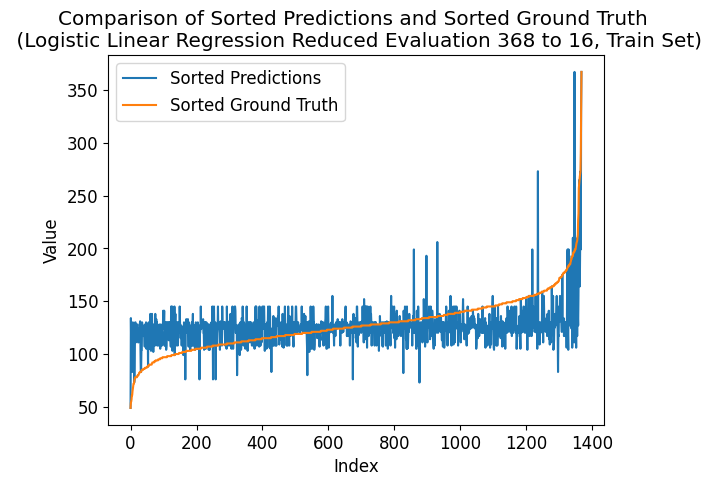

---- ---- ----
class_num = 384
Number of unique elements: 154
[  0.  24.  48.  72.  96. 120. 144. 168. 192. 216. 240. 264. 288. 312.
 336. 360. 384.]
test eval:
Mean squared error: 1.8055555555555556
Correlation coefficient: 0.42511005537204366
Coefficient of determination (R-squared score, R2 score): 0.028944911297852483
train eval:
Mean squared error: 1.263157894736842
Correlation coefficient: 0.4766367538107654
Coefficient of determination (R-squared score, R2 score): 0.11414070969804246


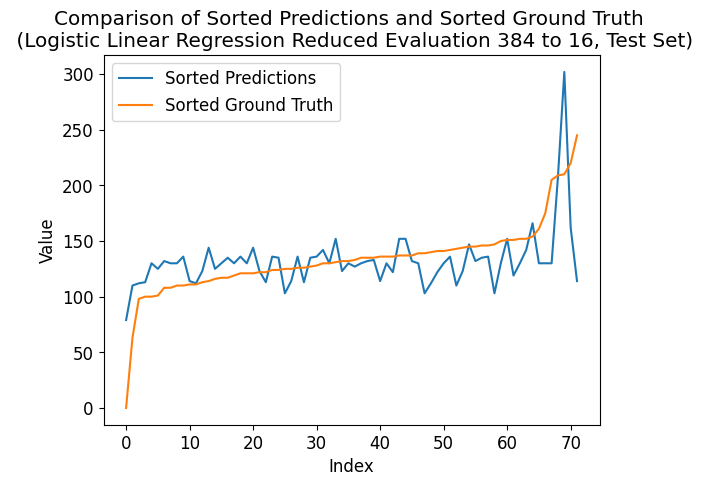

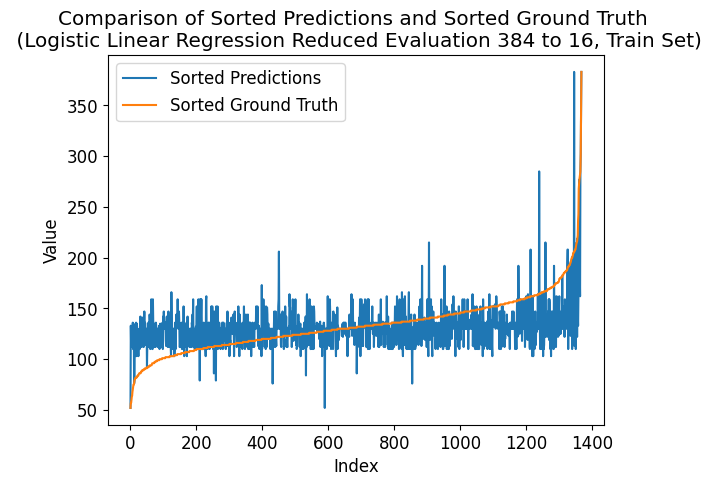

---- ---- ----
class_num = 400
Number of unique elements: 154
[  0.  25.  50.  75. 100. 125. 150. 175. 200. 225. 250. 275. 300. 325.
 350. 375. 400.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.4818079423309307
Coefficient of determination (R-squared score, R2 score): 0.02147525676937445
train eval:
Mean squared error: 1.2288011695906433
Correlation coefficient: 0.4855109861861982
Coefficient of determination (R-squared score, R2 score): 0.13823526215417203


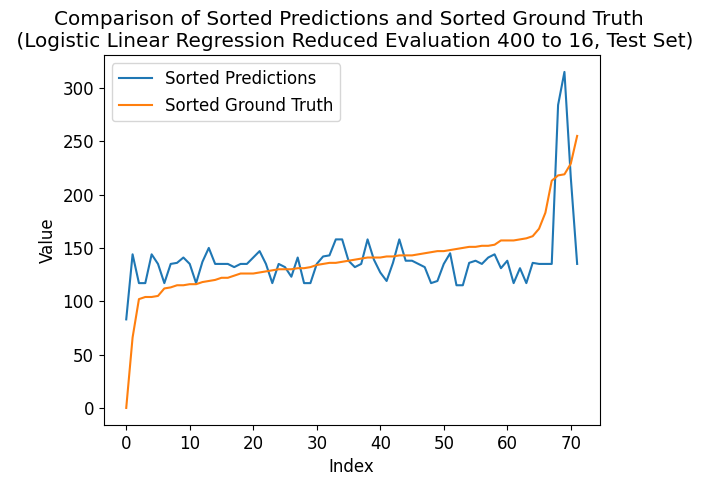

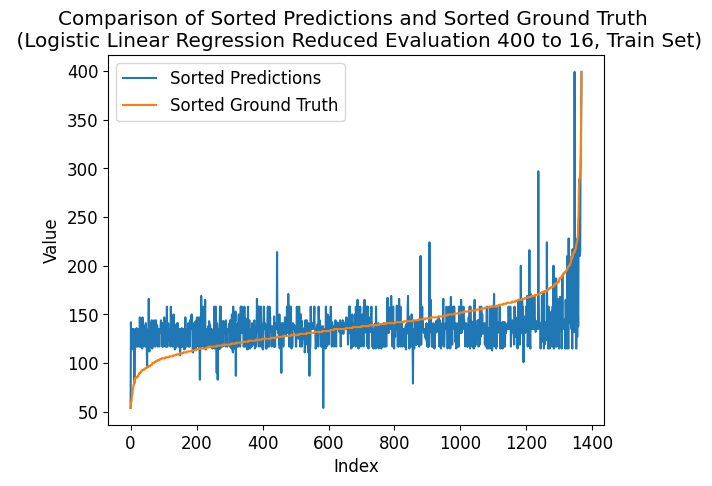

---- ---- ----
class_num = 416
Number of unique elements: 159
[  0.  26.  52.  78. 104. 130. 156. 182. 208. 234. 260. 286. 312. 338.
 364. 390. 416.]
test eval:
Mean squared error: 1.9166666666666667
Correlation coefficient: 0.44022126465290107
Coefficient of determination (R-squared score, R2 score): -0.03081232492997188
train eval:
Mean squared error: 1.2002923976608186
Correlation coefficient: 0.49459953566695747
Coefficient of determination (R-squared score, R2 score): 0.1582286141922371


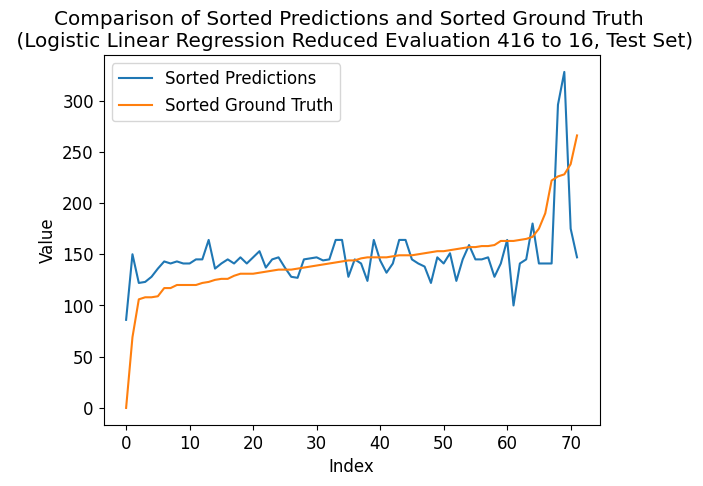

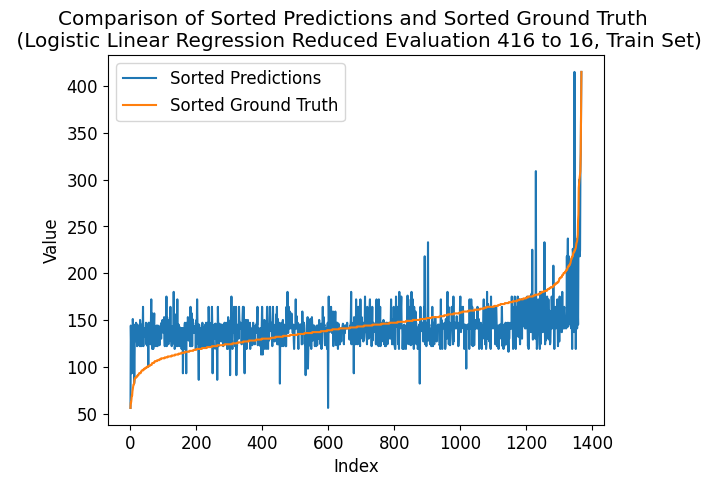

---- ---- ----
class_num = 432
Number of unique elements: 165
[  0.  27.  54.  81. 108. 135. 162. 189. 216. 243. 270. 297. 324. 351.
 378. 405. 432.]
test eval:
Mean squared error: 1.6944444444444444
Correlation coefficient: 0.45616291871853465
Coefficient of determination (R-squared score, R2 score): 0.08870214752567696
train eval:
Mean squared error: 1.2383040935672514
Correlation coefficient: 0.48648322507084046
Coefficient of determination (R-squared score, R2 score): 0.13157081147481708


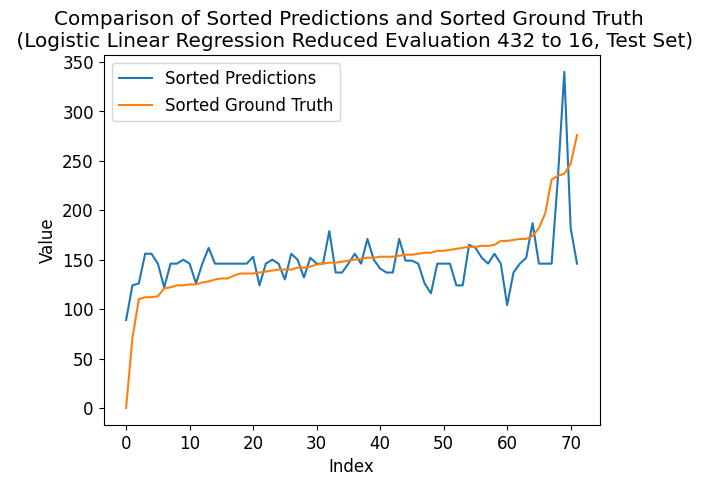

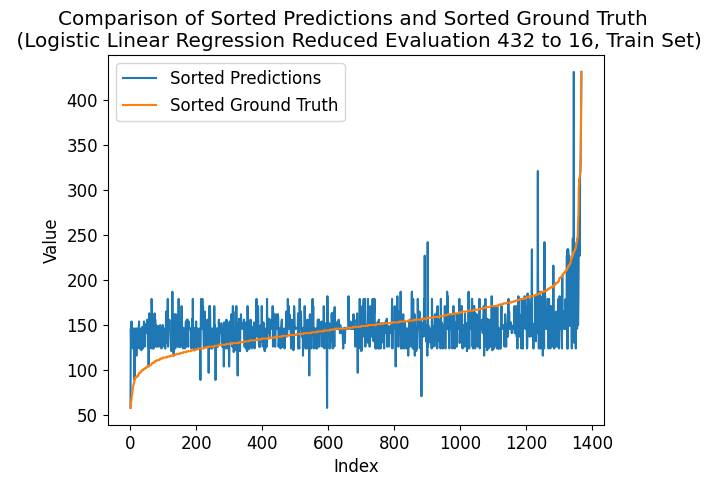

---- ---- ----
class_num = 448
Number of unique elements: 170
[  0.  28.  56.  84. 112. 140. 168. 196. 224. 252. 280. 308. 336. 364.
 392. 420. 448.]
test eval:
Mean squared error: 1.6527777777777777
Correlation coefficient: 0.4645332380852188
Coefficient of determination (R-squared score, R2 score): 0.11111111111111116
train eval:
Mean squared error: 1.2719298245614035
Correlation coefficient: 0.46970184377210306
Coefficient of determination (R-squared score, R2 score): 0.1079889090709455


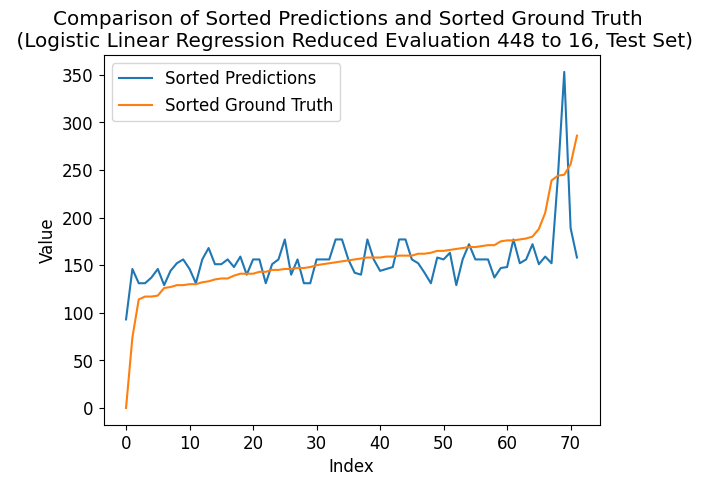

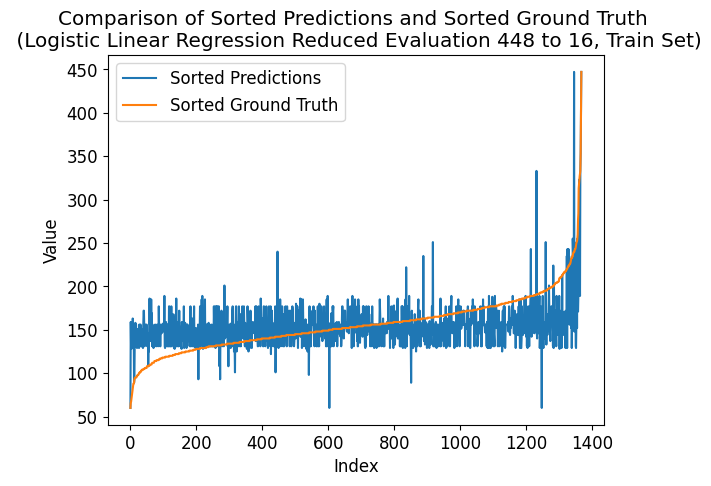

---- ---- ----
class_num = 464
Number of unique elements: 173
[  0.  29.  58.  87. 116. 145. 174. 203. 232. 261. 290. 319. 348. 377.
 406. 435. 464.]
test eval:
Mean squared error: 1.6944444444444444
Correlation coefficient: 0.4569813782824711
Coefficient of determination (R-squared score, R2 score): 0.08870214752567696
train eval:
Mean squared error: 1.2346491228070176
Correlation coefficient: 0.49020677863046425
Coefficient of determination (R-squared score, R2 score): 0.13413406173610742


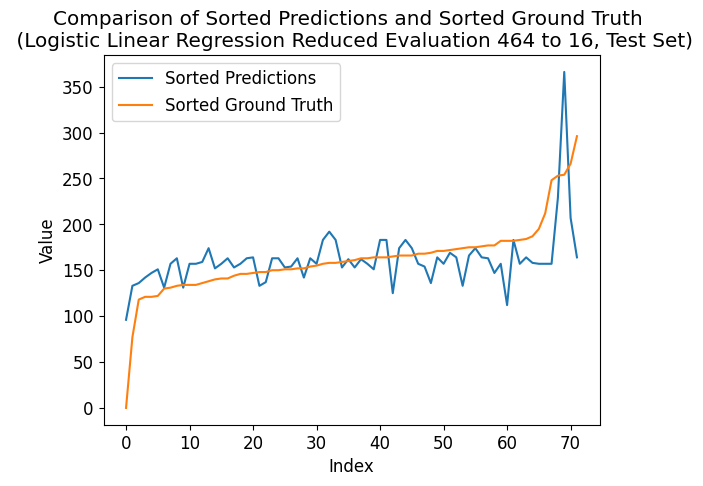

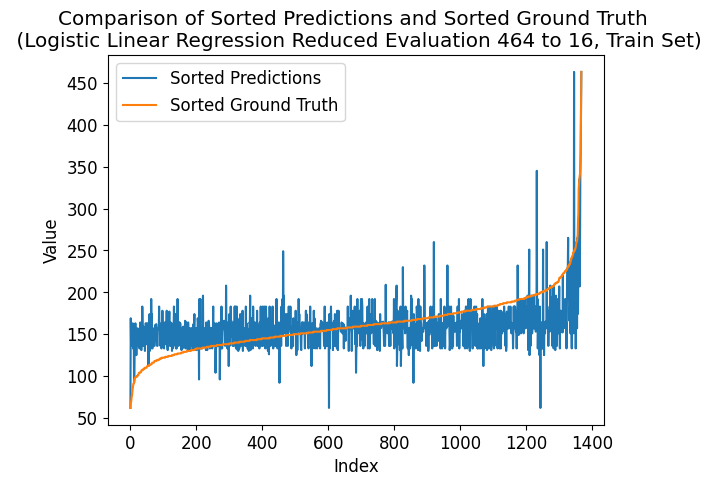

---- ---- ----
class_num = 480
Number of unique elements: 180
[  0.  30.  60.  90. 120. 150. 180. 210. 240. 270. 300. 330. 360. 390.
 420. 450. 480.]
test eval:
Mean squared error: 1.6805555555555556
Correlation coefficient: 0.45002269860598076
Coefficient of determination (R-squared score, R2 score): 0.09617180205415499
train eval:
Mean squared error: 1.2814327485380117
Correlation coefficient: 0.46589994996224815
Coefficient of determination (R-squared score, R2 score): 0.10132445839159054


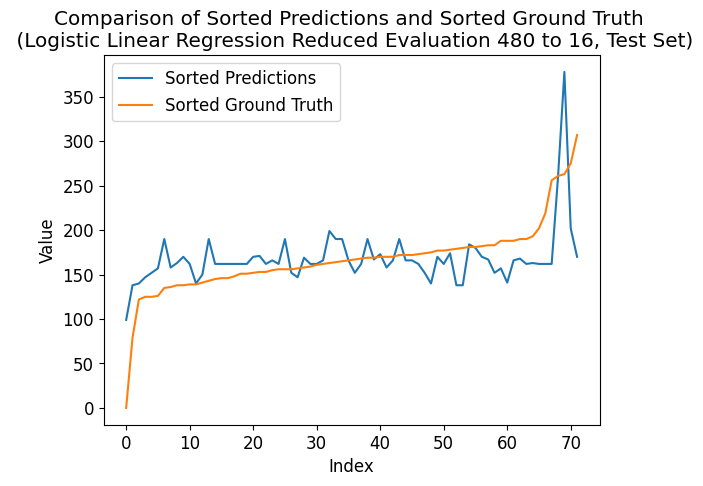

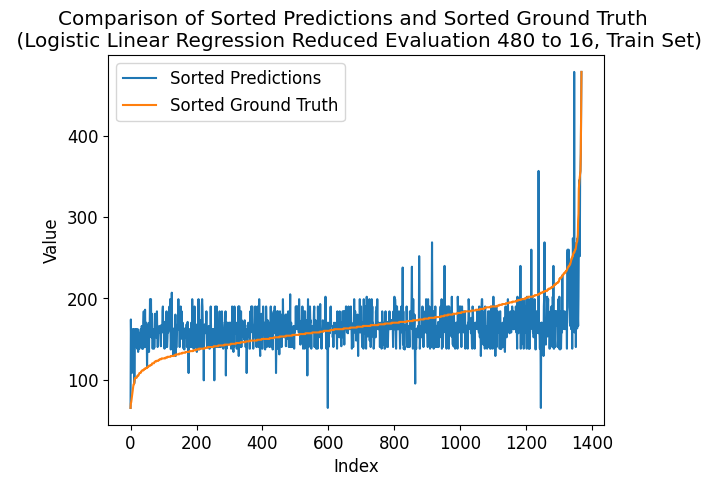

---- ---- ----
class_num = 496
Number of unique elements: 183
[  0.  31.  62.  93. 124. 155. 186. 217. 248. 279. 310. 341. 372. 403.
 434. 465. 496.]
test eval:
Mean squared error: 1.6666666666666667
Correlation coefficient: 0.4638064243926305
Coefficient of determination (R-squared score, R2 score): 0.10364145658263302
train eval:
Mean squared error: 1.2412280701754386
Correlation coefficient: 0.47872261325137877
Coefficient of determination (R-squared score, R2 score): 0.12952021126578472


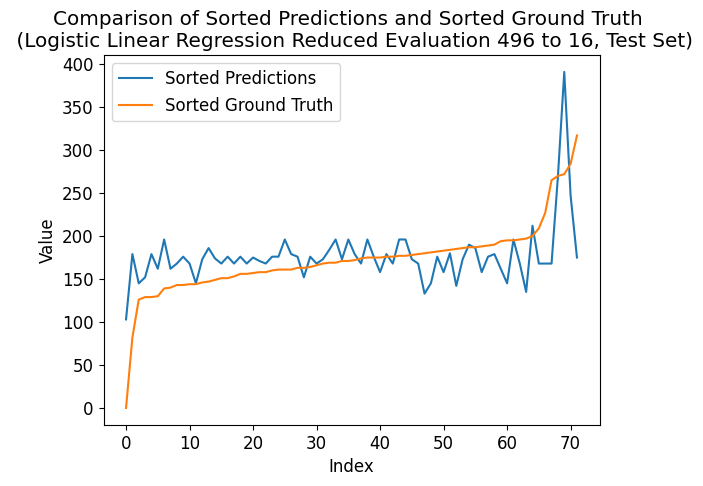

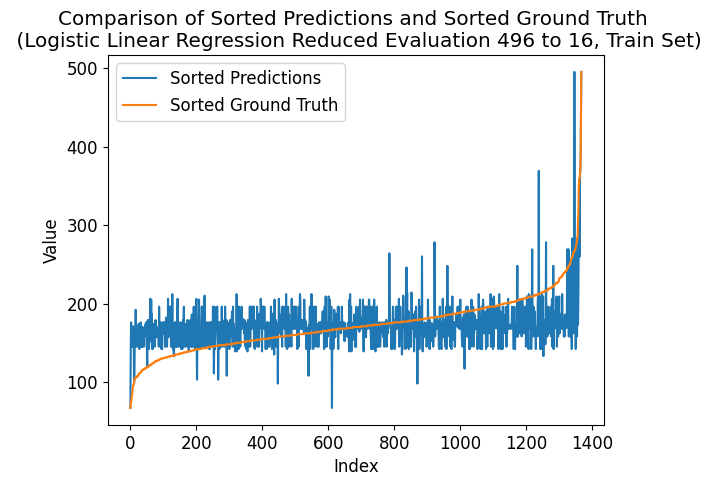

---- ---- ----
class_num = 512
Number of unique elements: 188
[  0.  32.  64.  96. 128. 160. 192. 224. 256. 288. 320. 352. 384. 416.
 448. 480. 512.]
test eval:
Mean squared error: 1.5972222222222223
Correlation coefficient: 0.543075386641704
Coefficient of determination (R-squared score, R2 score): 0.1409897292250234
train eval:
Mean squared error: 1.2390350877192982
Correlation coefficient: 0.48054044788637845
Coefficient of determination (R-squared score, R2 score): 0.131058161422559


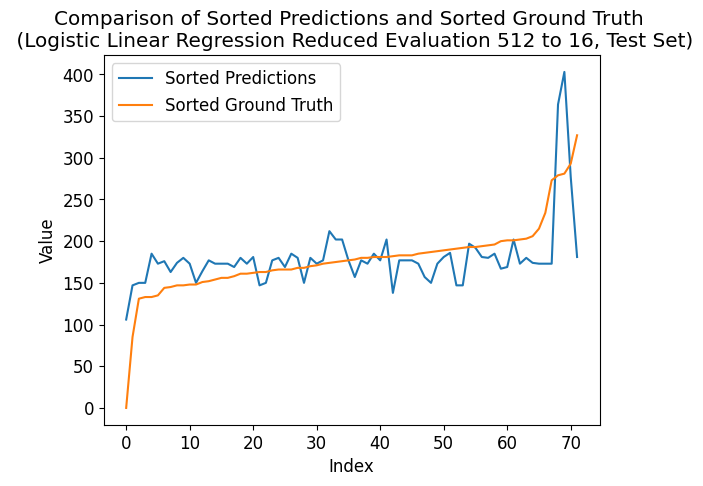

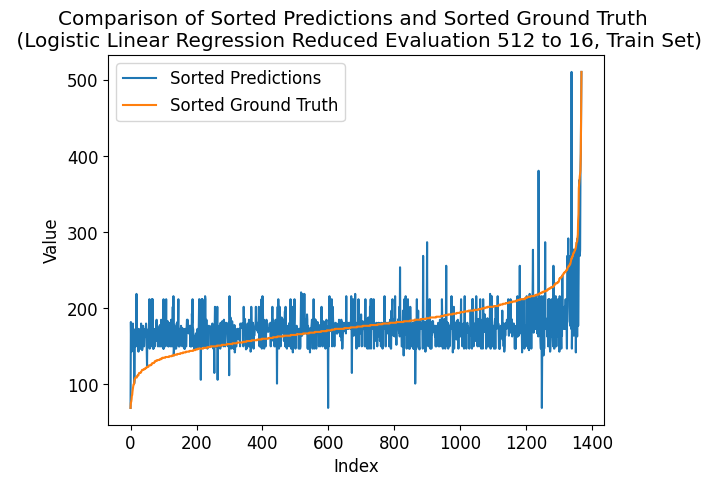

---- ---- ----
class_num = 528
Number of unique elements: 189
[  0.  33.  66.  99. 132. 165. 198. 231. 264. 297. 330. 363. 396. 429.
 462. 495. 528.]
test eval:
Mean squared error: 1.7916666666666667
Correlation coefficient: 0.42732467268306285
Coefficient of determination (R-squared score, R2 score): 0.036414565826330514
train eval:
Mean squared error: 1.2638888888888888
Correlation coefficient: 0.4633726034083941
Coefficient of determination (R-squared score, R2 score): 0.11362805964578437


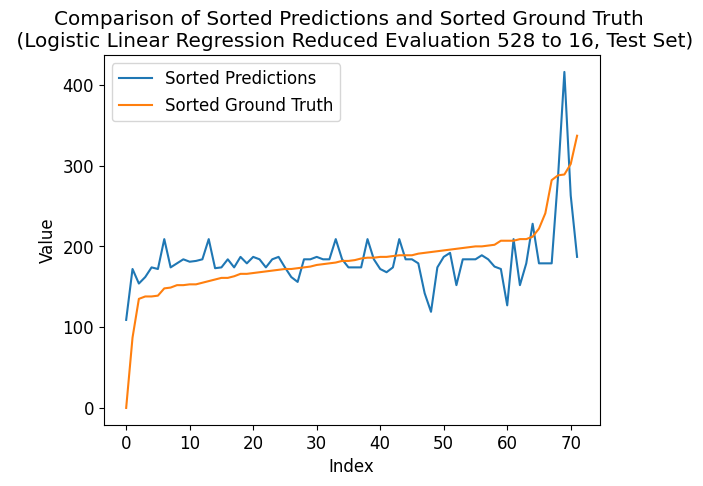

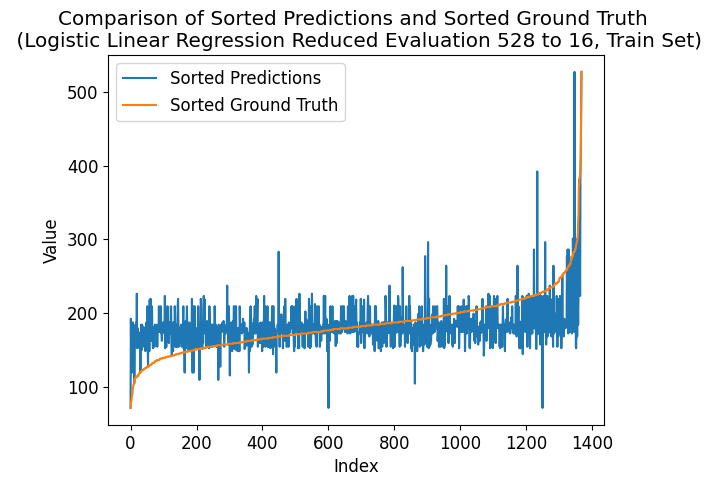

---- ---- ----
class_num = 544
Number of unique elements: 196
[  0.  34.  68. 102. 136. 170. 204. 238. 272. 306. 340. 374. 408. 442.
 476. 510. 544.]
test eval:
Mean squared error: 1.7916666666666667
Correlation coefficient: 0.43970398735208555
Coefficient of determination (R-squared score, R2 score): 0.036414565826330514
train eval:
Mean squared error: 1.2836257309941521
Correlation coefficient: 0.47881187419459664
Coefficient of determination (R-squared score, R2 score): 0.09978650823481627


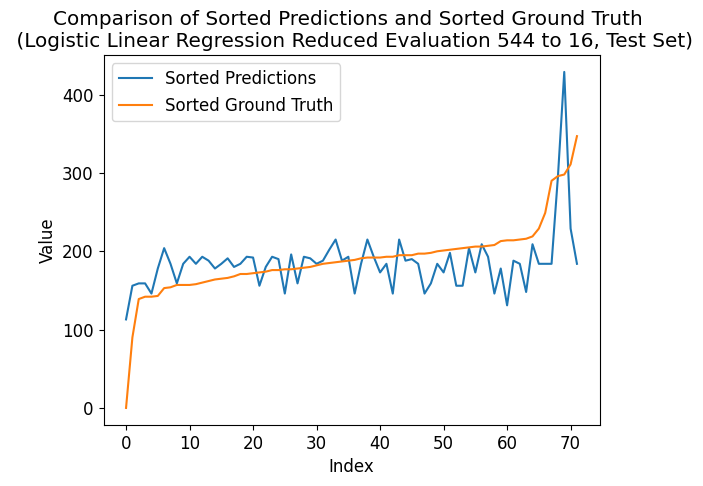

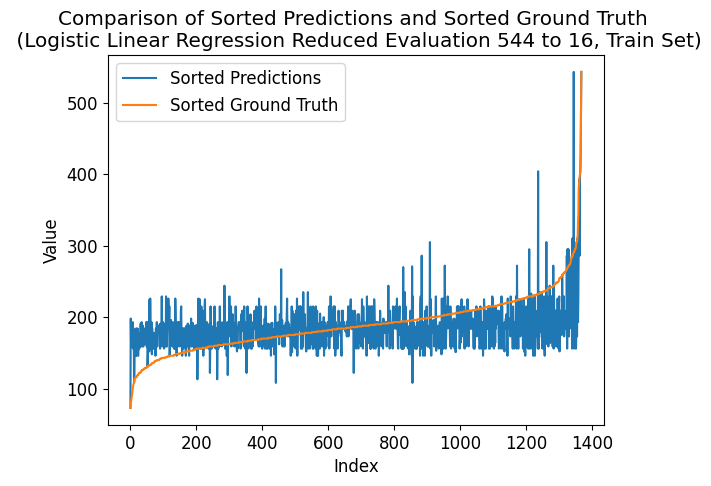

---- ---- ----
class_num = 560
Number of unique elements: 198
[  0.  35.  70. 105. 140. 175. 210. 245. 280. 315. 350. 385. 420. 455.
 490. 525. 560.]
test eval:
Mean squared error: 1.9444444444444444
Correlation coefficient: 0.4596242141160763
Coefficient of determination (R-squared score, R2 score): -0.045751633986928164
train eval:
Mean squared error: 1.2858187134502923
Correlation coefficient: 0.4723999346181573
Coefficient of determination (R-squared score, R2 score): 0.098248558078042


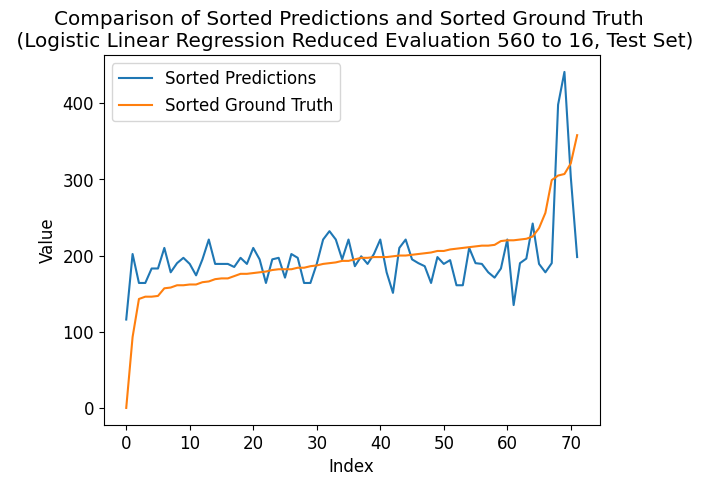

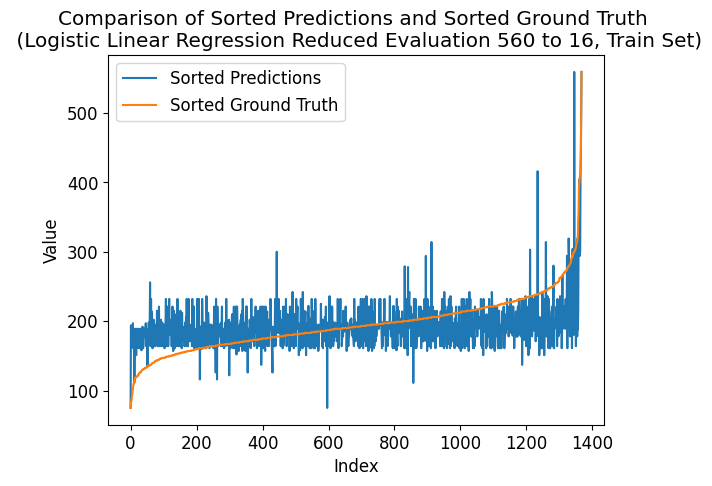

---- ---- ----
class_num = 576
Number of unique elements: 205
[  0.  36.  72. 108. 144. 180. 216. 252. 288. 324. 360. 396. 432. 468.
 504. 540. 576.]
test eval:
Mean squared error: 1.7638888888888888
Correlation coefficient: 0.43285661392592695
Coefficient of determination (R-squared score, R2 score): 0.05135387488328669
train eval:
Mean squared error: 1.2894736842105263
Correlation coefficient: 0.4639541511375892
Coefficient of determination (R-squared score, R2 score): 0.09568530781675166


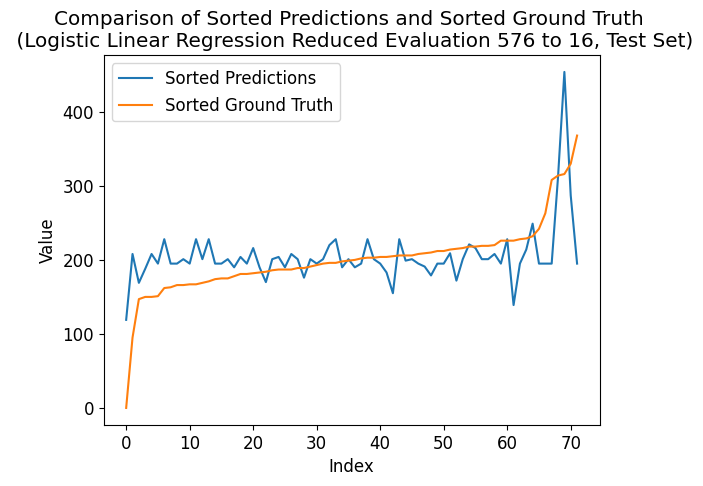

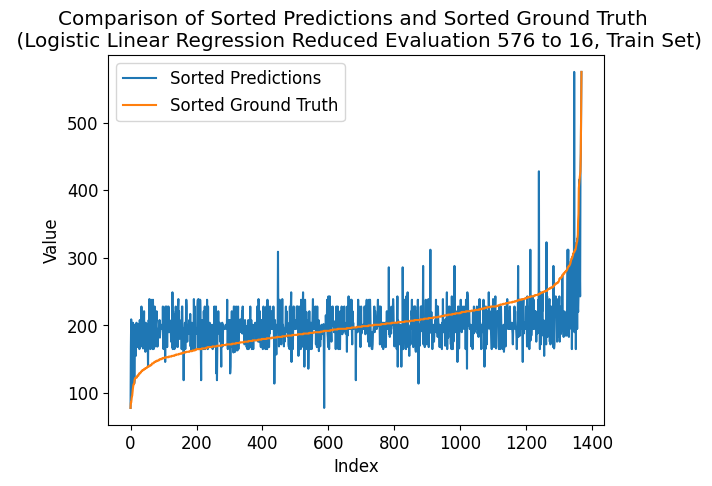

---- ---- ----
class_num = 592
Number of unique elements: 211
[  0.  37.  74. 111. 148. 185. 222. 259. 296. 333. 370. 407. 444. 481.
 518. 555. 592.]
test eval:
Mean squared error: 1.7777777777777777
Correlation coefficient: 0.4348638505605208
Coefficient of determination (R-squared score, R2 score): 0.043884220354808545
train eval:
Mean squared error: 1.2163742690058479
Correlation coefficient: 0.48670768119567076
Coefficient of determination (R-squared score, R2 score): 0.14695031304255934


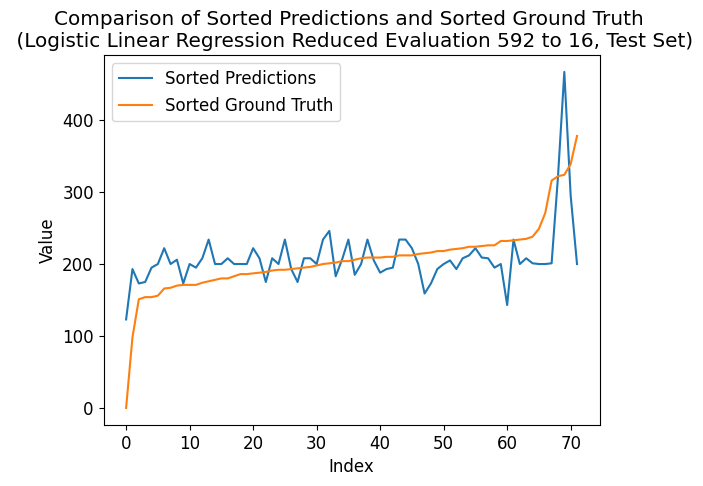

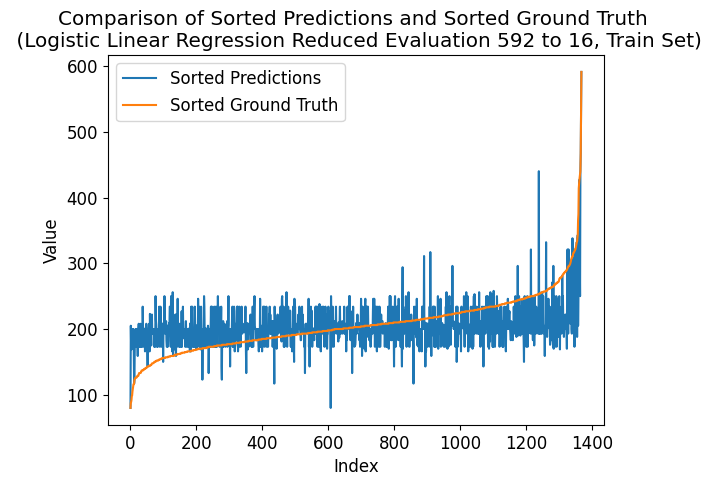

---- ---- ----
class_num = 608
Number of unique elements: 216
[  0.  38.  76. 114. 152. 190. 228. 266. 304. 342. 380. 418. 456. 494.
 532. 570. 608.]
test eval:
Mean squared error: 1.6805555555555556
Correlation coefficient: 0.4659531086549822
Coefficient of determination (R-squared score, R2 score): 0.09617180205415499
train eval:
Mean squared error: 1.263157894736842
Correlation coefficient: 0.480859721151576
Coefficient of determination (R-squared score, R2 score): 0.11414070969804246


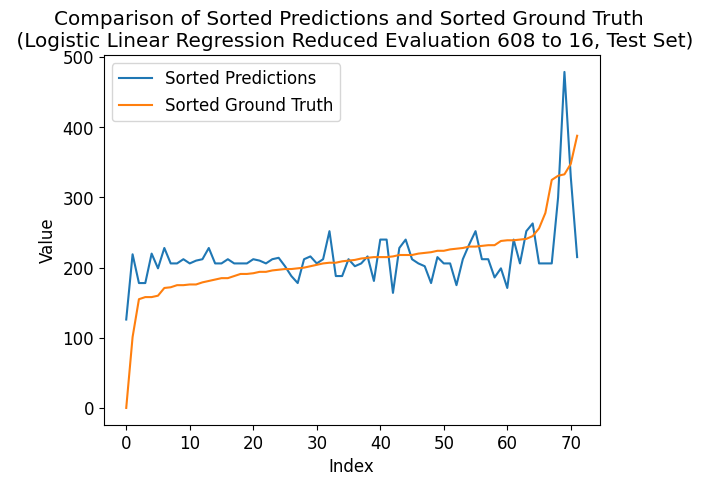

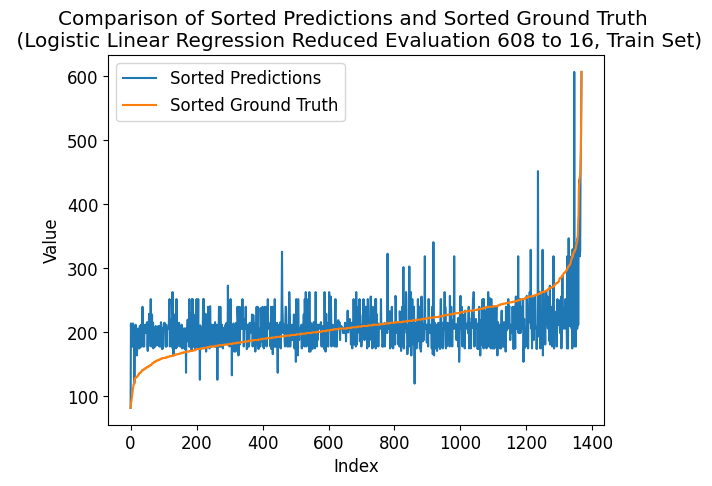

---- ---- ----
class_num = 624
Number of unique elements: 216
[  0.  39.  78. 117. 156. 195. 234. 273. 312. 351. 390. 429. 468. 507.
 546. 585. 624.]
test eval:
Mean squared error: 1.9722222222222223
Correlation coefficient: 0.42114073752888537
Coefficient of determination (R-squared score, R2 score): -0.06069094304388423
train eval:
Mean squared error: 1.2923976608187135
Correlation coefficient: 0.45741126241769076
Coefficient of determination (R-squared score, R2 score): 0.0936347076077193


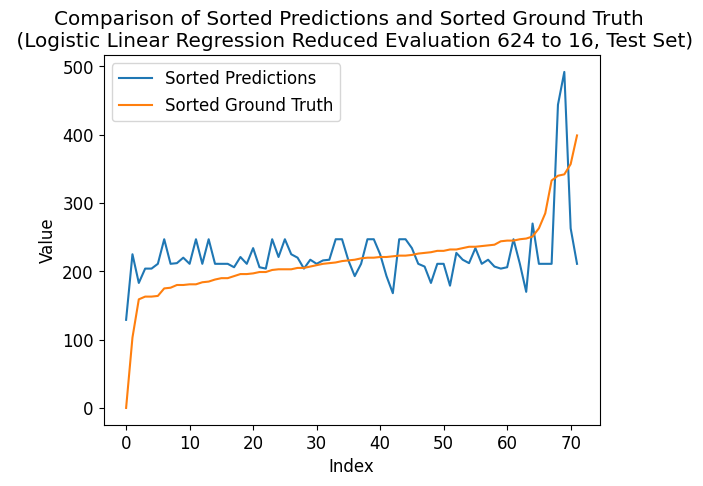

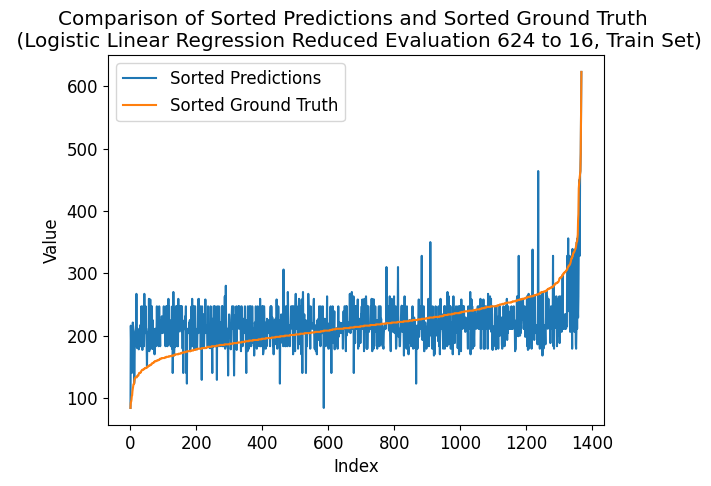

---- ---- ----
class_num = 640
Number of unique elements: 220
[  0.  40.  80. 120. 160. 200. 240. 280. 320. 360. 400. 440. 480. 520.
 560. 600. 640.]
test eval:
Mean squared error: 2.0277777777777777
Correlation coefficient: 0.36179838793880814
Coefficient of determination (R-squared score, R2 score): -0.09056956115779635
train eval:
Mean squared error: 1.2858187134502923
Correlation coefficient: 0.4628273394227515
Coefficient of determination (R-squared score, R2 score): 0.098248558078042


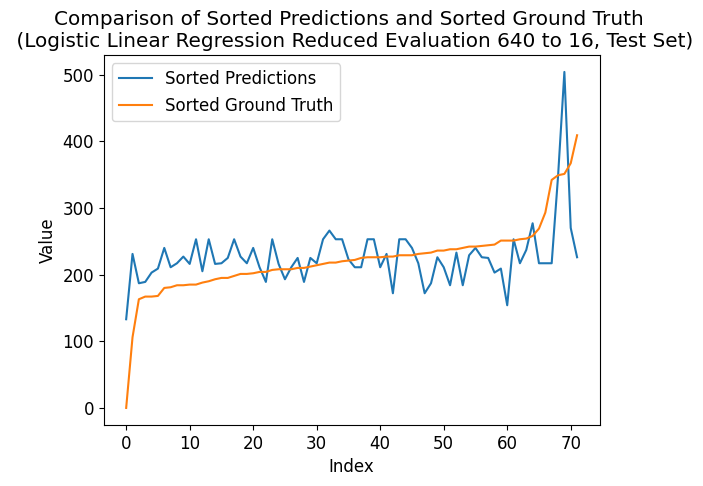

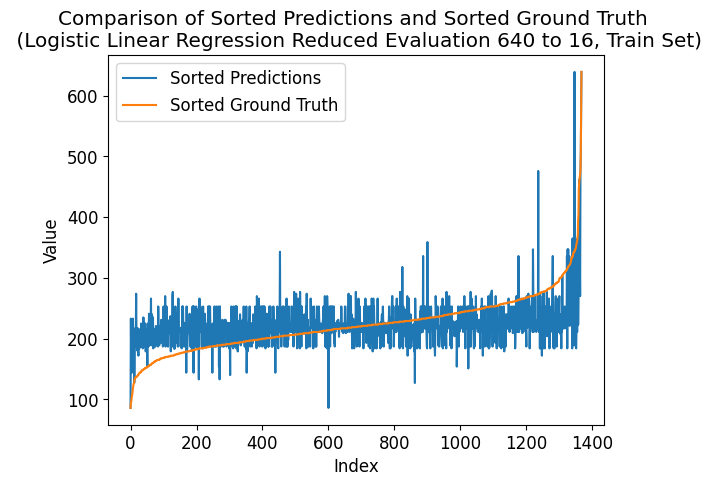

---- ---- ----
class_num = 656
Number of unique elements: 223
[  0.  41.  82. 123. 164. 205. 246. 287. 328. 369. 410. 451. 492. 533.
 574. 615. 656.]
test eval:
Mean squared error: 1.6527777777777777
Correlation coefficient: 0.4713022353857203
Coefficient of determination (R-squared score, R2 score): 0.11111111111111116
train eval:
Mean squared error: 1.29093567251462
Correlation coefficient: 0.46232912919400926
Coefficient of determination (R-squared score, R2 score): 0.09466000771223548


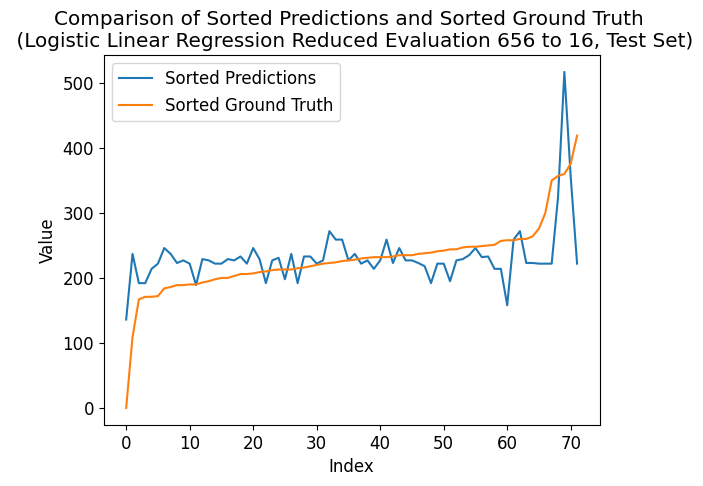

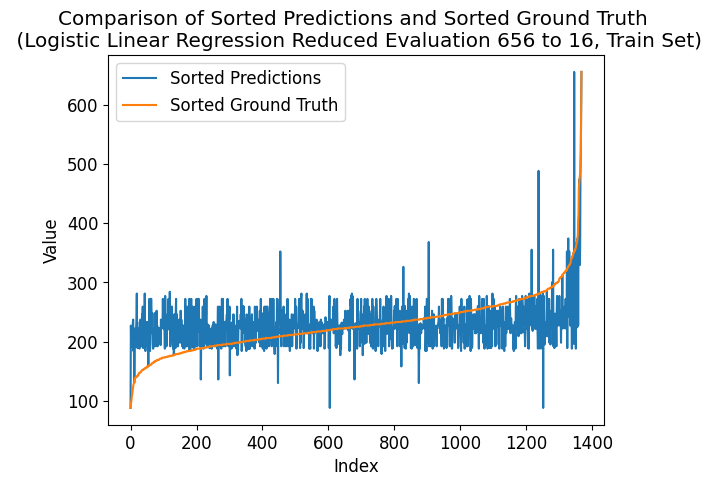

---- ---- ----
class_num = 672
Number of unique elements: 227
[  0.  42.  84. 126. 168. 210. 252. 294. 336. 378. 420. 462. 504. 546.
 588. 630. 672.]
test eval:
Mean squared error: 1.9305555555555556
Correlation coefficient: 0.45689655658028855
Coefficient of determination (R-squared score, R2 score): -0.03828197945845013
train eval:
Mean squared error: 1.2646198830409356
Correlation coefficient: 0.472065275387751
Coefficient of determination (R-squared score, R2 score): 0.11311540959352628


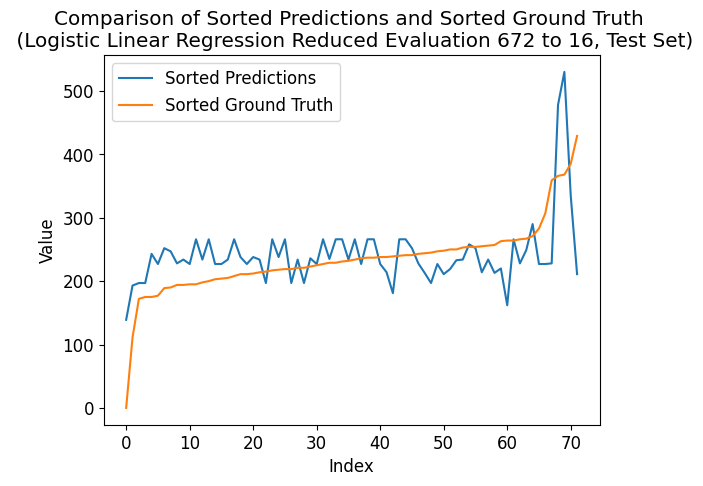

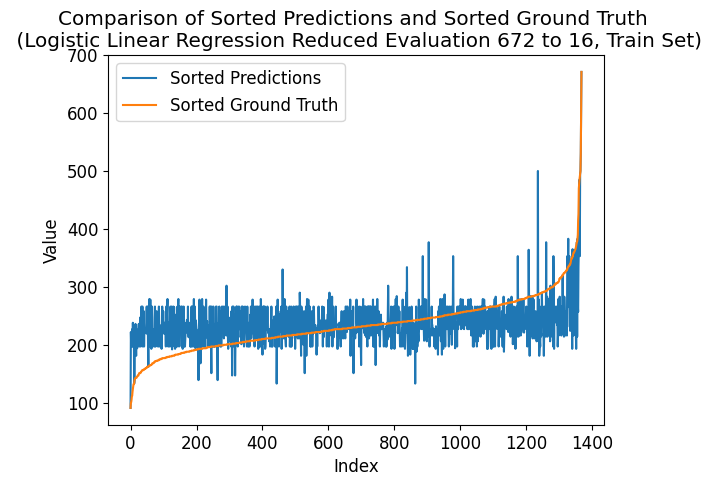

---- ---- ----
class_num = 688
Number of unique elements: 230
[  0.  43.  86. 129. 172. 215. 258. 301. 344. 387. 430. 473. 516. 559.
 602. 645. 688.]
test eval:
Mean squared error: 1.9027777777777777
Correlation coefficient: 0.39368855021967386
Coefficient of determination (R-squared score, R2 score): -0.023342670401493848
train eval:
Mean squared error: 1.2638888888888888
Correlation coefficient: 0.47872789453046133
Coefficient of determination (R-squared score, R2 score): 0.11362805964578437


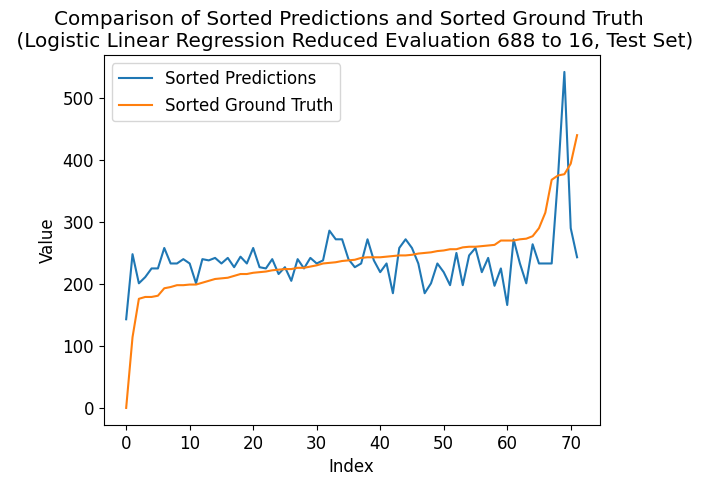

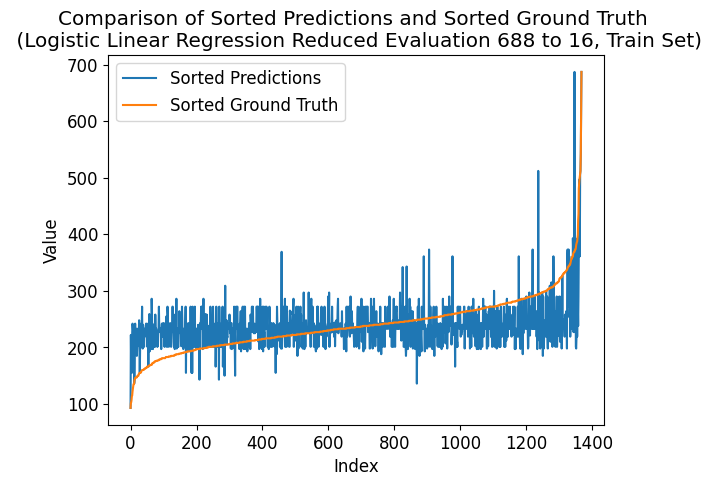

---- ---- ----
class_num = 704
Number of unique elements: 239
[  0.  44.  88. 132. 176. 220. 264. 308. 352. 396. 440. 484. 528. 572.
 616. 660. 704.]
test eval:
Mean squared error: 1.7916666666666667
Correlation coefficient: 0.4081133546510662
Coefficient of determination (R-squared score, R2 score): 0.036414565826330514
train eval:
Mean squared error: 1.2295321637426901
Correlation coefficient: 0.47995142043816325
Coefficient of determination (R-squared score, R2 score): 0.13772261210191394


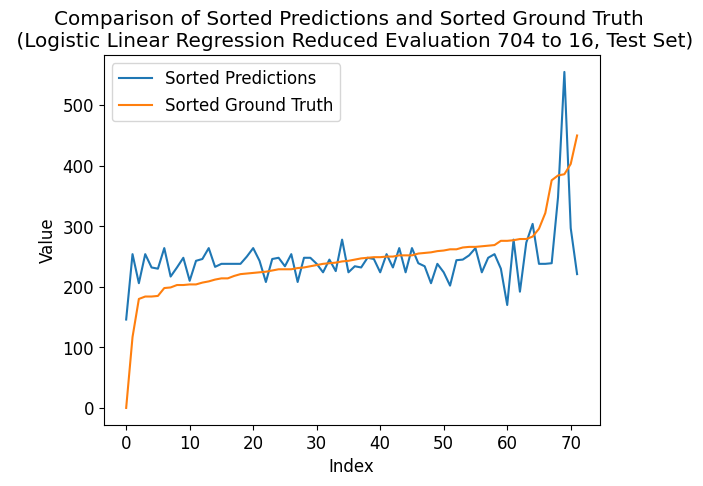

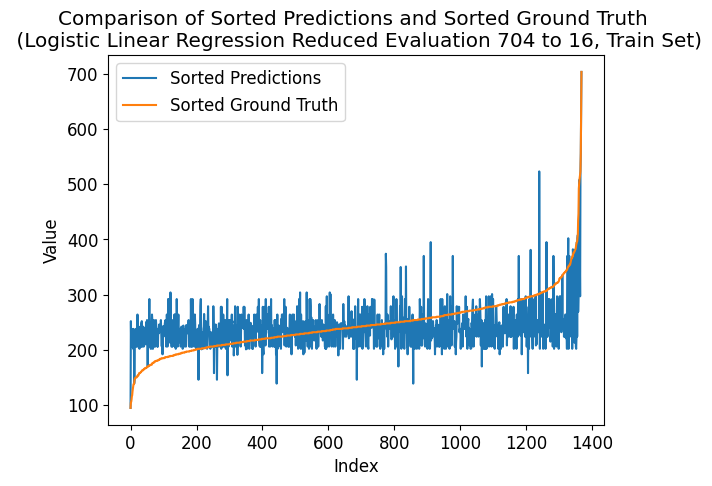

---- ---- ----
class_num = 720
Number of unique elements: 240
[  0.  45.  90. 135. 180. 225. 270. 315. 360. 405. 450. 495. 540. 585.
 630. 675. 720.]
test eval:
Mean squared error: 1.9722222222222223
Correlation coefficient: 0.4358913822419508
Coefficient of determination (R-squared score, R2 score): -0.06069094304388423
train eval:
Mean squared error: 1.4137426900584795
Correlation coefficient: 0.4110594122490662
Coefficient of determination (R-squared score, R2 score): 0.008534798932878451


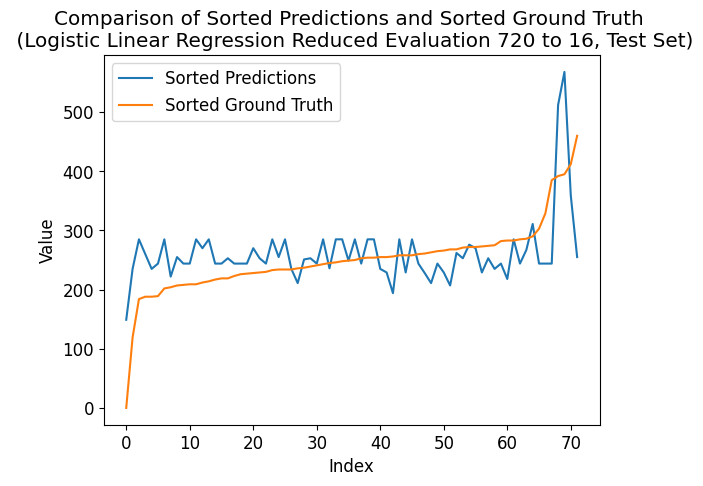

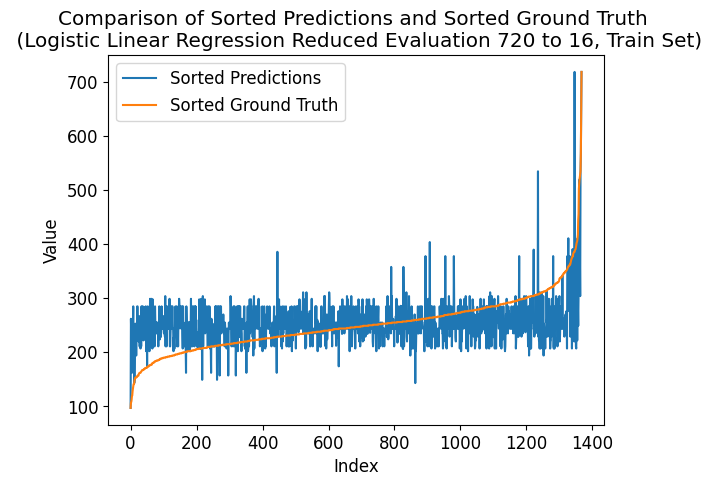

---- ---- ----
class_num = 736
Number of unique elements: 241
[  0.  46.  92. 138. 184. 230. 276. 322. 368. 414. 460. 506. 552. 598.
 644. 690. 736.]
test eval:
Mean squared error: 1.5416666666666667
Correlation coefficient: 0.5050029530242061
Coefficient of determination (R-squared score, R2 score): 0.17086834733893552
train eval:
Mean squared error: 1.2456140350877194
Correlation coefficient: 0.4687999811551011
Coefficient of determination (R-squared score, R2 score): 0.1264443109522363


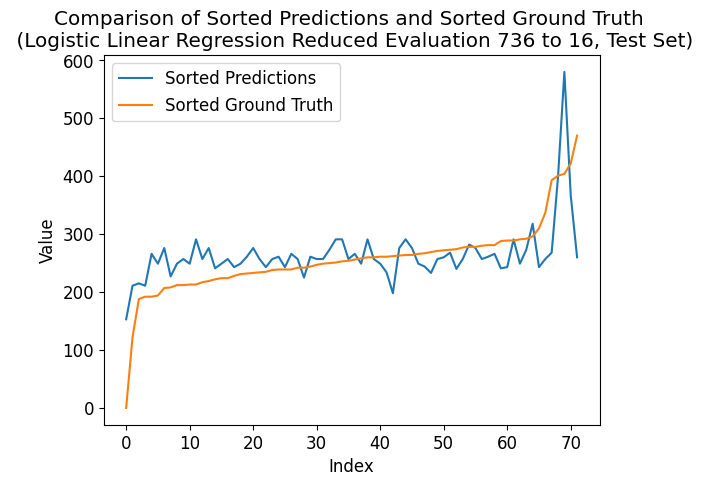

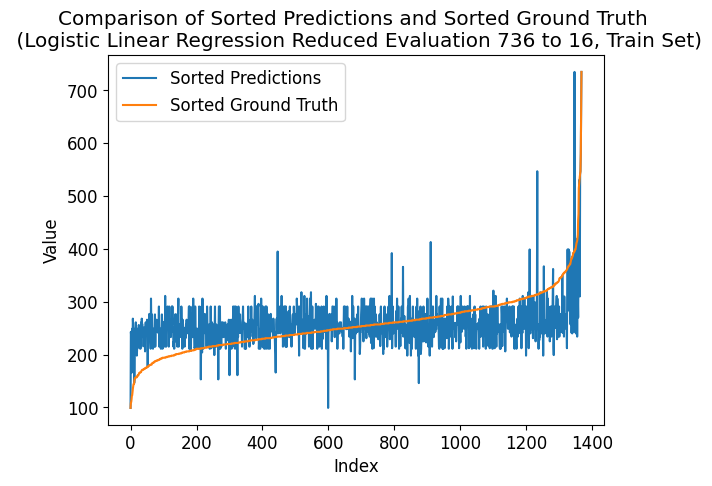

---- ---- ----
class_num = 752
Number of unique elements: 249
[  0.  47.  94. 141. 188. 235. 282. 329. 376. 423. 470. 517. 564. 611.
 658. 705. 752.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.4690525777068861
Coefficient of determination (R-squared score, R2 score): 0.02147525676937445
train eval:
Mean squared error: 1.2719298245614035
Correlation coefficient: 0.4784791515967746
Coefficient of determination (R-squared score, R2 score): 0.1079889090709455


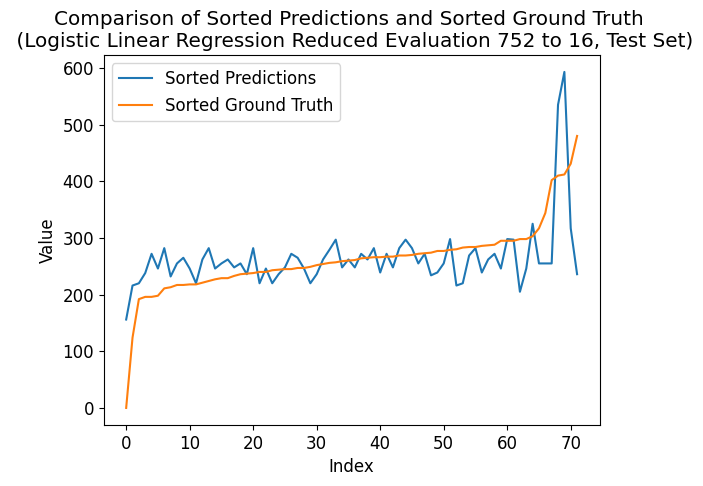

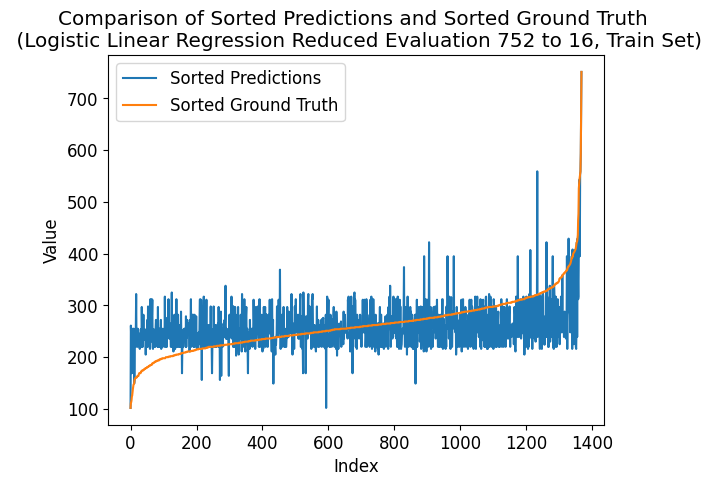

---- ---- ----
class_num = 768
Number of unique elements: 255
[  0.  48.  96. 144. 192. 240. 288. 336. 384. 432. 480. 528. 576. 624.
 672. 720. 768.]
test eval:
Mean squared error: 1.9861111111111112
Correlation coefficient: 0.36310989106098873
Coefficient of determination (R-squared score, R2 score): -0.06816059757236226
train eval:
Mean squared error: 1.3135964912280702
Correlation coefficient: 0.46843563321580156
Coefficient of determination (R-squared score, R2 score): 0.07876785609223513


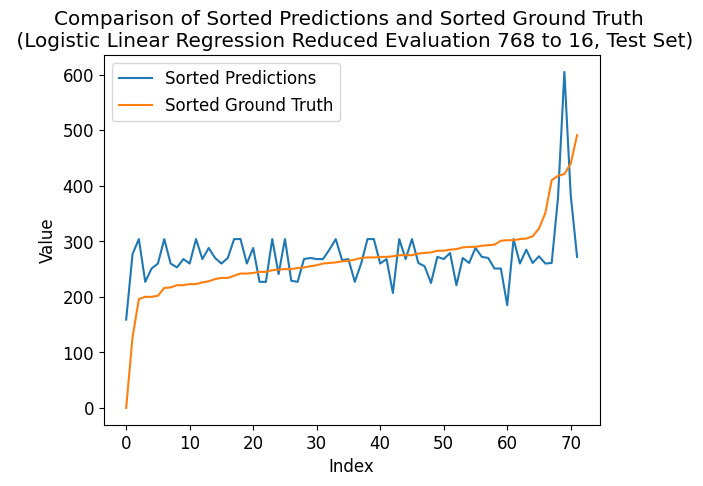

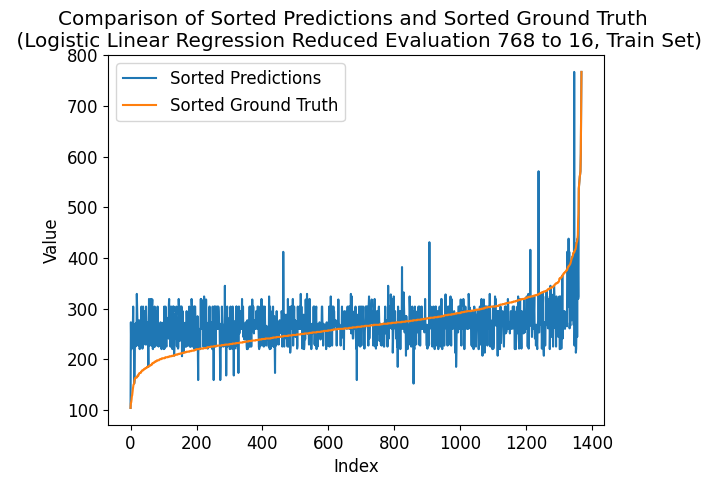

---- ---- ----
class_num = 784
Number of unique elements: 254
[  0.  49.  98. 147. 196. 245. 294. 343. 392. 441. 490. 539. 588. 637.
 686. 735. 784.]
test eval:
Mean squared error: 1.7916666666666667
Correlation coefficient: 0.43622657198333903
Coefficient of determination (R-squared score, R2 score): 0.036414565826330514
train eval:
Mean squared error: 1.2492690058479532
Correlation coefficient: 0.4683260850364564
Coefficient of determination (R-squared score, R2 score): 0.12388106069094584


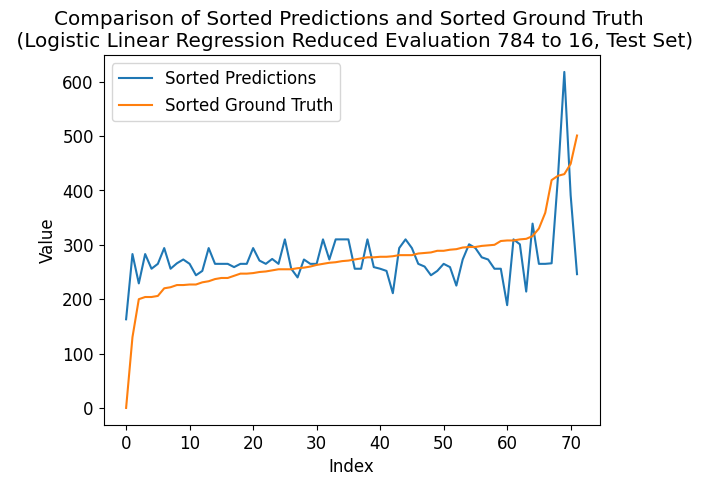

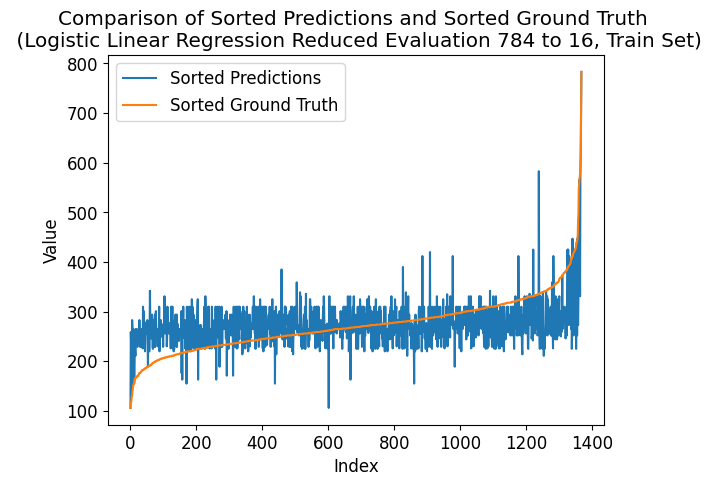

---- ---- ----
class_num = 800
Number of unique elements: 254
[  0.  50. 100. 150. 200. 250. 300. 350. 400. 450. 500. 550. 600. 650.
 700. 750. 800.]
test eval:
Mean squared error: 1.8055555555555556
Correlation coefficient: 0.40623732522034717
Coefficient of determination (R-squared score, R2 score): 0.028944911297852483
train eval:
Mean squared error: 1.2638888888888888
Correlation coefficient: 0.4716299005450033
Coefficient of determination (R-squared score, R2 score): 0.11362805964578437


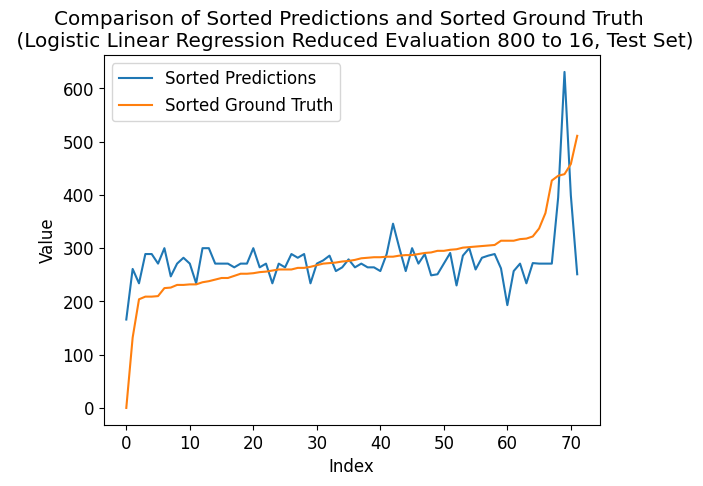

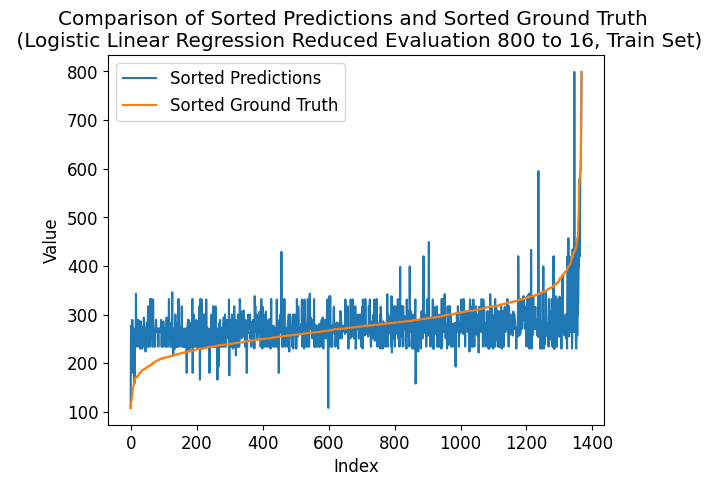

---- ---- ----
class_num = 816
Number of unique elements: 264
[  0.  51. 102. 153. 204. 255. 306. 357. 408. 459. 510. 561. 612. 663.
 714. 765. 816.]
test eval:
Mean squared error: 1.9861111111111112
Correlation coefficient: 0.4238230770001418
Coefficient of determination (R-squared score, R2 score): -0.06816059757236226
train eval:
Mean squared error: 1.3260233918128654
Correlation coefficient: 0.4535445771012145
Coefficient of determination (R-squared score, R2 score): 0.07005280520384782


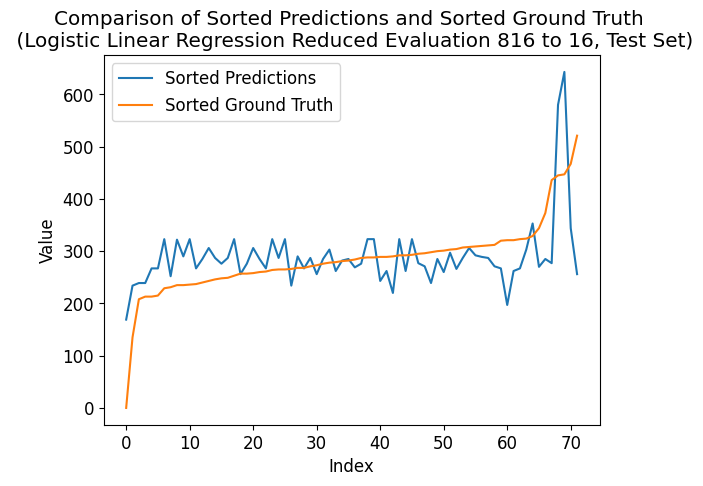

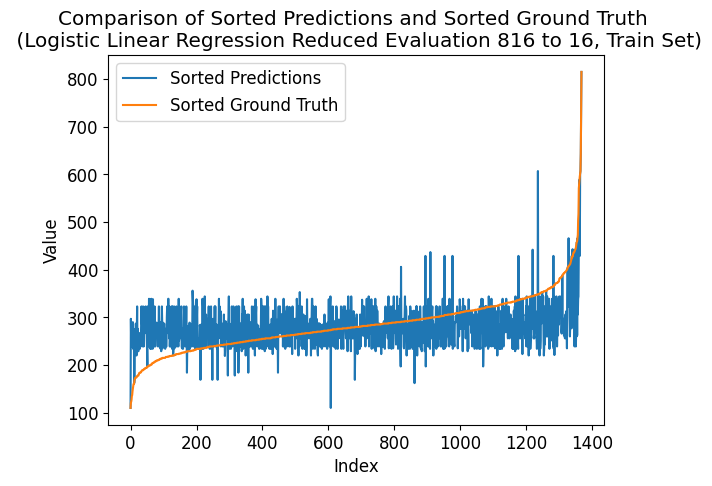

---- ---- ----
class_num = 832
Number of unique elements: 268
[  0.  52. 104. 156. 208. 260. 312. 364. 416. 468. 520. 572. 624. 676.
 728. 780. 832.]
test eval:
Mean squared error: 1.6666666666666667
Correlation coefficient: 0.4729213450495393
Coefficient of determination (R-squared score, R2 score): 0.10364145658263302
train eval:
Mean squared error: 1.3135964912280702
Correlation coefficient: 0.4649921183679015
Coefficient of determination (R-squared score, R2 score): 0.07876785609223513


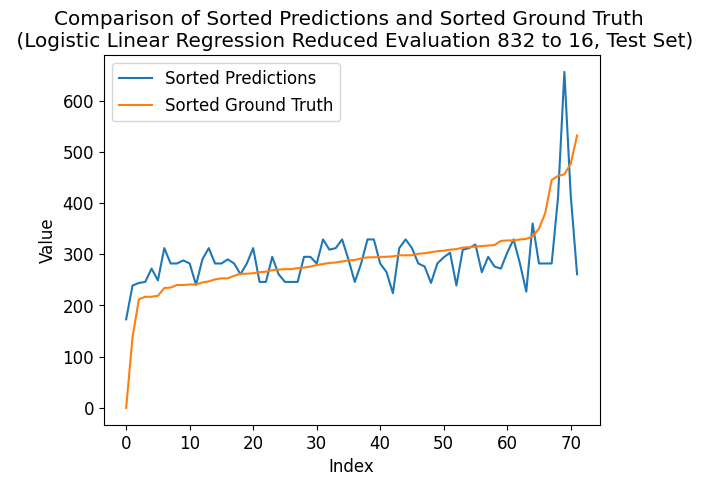

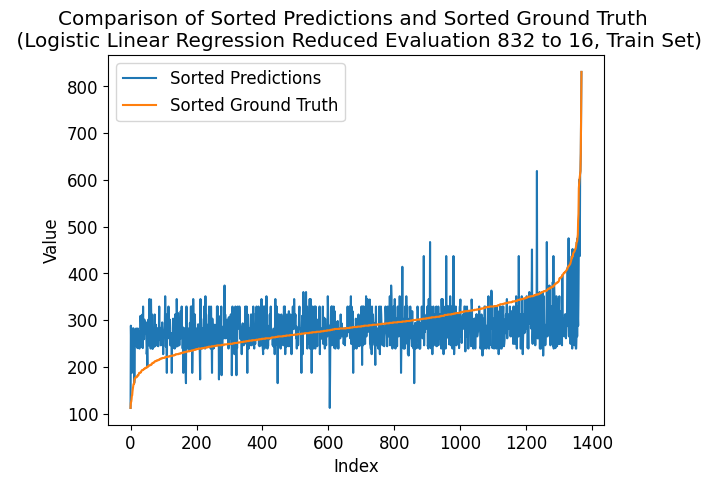

---- ---- ----
class_num = 848
Number of unique elements: 268
[  0.  53. 106. 159. 212. 265. 318. 371. 424. 477. 530. 583. 636. 689.
 742. 795. 848.]
test eval:
Mean squared error: 1.7222222222222223
Correlation coefficient: 0.4546882329512439
Coefficient of determination (R-squared score, R2 score): 0.07376283846872078
train eval:
Mean squared error: 1.2616959064327486
Correlation coefficient: 0.4804104142865967
Coefficient of determination (R-squared score, R2 score): 0.11516600980255853


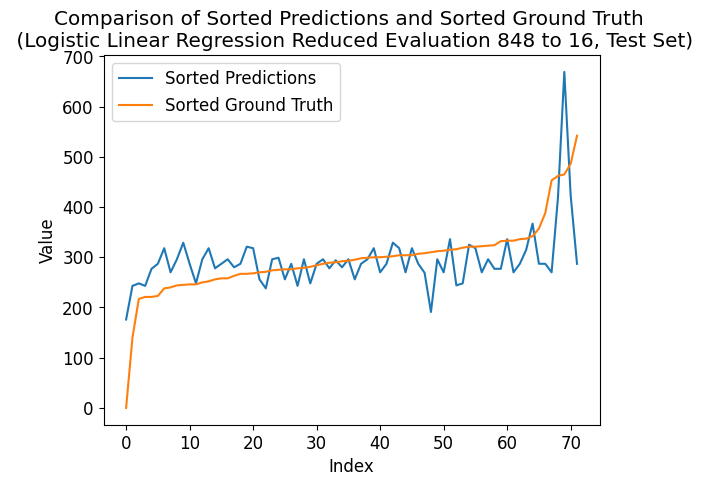

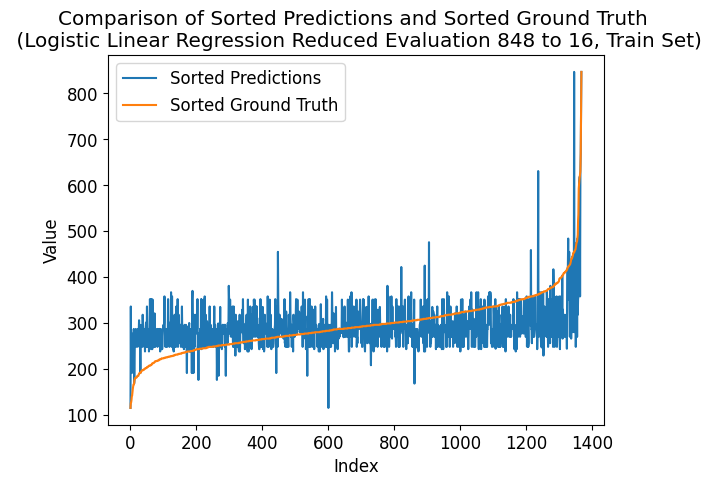

---- ---- ----
class_num = 864
Number of unique elements: 271
[  0.  54. 108. 162. 216. 270. 324. 378. 432. 486. 540. 594. 648. 702.
 756. 810. 864.]
test eval:
Mean squared error: 1.9444444444444444
Correlation coefficient: 0.3688229638711067
Coefficient of determination (R-squared score, R2 score): -0.045751633986928164
train eval:
Mean squared error: 1.2880116959064327
Correlation coefficient: 0.4607349824024031
Coefficient of determination (R-squared score, R2 score): 0.09671060792126784


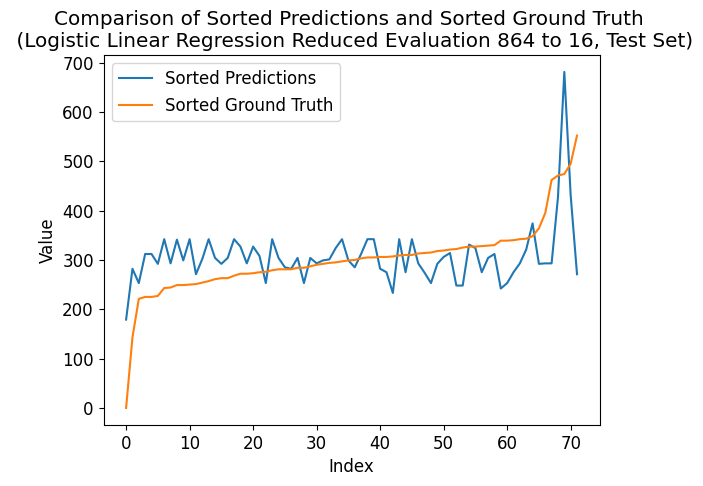

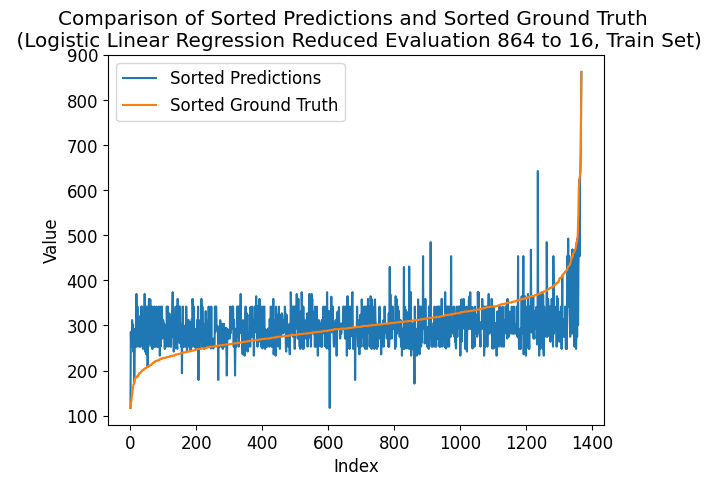

---- ---- ----
class_num = 880
Number of unique elements: 277
[  0.  55. 110. 165. 220. 275. 330. 385. 440. 495. 550. 605. 660. 715.
 770. 825. 880.]
test eval:
Mean squared error: 1.9027777777777777
Correlation coefficient: 0.38606130431231317
Coefficient of determination (R-squared score, R2 score): -0.023342670401493848
train eval:
Mean squared error: 1.273391812865497
Correlation coefficient: 0.4739358859742344
Coefficient of determination (R-squared score, R2 score): 0.10696360896642931


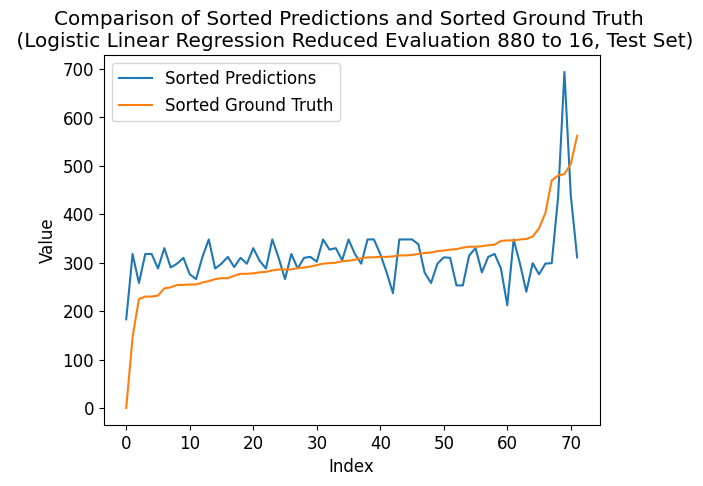

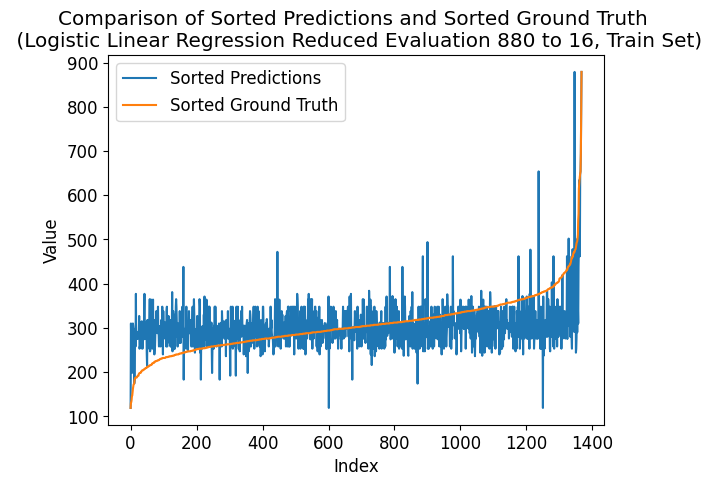

---- ---- ----
class_num = 896
Number of unique elements: 277
[  0.  56. 112. 168. 224. 280. 336. 392. 448. 504. 560. 616. 672. 728.
 784. 840. 896.]
test eval:
Mean squared error: 1.7638888888888888
Correlation coefficient: 0.4491387425173966
Coefficient of determination (R-squared score, R2 score): 0.05135387488328669
train eval:
Mean squared error: 1.2426900584795322
Correlation coefficient: 0.47145352124873213
Coefficient of determination (R-squared score, R2 score): 0.12849491116126854


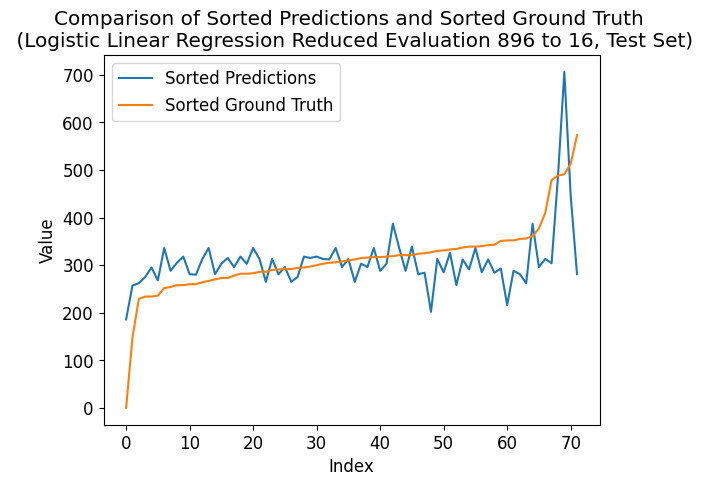

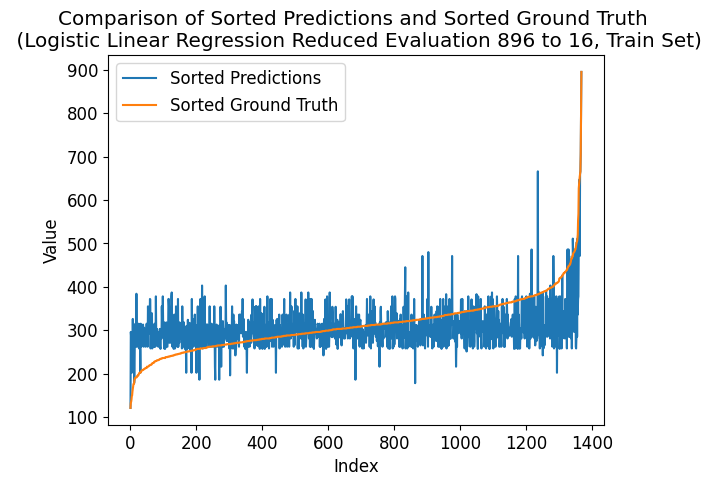

---- ---- ----
class_num = 912
Number of unique elements: 284
[  0.  57. 114. 171. 228. 285. 342. 399. 456. 513. 570. 627. 684. 741.
 798. 855. 912.]
test eval:
Mean squared error: 2.0694444444444446
Correlation coefficient: 0.3286713353263606
Coefficient of determination (R-squared score, R2 score): -0.11297852474323067
train eval:
Mean squared error: 1.2931286549707601
Correlation coefficient: 0.45452492527877614
Coefficient of determination (R-squared score, R2 score): 0.09312205755546121


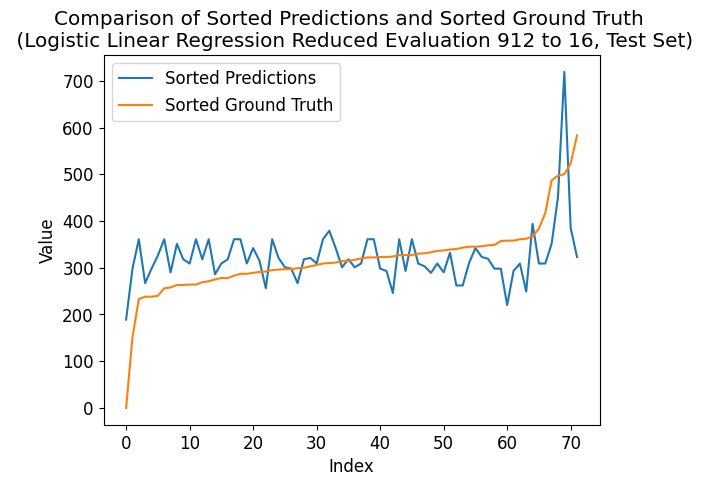

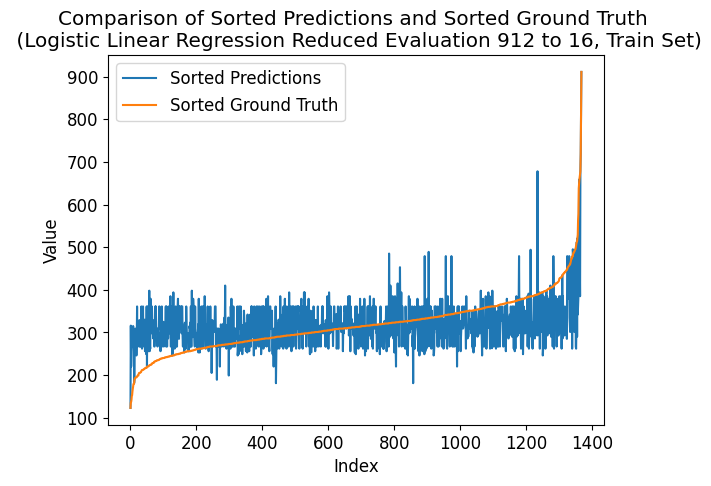

---- ---- ----
class_num = 928
Number of unique elements: 290
[  0.  58. 116. 174. 232. 290. 348. 406. 464. 522. 580. 638. 696. 754.
 812. 870. 928.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.4141384900804814
Coefficient of determination (R-squared score, R2 score): 0.02147525676937445
train eval:
Mean squared error: 1.202485380116959
Correlation coefficient: 0.5054918407320819
Coefficient of determination (R-squared score, R2 score): 0.15669066403546283


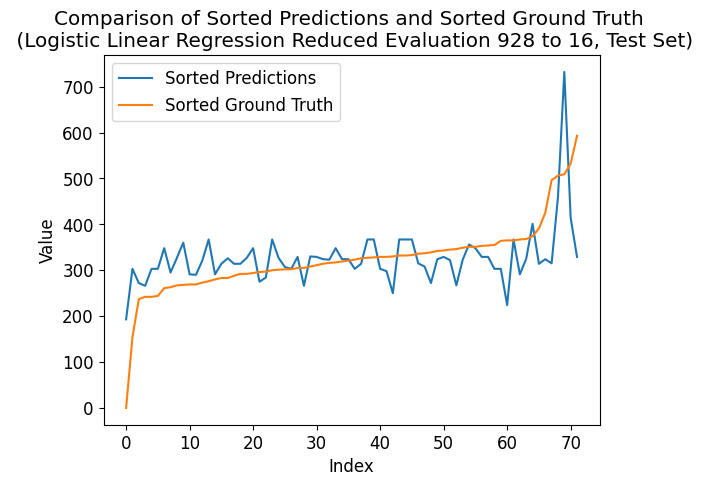

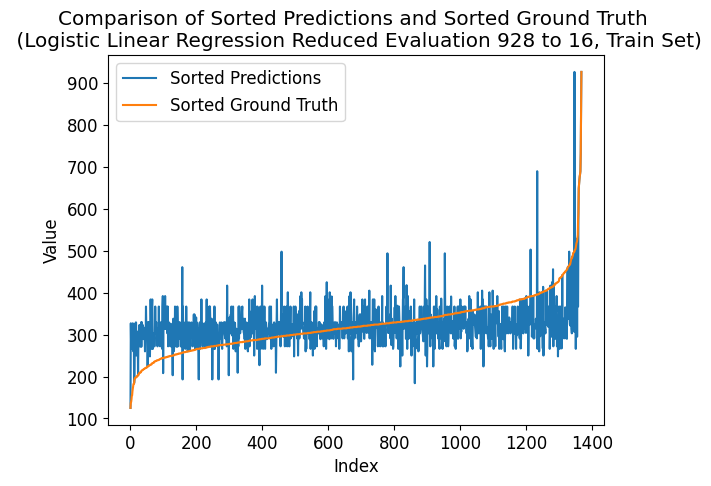

---- ---- ----
class_num = 944
Number of unique elements: 292
[  0.  59. 118. 177. 236. 295. 354. 413. 472. 531. 590. 649. 708. 767.
 826. 885. 944.]
test eval:
Mean squared error: 1.9166666666666667
Correlation coefficient: 0.37831037130187456
Coefficient of determination (R-squared score, R2 score): -0.03081232492997188
train eval:
Mean squared error: 1.2609649122807018
Correlation coefficient: 0.4669473803398881
Coefficient of determination (R-squared score, R2 score): 0.11567865985481662


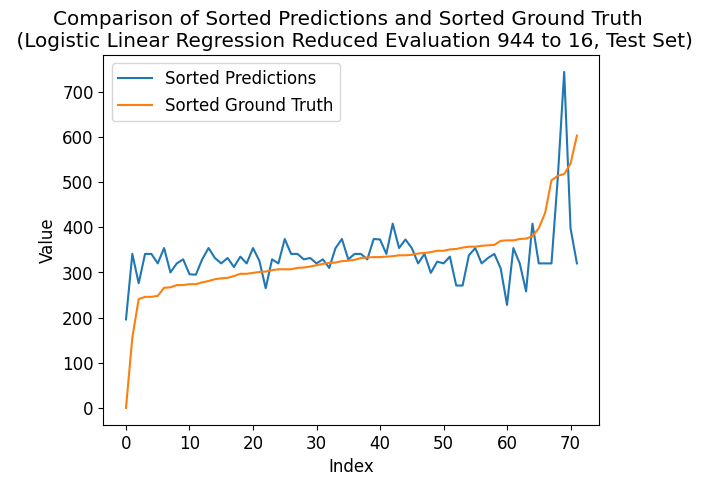

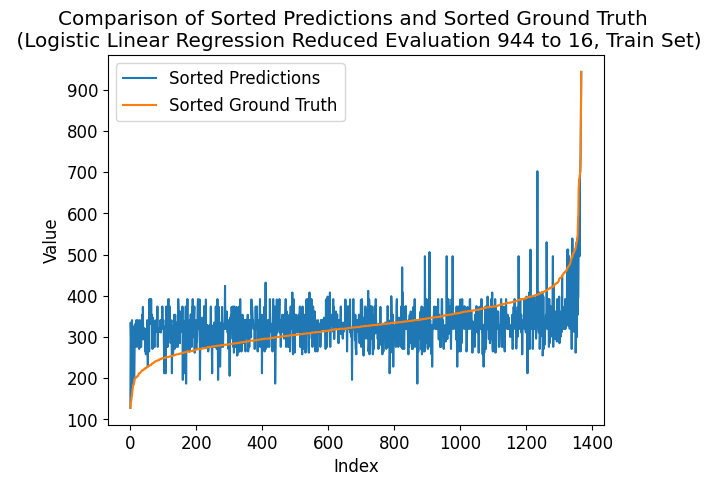

---- ---- ----
class_num = 960
Number of unique elements: 292
[  0.  60. 120. 180. 240. 300. 360. 420. 480. 540. 600. 660. 720. 780.
 840. 900. 960.]
test eval:
Mean squared error: 1.9583333333333333
Correlation coefficient: 0.37051266633703217
Coefficient of determination (R-squared score, R2 score): -0.053221288515406195
train eval:
Mean squared error: 1.2953216374269005
Correlation coefficient: 0.47384954046268224
Coefficient of determination (R-squared score, R2 score): 0.09158410739868705


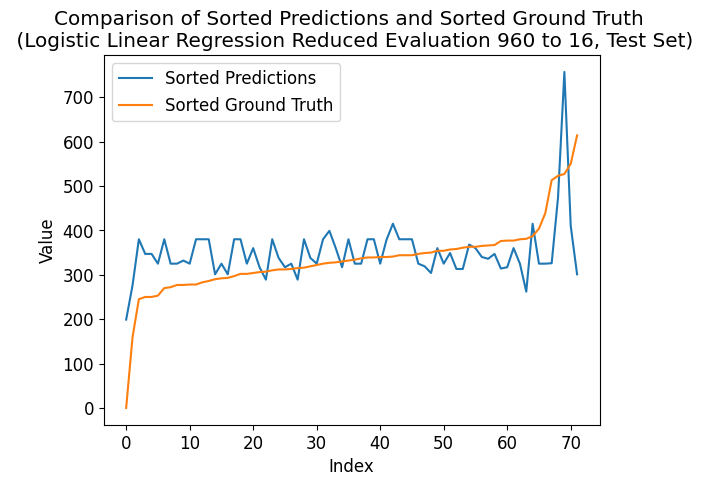

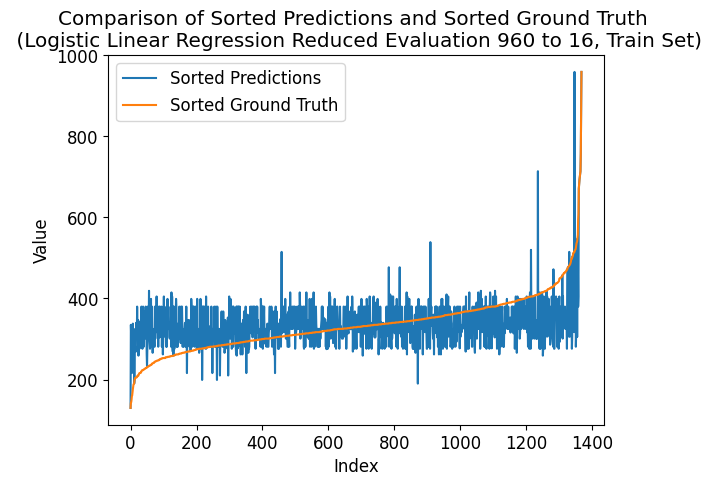

---- ---- ----
class_num = 976
Number of unique elements: 300
[  0.  61. 122. 183. 244. 305. 366. 427. 488. 549. 610. 671. 732. 793.
 854. 915. 976.]
test eval:
Mean squared error: 1.7638888888888888
Correlation coefficient: 0.4178303392856154
Coefficient of determination (R-squared score, R2 score): 0.05135387488328669
train eval:
Mean squared error: 1.1900584795321638
Correlation coefficient: 0.49086344589777897
Coefficient of determination (R-squared score, R2 score): 0.16540571492385014


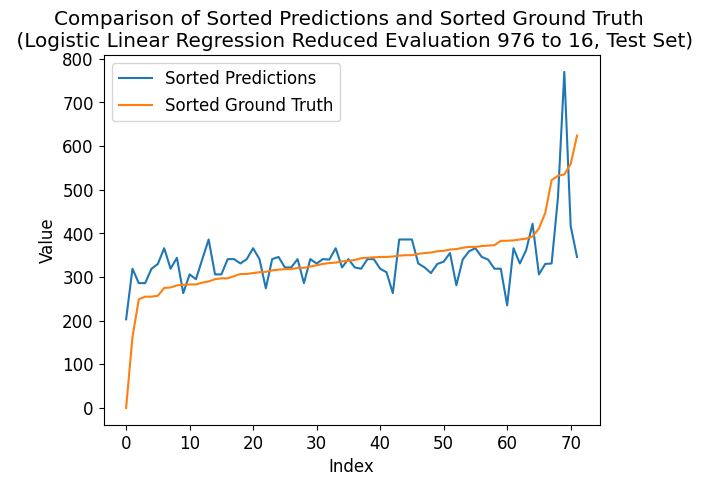

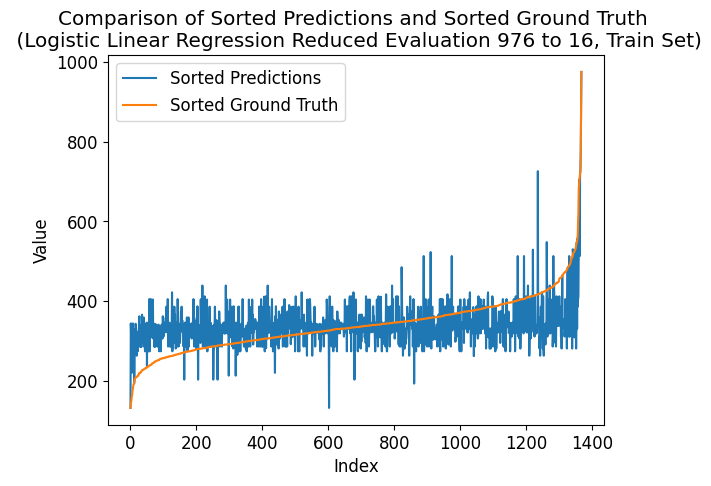

---- ---- ----
class_num = 992
Number of unique elements: 302
[  0.  62. 124. 186. 248. 310. 372. 434. 496. 558. 620. 682. 744. 806.
 868. 930. 992.]
test eval:
Mean squared error: 1.7638888888888888
Correlation coefficient: 0.43093816661664314
Coefficient of determination (R-squared score, R2 score): 0.05135387488328669
train eval:
Mean squared error: 1.2646198830409356
Correlation coefficient: 0.4701594985779692
Coefficient of determination (R-squared score, R2 score): 0.11311540959352628


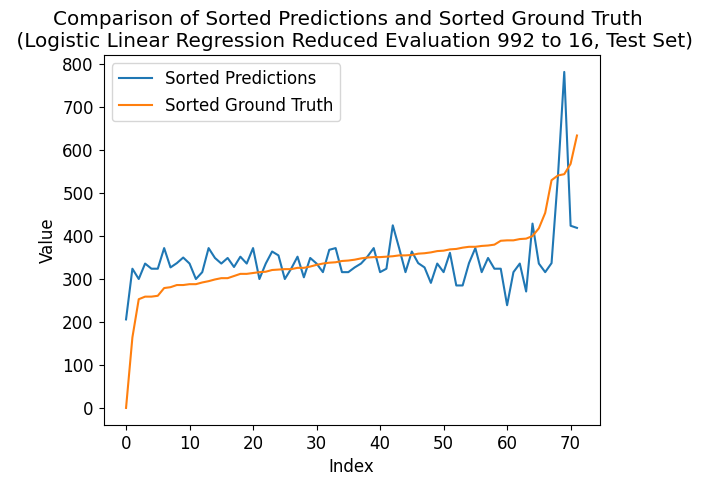

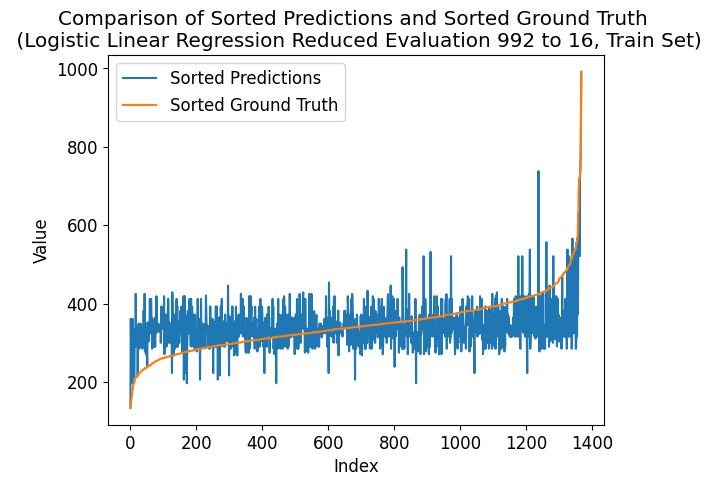

---- ---- ----
class_num = 1008
Number of unique elements: 306
[   0.   63.  126.  189.  252.  315.  378.  441.  504.  567.  630.  693.
  756.  819.  882.  945. 1008.]
test eval:
Mean squared error: 2.1666666666666665
Correlation coefficient: 0.30371772737300906
Coefficient of determination (R-squared score, R2 score): -0.1652661064425771
train eval:
Mean squared error: 1.3720760233918128
Correlation coefficient: 0.4490251632286824
Coefficient of determination (R-squared score, R2 score): 0.03775585191158892


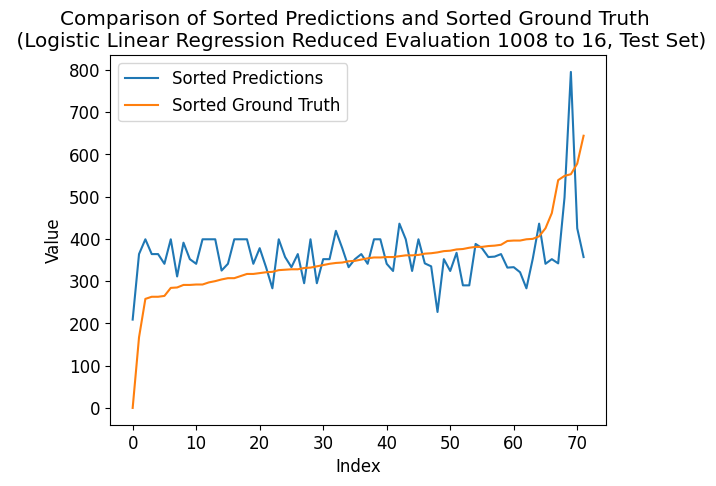

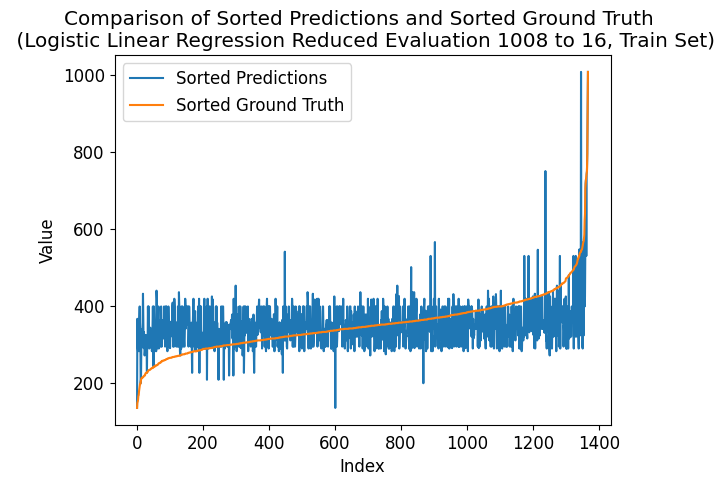

---- ---- ----
class_num = 1024
Number of unique elements: 304
[   0.   64.  128.  192.  256.  320.  384.  448.  512.  576.  640.  704.
  768.  832.  896.  960. 1024.]
test eval:
Mean squared error: 1.9027777777777777
Correlation coefficient: 0.37797942443125626
Coefficient of determination (R-squared score, R2 score): -0.023342670401493848
train eval:
Mean squared error: 1.2997076023391814
Correlation coefficient: 0.45309109016089966
Coefficient of determination (R-squared score, R2 score): 0.08850820708513851


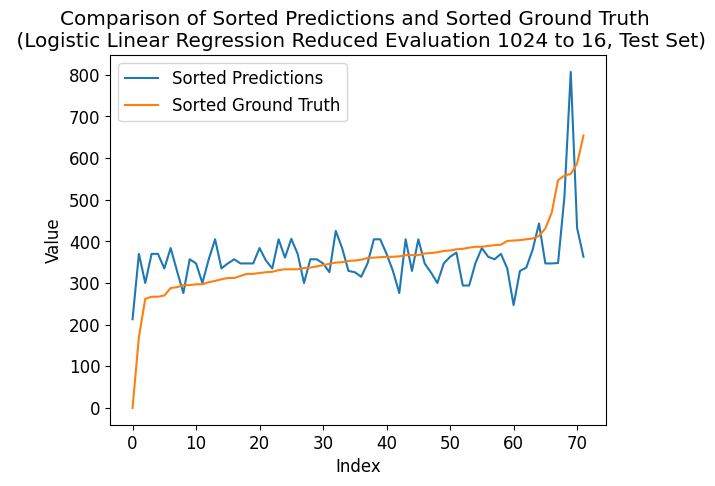

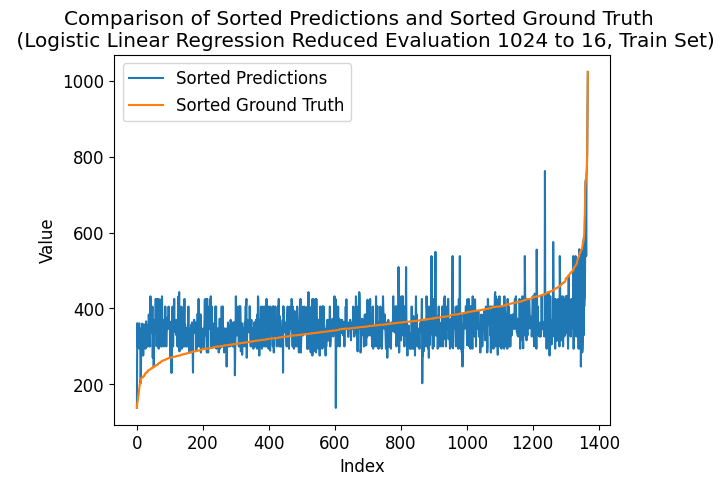

---- ---- ----
class_num = 1040
Number of unique elements: 312
[   0.   65.  130.  195.  260.  325.  390.  455.  520.  585.  650.  715.
  780.  845.  910.  975. 1040.]
test eval:
Mean squared error: 1.9305555555555556
Correlation coefficient: 0.3796621809376958
Coefficient of determination (R-squared score, R2 score): -0.03828197945845013
train eval:
Mean squared error: 1.307748538011696
Correlation coefficient: 0.4837275705321927
Coefficient of determination (R-squared score, R2 score): 0.08286905651029974


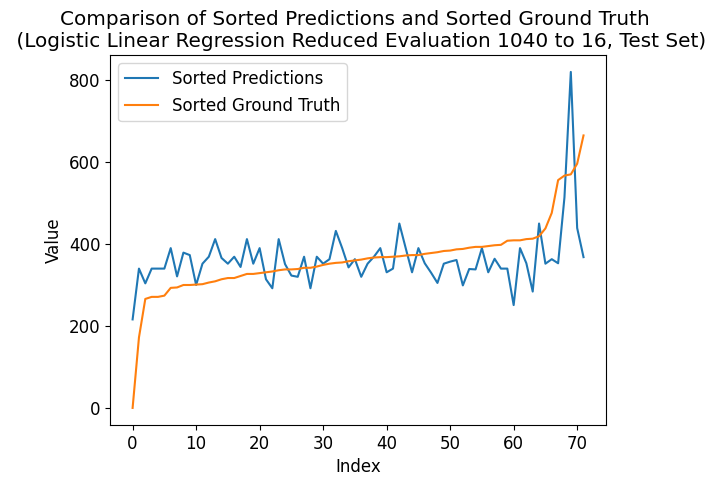

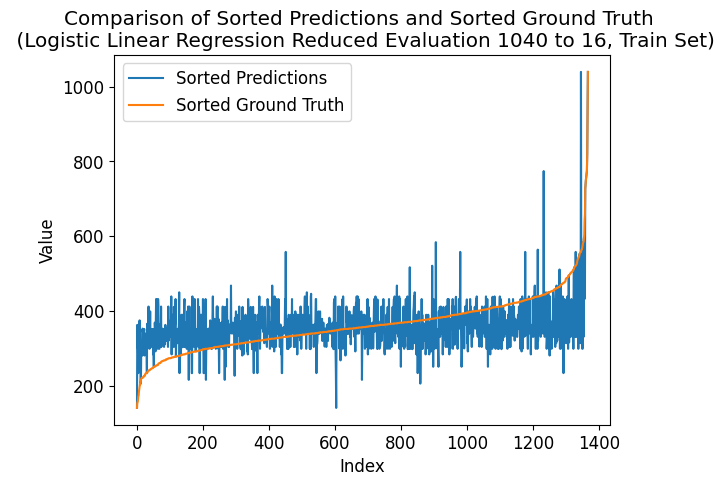

---- ---- ----
class_num = 1056
Number of unique elements: 316
[   0.   66.  132.  198.  264.  330.  396.  462.  528.  594.  660.  726.
  792.  858.  924.  990. 1056.]
test eval:
Mean squared error: 2.0555555555555554
Correlation coefficient: 0.34656448124174166
Coefficient of determination (R-squared score, R2 score): -0.10550887021475264
train eval:
Mean squared error: 1.2916666666666667
Correlation coefficient: 0.4608112848899926
Coefficient of determination (R-squared score, R2 score): 0.0941473576599774


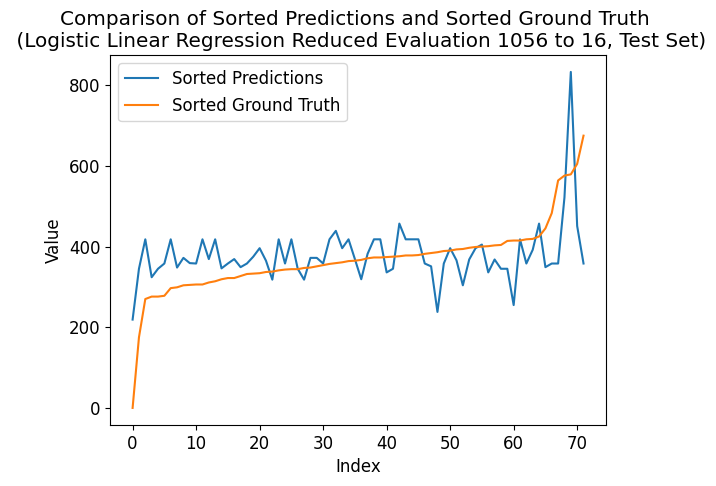

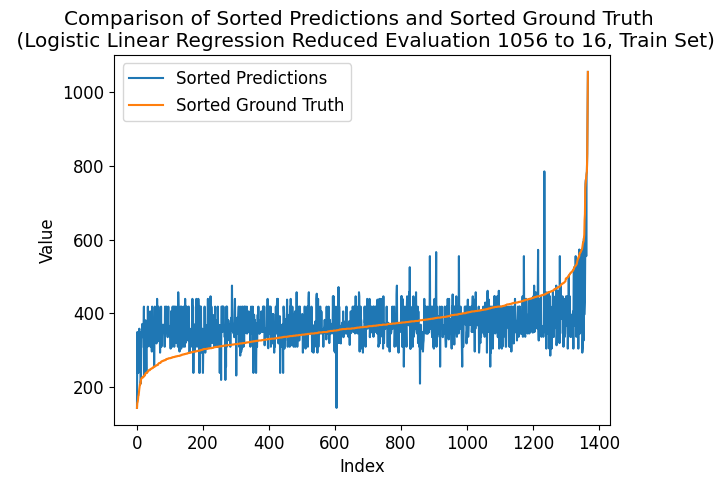

---- ---- ----
class_num = 1072
Number of unique elements: 320
[   0.   67.  134.  201.  268.  335.  402.  469.  536.  603.  670.  737.
  804.  871.  938. 1005. 1072.]
test eval:
Mean squared error: 1.7361111111111112
Correlation coefficient: 0.4252154709685706
Coefficient of determination (R-squared score, R2 score): 0.06629318394024275
train eval:
Mean squared error: 1.1966374269005848
Correlation coefficient: 0.49824566710039364
Coefficient of determination (R-squared score, R2 score): 0.16079186445352744


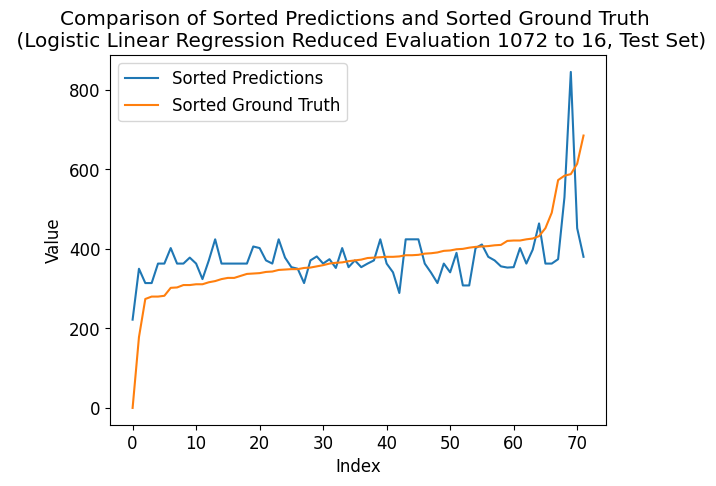

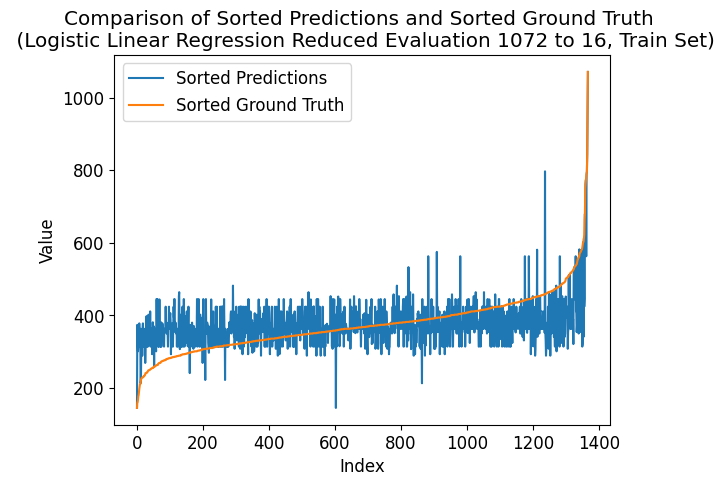

---- ---- ----
class_num = 1088
Number of unique elements: 318
[   0.   68.  136.  204.  272.  340.  408.  476.  544.  612.  680.  748.
  816.  884.  952. 1020. 1088.]
test eval:
Mean squared error: 1.7777777777777777
Correlation coefficient: 0.4045666488217864
Coefficient of determination (R-squared score, R2 score): 0.043884220354808545
train eval:
Mean squared error: 1.2580409356725146
Correlation coefficient: 0.475614789140867
Coefficient of determination (R-squared score, R2 score): 0.11772926006384898


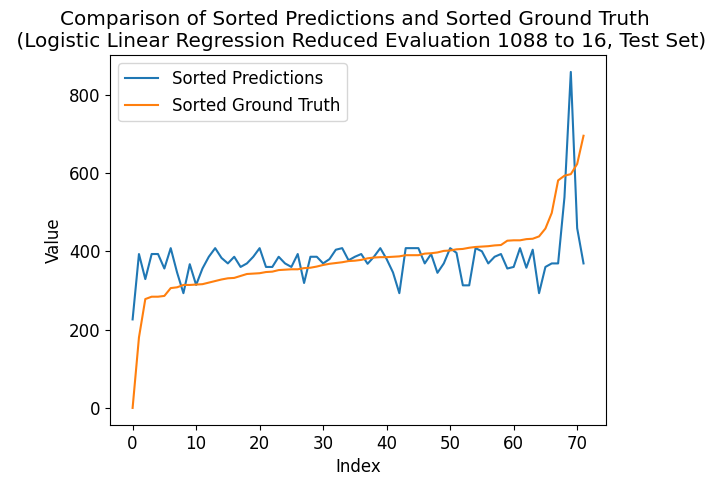

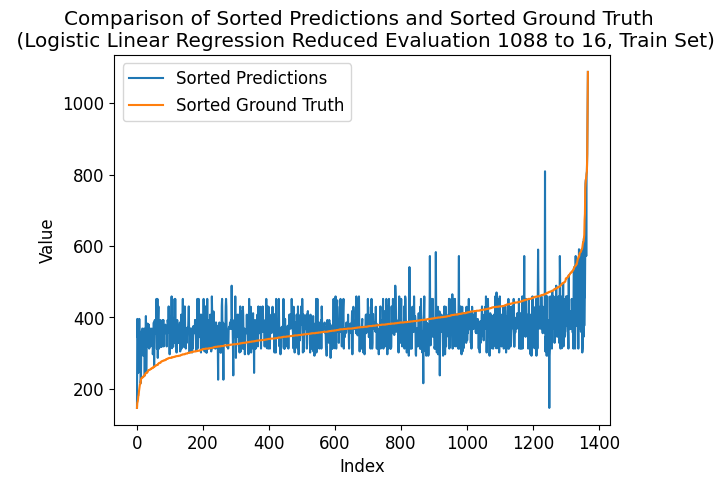

---- ---- ----
class_num = 1104
Number of unique elements: 323
[   0.   69.  138.  207.  276.  345.  414.  483.  552.  621.  690.  759.
  828.  897.  966. 1035. 1104.]
test eval:
Mean squared error: 1.8611111111111112
Correlation coefficient: 0.4029068861759726
Coefficient of determination (R-squared score, R2 score): -0.0009337068160597539
train eval:
Mean squared error: 1.293859649122807
Correlation coefficient: 0.4594385999256325
Coefficient of determination (R-squared score, R2 score): 0.09260940750320323


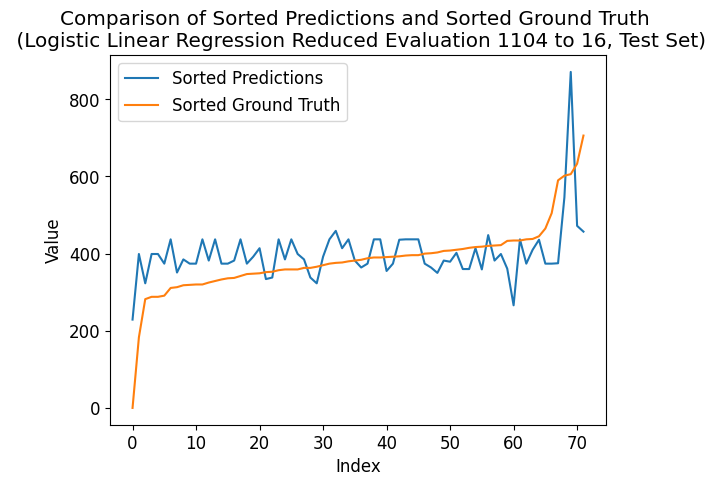

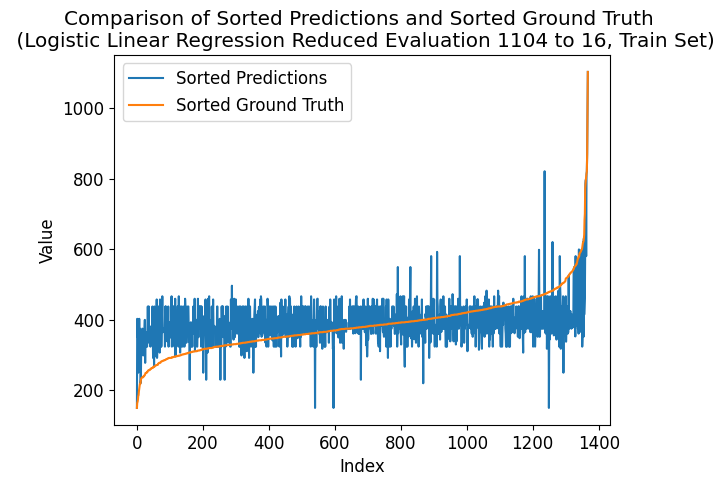

---- ---- ----
class_num = 1120
Number of unique elements: 325
[   0.   70.  140.  210.  280.  350.  420.  490.  560.  630.  700.  770.
  840.  910.  980. 1050. 1120.]
test eval:
Mean squared error: 1.8611111111111112
Correlation coefficient: 0.38371943142152887
Coefficient of determination (R-squared score, R2 score): -0.0009337068160597539
train eval:
Mean squared error: 1.2426900584795322
Correlation coefficient: 0.48807596539487264
Coefficient of determination (R-squared score, R2 score): 0.12849491116126854


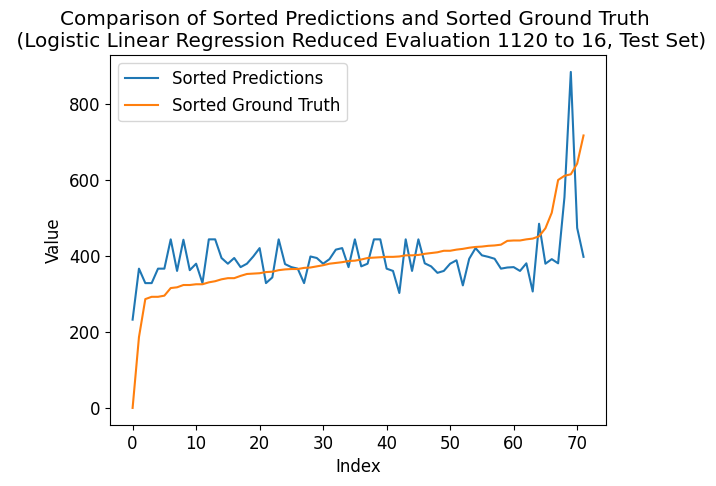

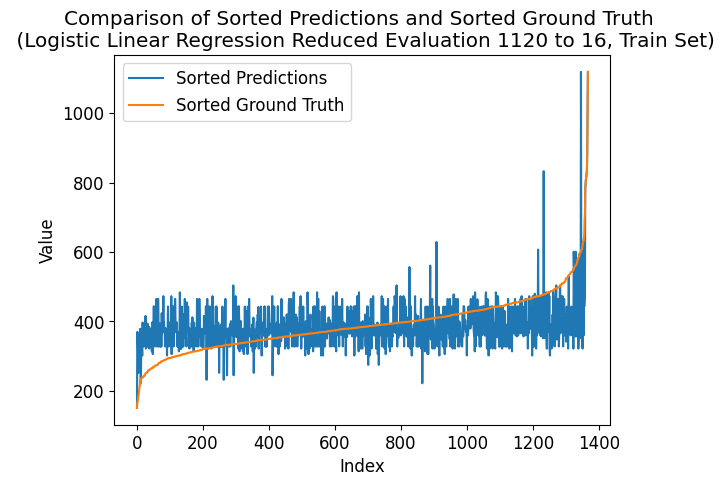

---- ---- ----
class_num = 1136
Number of unique elements: 331
[   0.   71.  142.  213.  284.  355.  426.  497.  568.  639.  710.  781.
  852.  923.  994. 1065. 1136.]
test eval:
Mean squared error: 1.6944444444444444
Correlation coefficient: 0.4517964129116188
Coefficient of determination (R-squared score, R2 score): 0.08870214752567696
train eval:
Mean squared error: 1.2141812865497077
Correlation coefficient: 0.49809781384805735
Coefficient of determination (R-squared score, R2 score): 0.14848826319933361


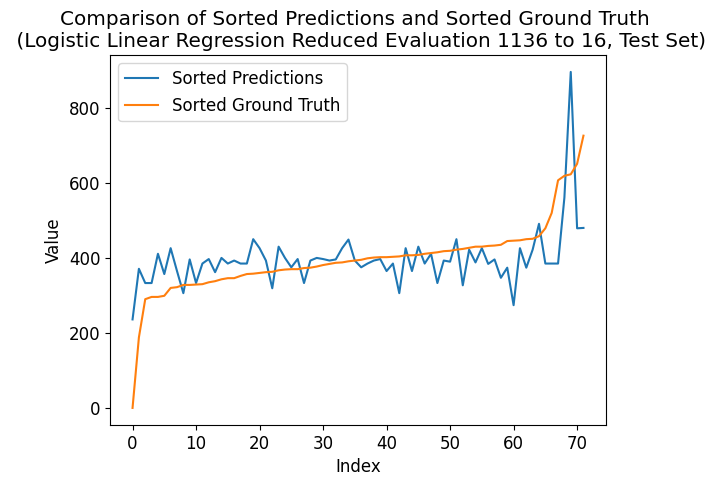

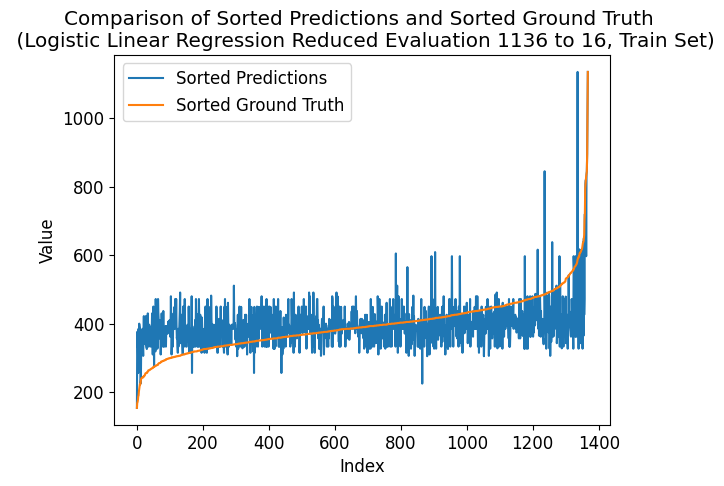

---- ---- ----
class_num = 1152
Number of unique elements: 339
[   0.   72.  144.  216.  288.  360.  432.  504.  576.  648.  720.  792.
  864.  936. 1008. 1080. 1152.]
test eval:
Mean squared error: 2.0
Correlation coefficient: 0.35483220545239
Coefficient of determination (R-squared score, R2 score): -0.07563025210084029
train eval:
Mean squared error: 1.3625730994152048
Correlation coefficient: 0.45486328401539844
Coefficient of determination (R-squared score, R2 score): 0.04442030259094387


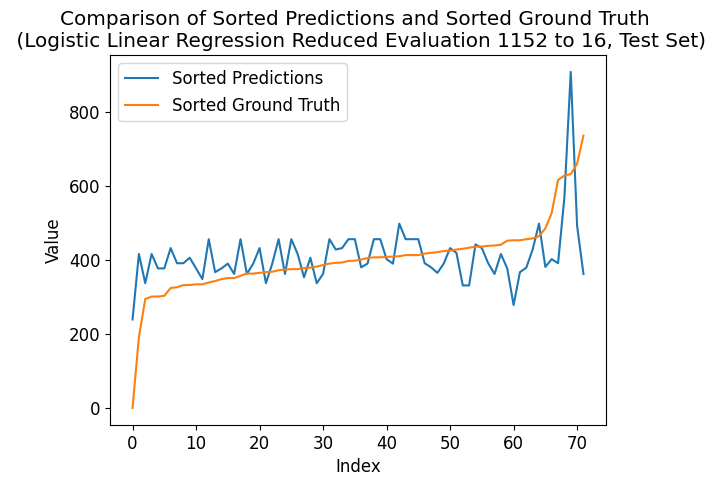

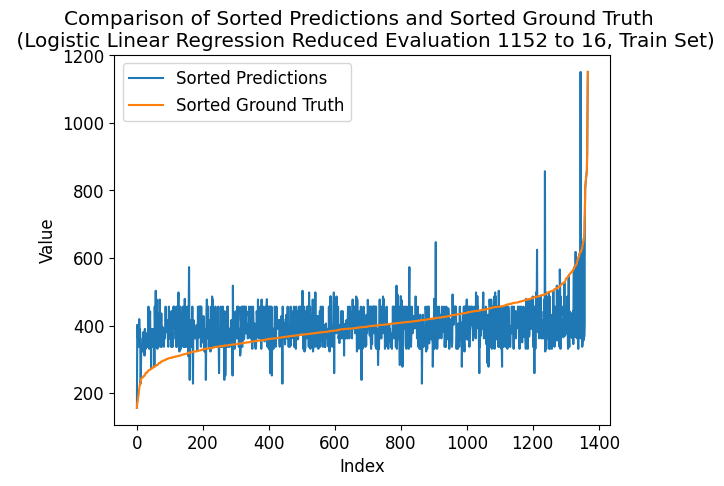

---- ---- ----
class_num = 1168
Number of unique elements: 336
[   0.   73.  146.  219.  292.  365.  438.  511.  584.  657.  730.  803.
  876.  949. 1022. 1095. 1168.]
test eval:
Mean squared error: 2.0972222222222223
Correlation coefficient: 0.34319982741955934
Coefficient of determination (R-squared score, R2 score): -0.12791783380018673
train eval:
Mean squared error: 1.2792397660818713
Correlation coefficient: 0.4745832664711267
Coefficient of determination (R-squared score, R2 score): 0.1028624085483647


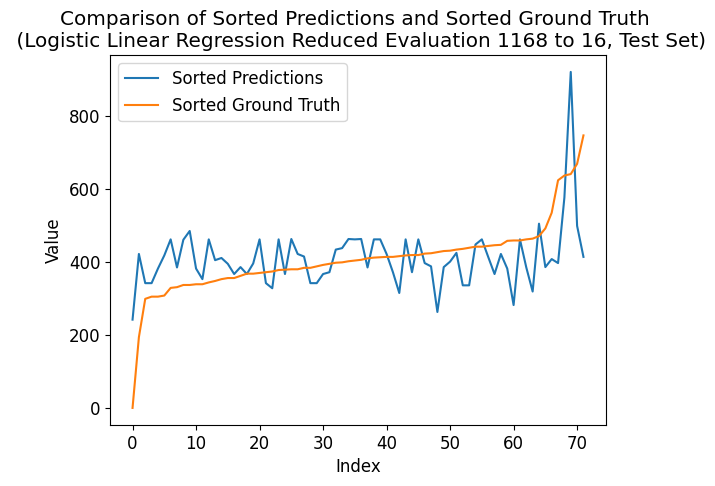

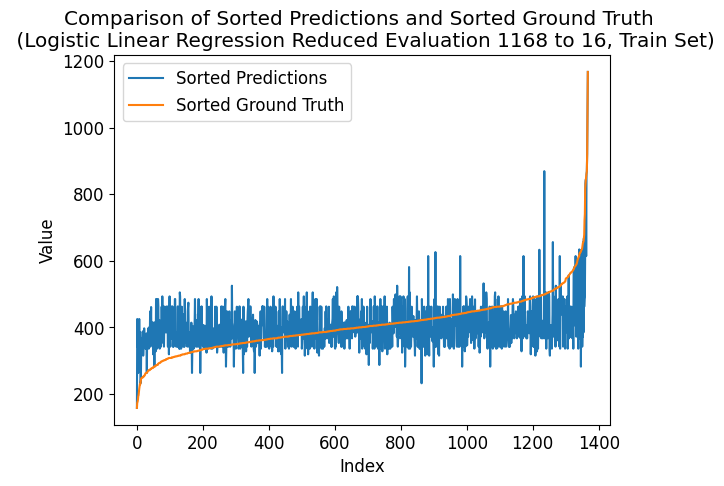

---- ---- ----
class_num = 1184
Number of unique elements: 342
[   0.   74.  148.  222.  296.  370.  444.  518.  592.  666.  740.  814.
  888.  962. 1036. 1110. 1184.]
test eval:
Mean squared error: 1.8333333333333333
Correlation coefficient: 0.4137347989594087
Coefficient of determination (R-squared score, R2 score): 0.014005602240896309
train eval:
Mean squared error: 1.243421052631579
Correlation coefficient: 0.485483682213542
Coefficient of determination (R-squared score, R2 score): 0.12798226110901056


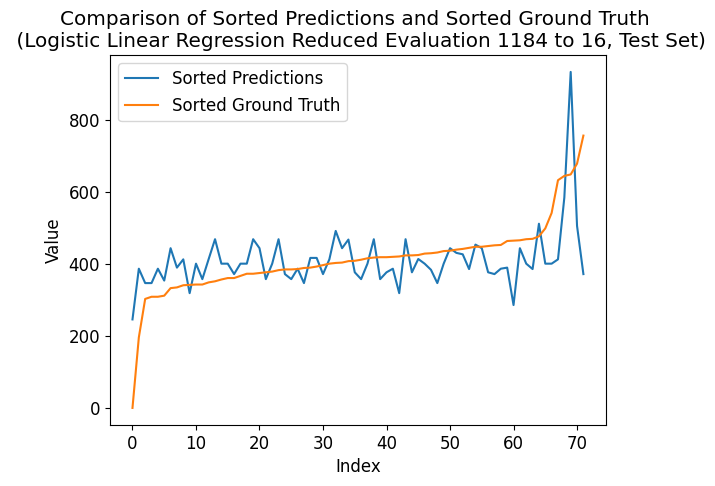

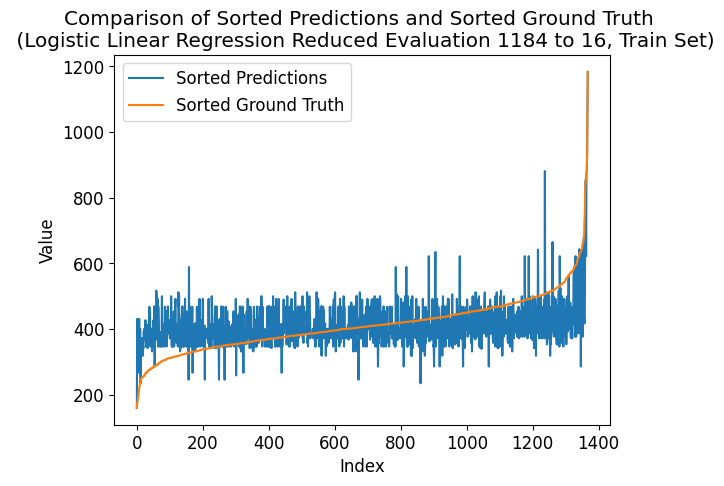

---- ---- ----
class_num = 1200
Number of unique elements: 346
[   0.   75.  150.  225.  300.  375.  450.  525.  600.  675.  750.  825.
  900.  975. 1050. 1125. 1200.]
test eval:
Mean squared error: 1.9027777777777777
Correlation coefficient: 0.3856102534693767
Coefficient of determination (R-squared score, R2 score): -0.023342670401493848
train eval:
Mean squared error: 1.2704678362573099
Correlation coefficient: 0.4891116040869614
Coefficient of determination (R-squared score, R2 score): 0.10901420917546167


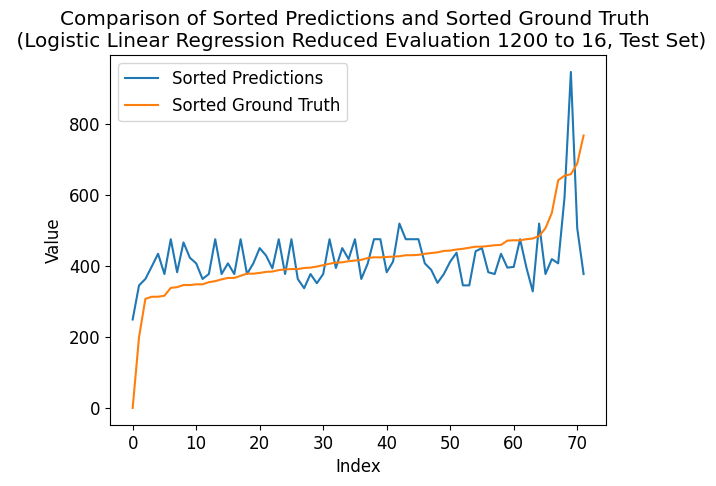

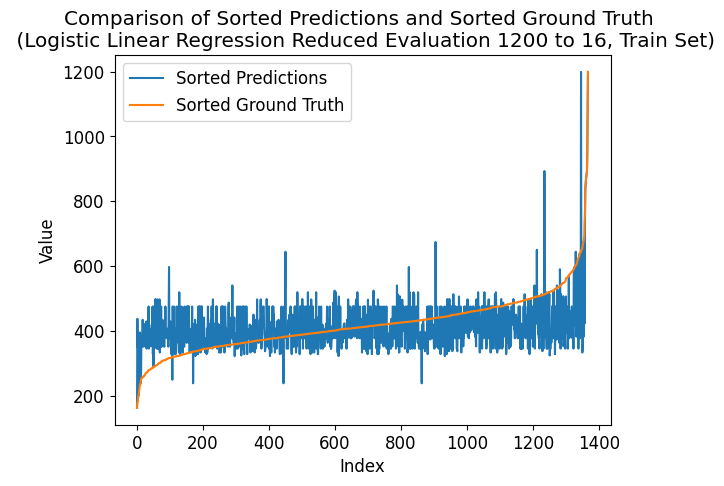

---- ---- ----
class_num = 1216
Number of unique elements: 347
[   0.   76.  152.  228.  304.  380.  456.  532.  608.  684.  760.  836.
  912.  988. 1064. 1140. 1216.]
test eval:
Mean squared error: 1.9166666666666667
Correlation coefficient: 0.37518576343555965
Coefficient of determination (R-squared score, R2 score): -0.03081232492997188
train eval:
Mean squared error: 1.1944444444444444
Correlation coefficient: 0.5053984255768346
Coefficient of determination (R-squared score, R2 score): 0.16232981461030171


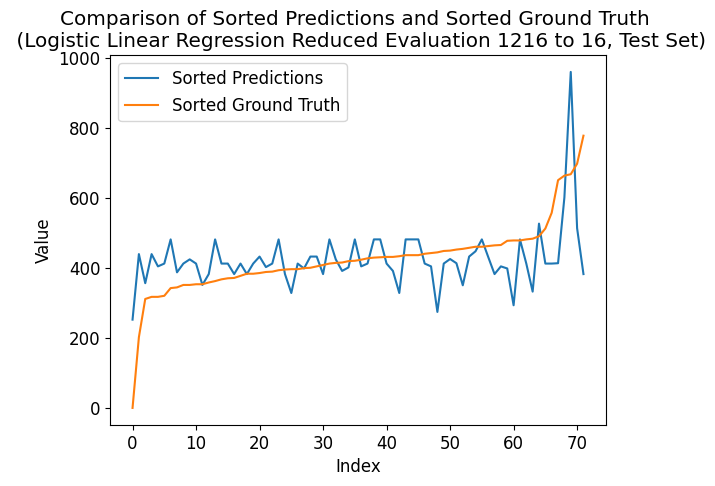

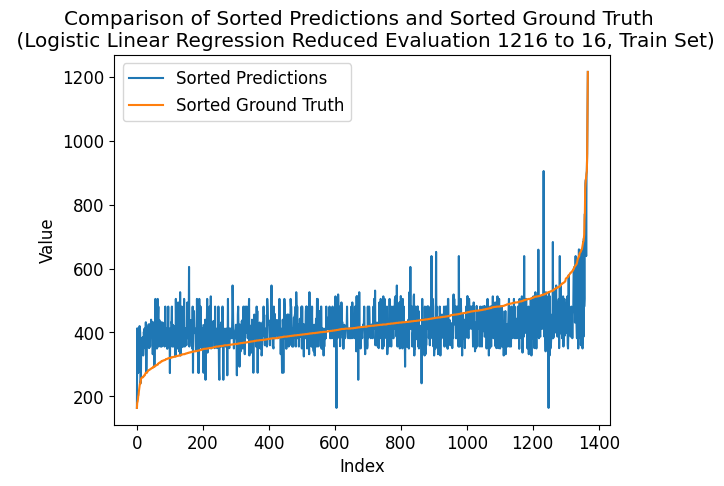

---- ---- ----
class_num = 1232
Number of unique elements: 347
[   0.   77.  154.  231.  308.  385.  462.  539.  616.  693.  770.  847.
  924. 1001. 1078. 1155. 1232.]
test eval:
Mean squared error: 1.7777777777777777
Correlation coefficient: 0.4084362837832298
Coefficient of determination (R-squared score, R2 score): 0.043884220354808545
train eval:
Mean squared error: 1.2295321637426901
Correlation coefficient: 0.48753829537709903
Coefficient of determination (R-squared score, R2 score): 0.13772261210191394


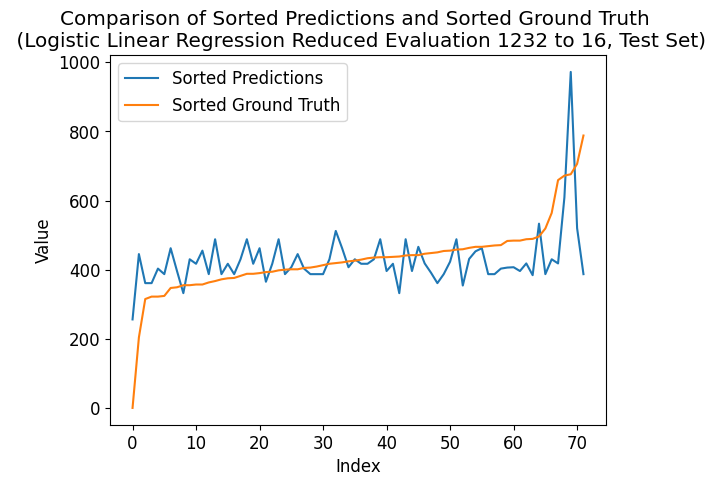

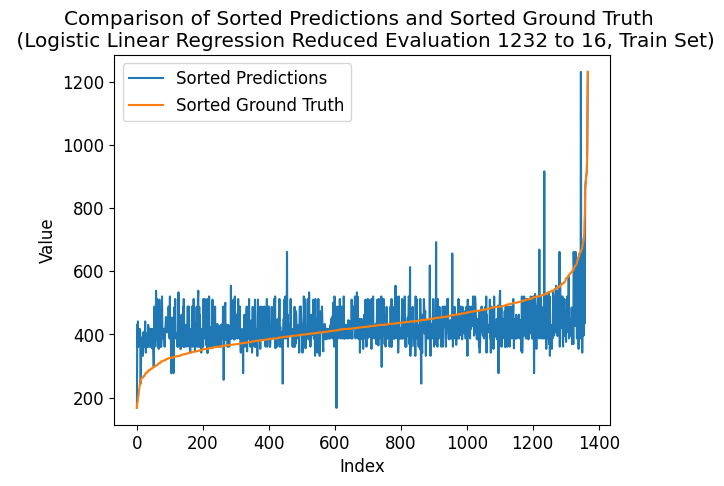

---- ---- ----
class_num = 1248
Number of unique elements: 352
[   0.   78.  156.  234.  312.  390.  468.  546.  624.  702.  780.  858.
  936. 1014. 1092. 1170. 1248.]
test eval:
Mean squared error: 2.013888888888889
Correlation coefficient: 0.3399437590796833
Coefficient of determination (R-squared score, R2 score): -0.08309990662931832
train eval:
Mean squared error: 1.2448830409356726
Correlation coefficient: 0.477891117240075
Coefficient of determination (R-squared score, R2 score): 0.12695696100449438


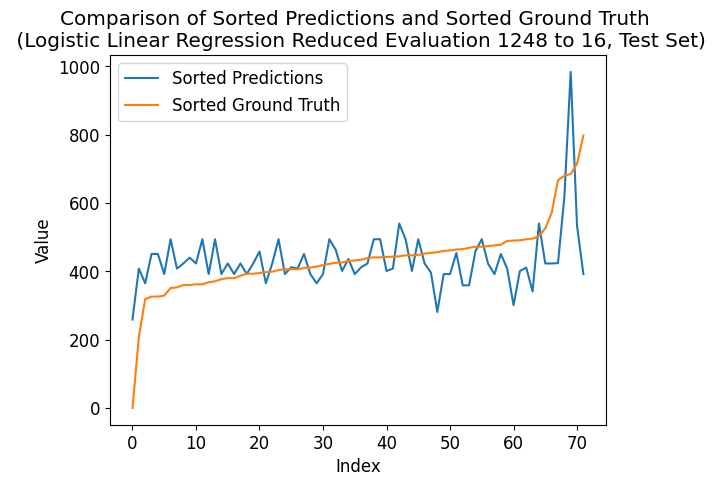

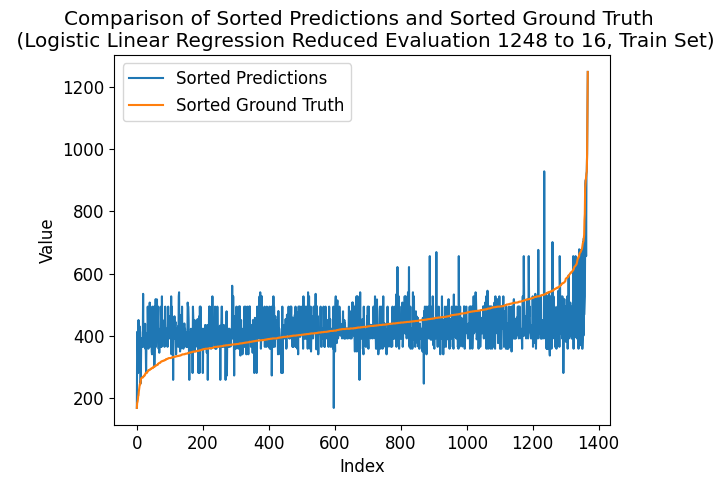

---- ---- ----
class_num = 1264
Number of unique elements: 362
[   0.   79.  158.  237.  316.  395.  474.  553.  632.  711.  790.  869.
  948. 1027. 1106. 1185. 1264.]
test eval:
Mean squared error: 1.9166666666666667
Correlation coefficient: 0.383207539724106
Coefficient of determination (R-squared score, R2 score): -0.03081232492997188
train eval:
Mean squared error: 1.2251461988304093
Correlation coefficient: 0.4939207915172938
Coefficient of determination (R-squared score, R2 score): 0.14079851241546248


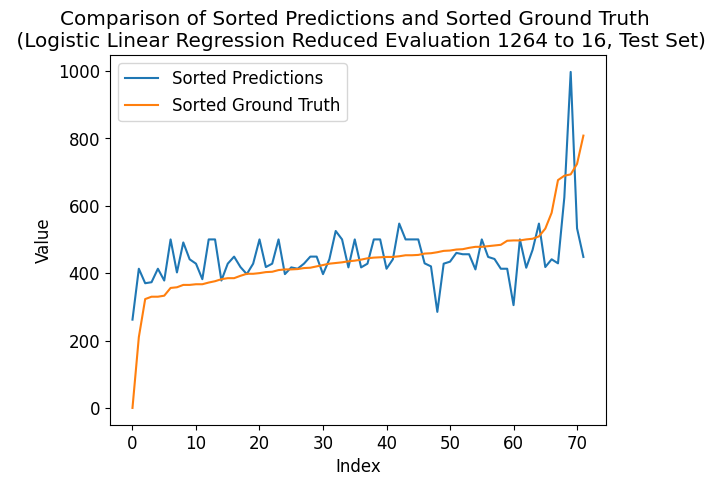

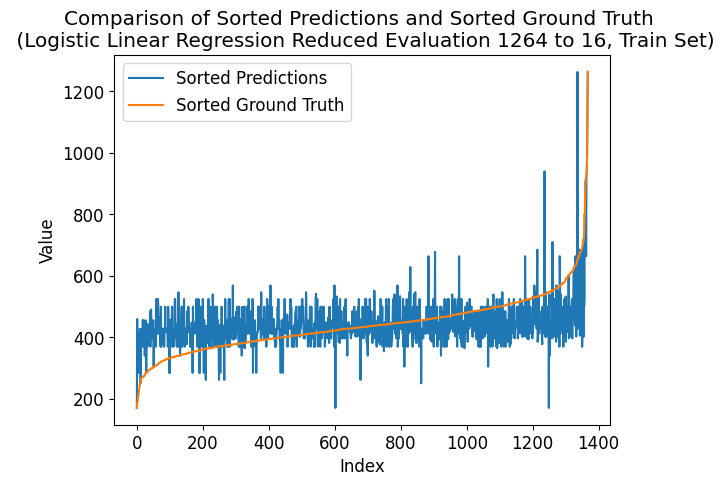

---- ---- ----
class_num = 1280
Number of unique elements: 356
[   0.   80.  160.  240.  320.  400.  480.  560.  640.  720.  800.  880.
  960. 1040. 1120. 1200. 1280.]
test eval:
Mean squared error: 1.7361111111111112
Correlation coefficient: 0.4474038384503889
Coefficient of determination (R-squared score, R2 score): 0.06629318394024275
train eval:
Mean squared error: 1.3596491228070176
Correlation coefficient: 0.4520649394372574
Coefficient of determination (R-squared score, R2 score): 0.04647090279997623


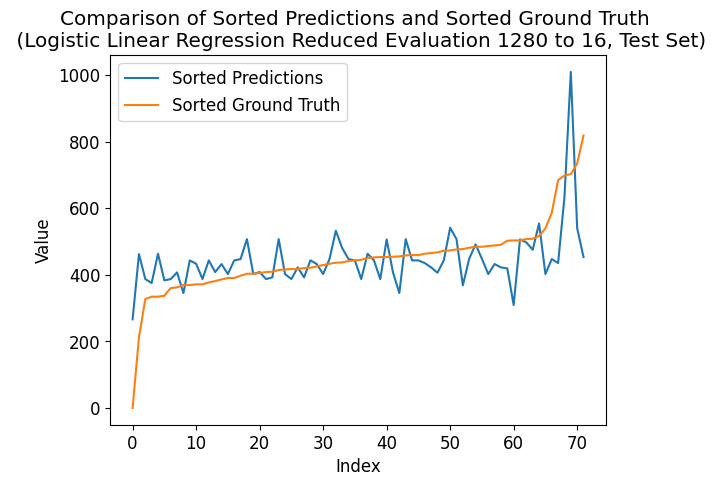

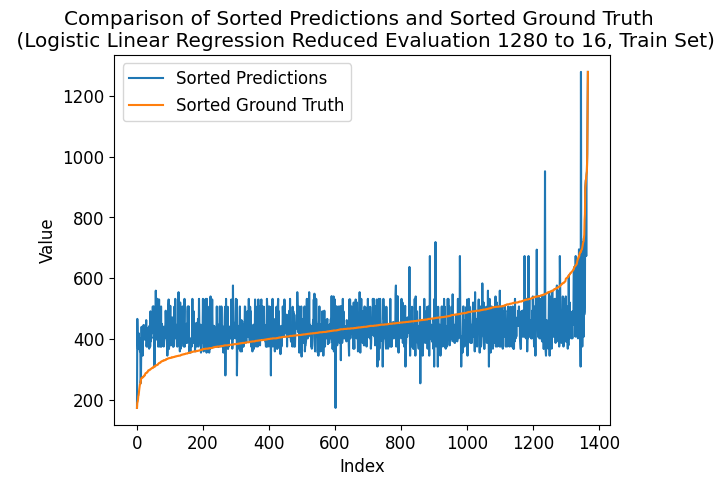

---- ---- ----
class_num = 1296
Number of unique elements: 366
[   0.   81.  162.  243.  324.  405.  486.  567.  648.  729.  810.  891.
  972. 1053. 1134. 1215. 1296.]
test eval:
Mean squared error: 1.9722222222222223
Correlation coefficient: 0.3706095612956417
Coefficient of determination (R-squared score, R2 score): -0.06069094304388423
train eval:
Mean squared error: 1.2675438596491229
Correlation coefficient: 0.47292463300046395
Coefficient of determination (R-squared score, R2 score): 0.11106480938449392


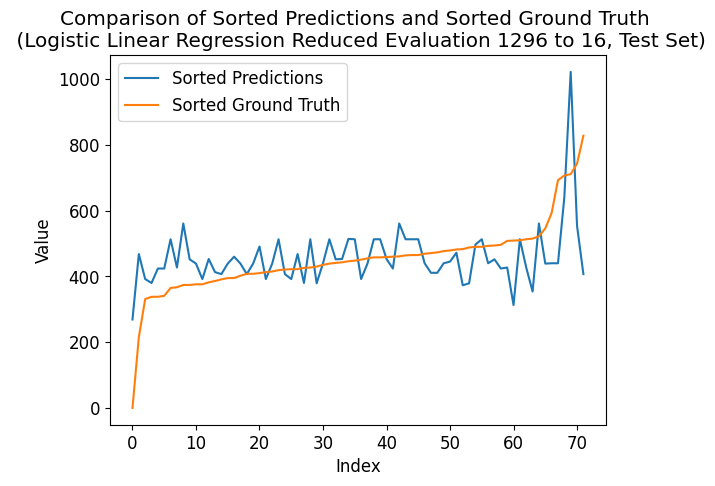

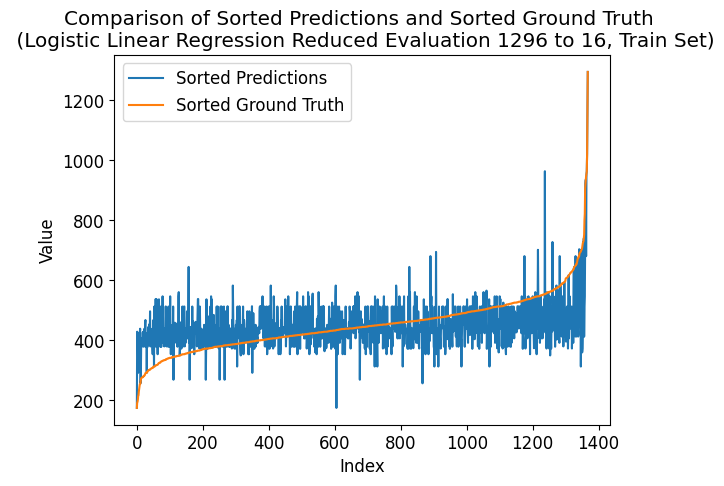

---- ---- ----
class_num = 1312
Number of unique elements: 368
[   0.   82.  164.  246.  328.  410.  492.  574.  656.  738.  820.  902.
  984. 1066. 1148. 1230. 1312.]
test eval:
Mean squared error: 1.7777777777777777
Correlation coefficient: 0.40456664882178633
Coefficient of determination (R-squared score, R2 score): 0.043884220354808545
train eval:
Mean squared error: 1.2295321637426901
Correlation coefficient: 0.49208731415051526
Coefficient of determination (R-squared score, R2 score): 0.13772261210191394


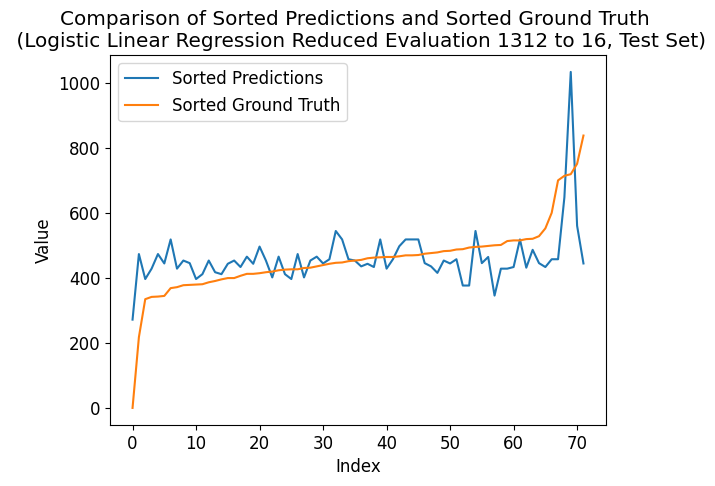

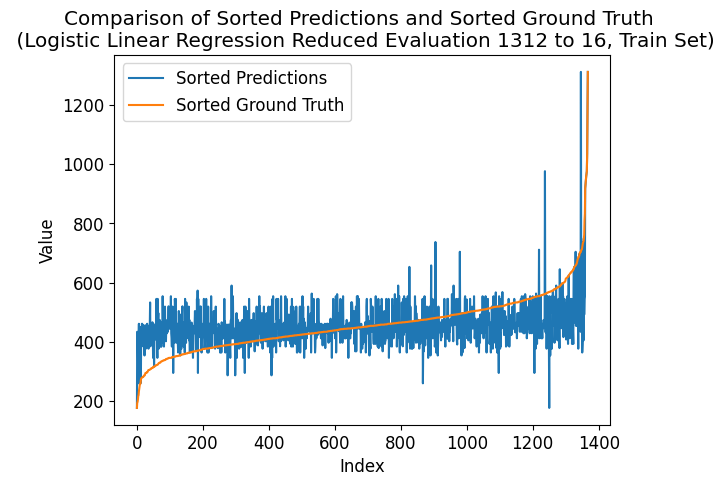

---- ---- ----
class_num = 1328
Number of unique elements: 370
[   0.   83.  166.  249.  332.  415.  498.  581.  664.  747.  830.  913.
  996. 1079. 1162. 1245. 1328.]
test eval:
Mean squared error: 1.9444444444444444
Correlation coefficient: 0.36176557943869
Coefficient of determination (R-squared score, R2 score): -0.045751633986928164
train eval:
Mean squared error: 1.2887426900584795
Correlation coefficient: 0.45964704856357114
Coefficient of determination (R-squared score, R2 score): 0.09619795786900975


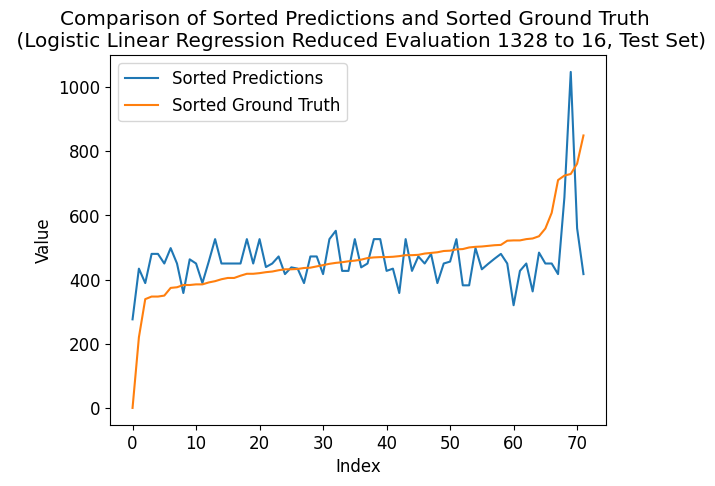

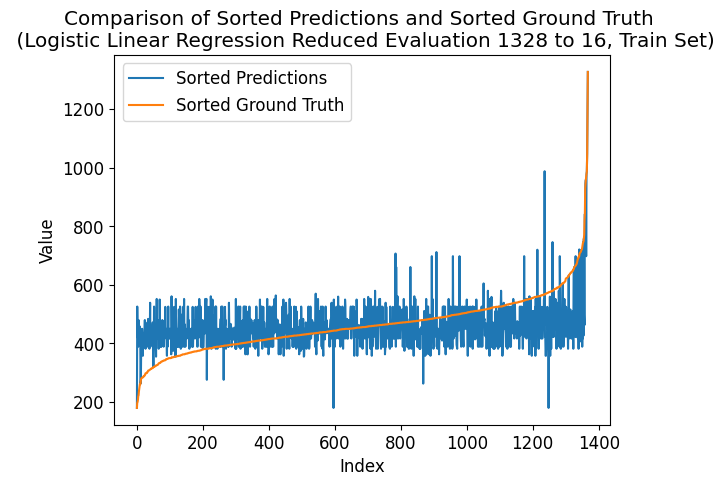

---- ---- ----
class_num = 1344
Number of unique elements: 372
[   0.   84.  168.  252.  336.  420.  504.  588.  672.  756.  840.  924.
 1008. 1092. 1176. 1260. 1344.]
test eval:
Mean squared error: 1.875
Correlation coefficient: 0.38099053375714387
Coefficient of determination (R-squared score, R2 score): -0.008403361344537785
train eval:
Mean squared error: 1.182748538011696
Correlation coefficient: 0.5003685087544218
Coefficient of determination (R-squared score, R2 score): 0.17053221544643093


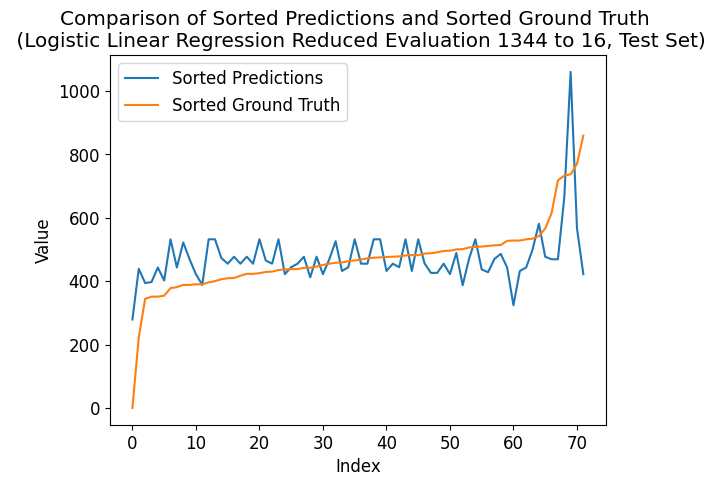

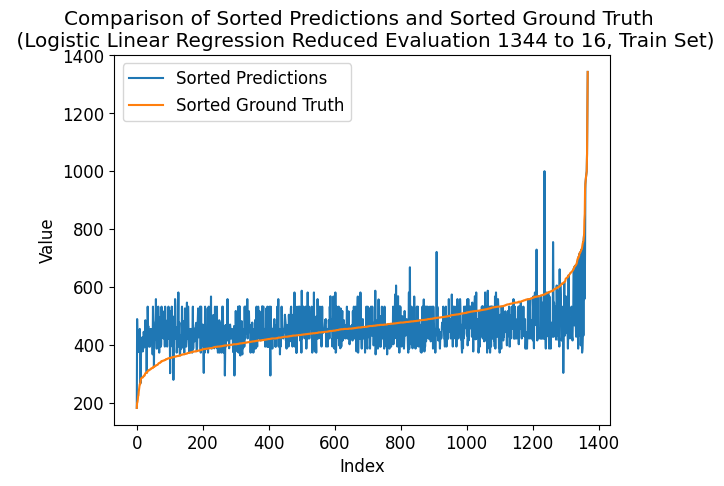

---- ---- ----
class_num = 1360
Number of unique elements: 371
[   0.   85.  170.  255.  340.  425.  510.  595.  680.  765.  850.  935.
 1020. 1105. 1190. 1275. 1360.]
test eval:
Mean squared error: 1.7083333333333333
Correlation coefficient: 0.435047042551659
Coefficient of determination (R-squared score, R2 score): 0.08123249299719892
train eval:
Mean squared error: 1.2682748538011697
Correlation coefficient: 0.4664945248439736
Coefficient of determination (R-squared score, R2 score): 0.11055215933223583


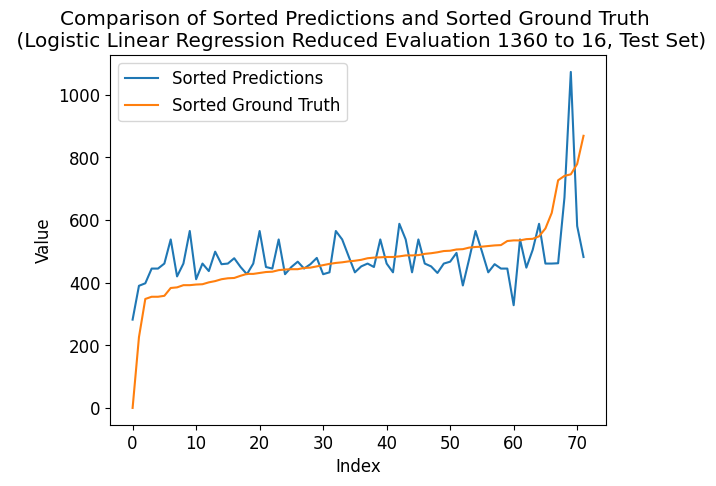

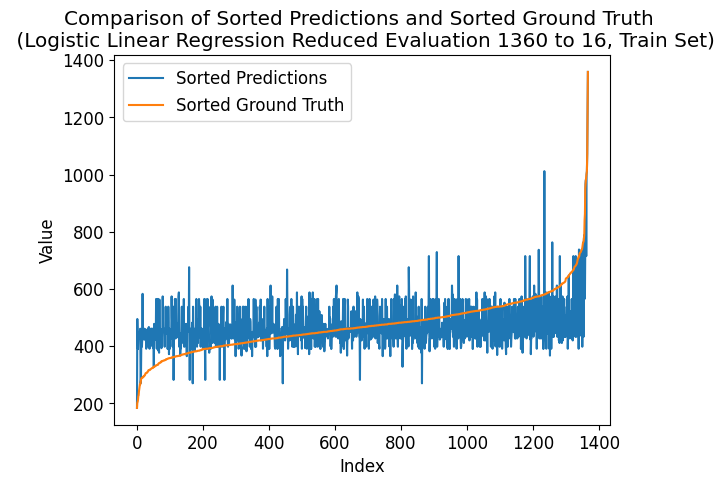

---- ---- ----
class_num = 1376
Number of unique elements: 377
[   0.   86.  172.  258.  344.  430.  516.  602.  688.  774.  860.  946.
 1032. 1118. 1204. 1290. 1376.]
test eval:
Mean squared error: 1.8611111111111112
Correlation coefficient: 0.413434161766323
Coefficient of determination (R-squared score, R2 score): -0.0009337068160597539
train eval:
Mean squared error: 1.236842105263158
Correlation coefficient: 0.49104931350658143
Coefficient of determination (R-squared score, R2 score): 0.13259611157933315


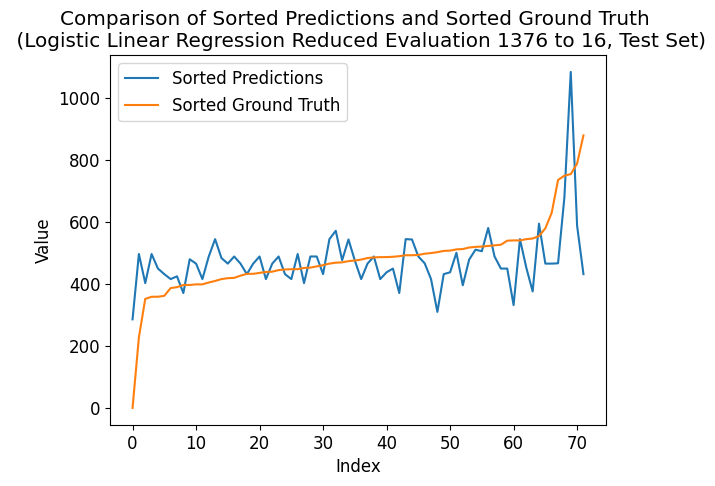

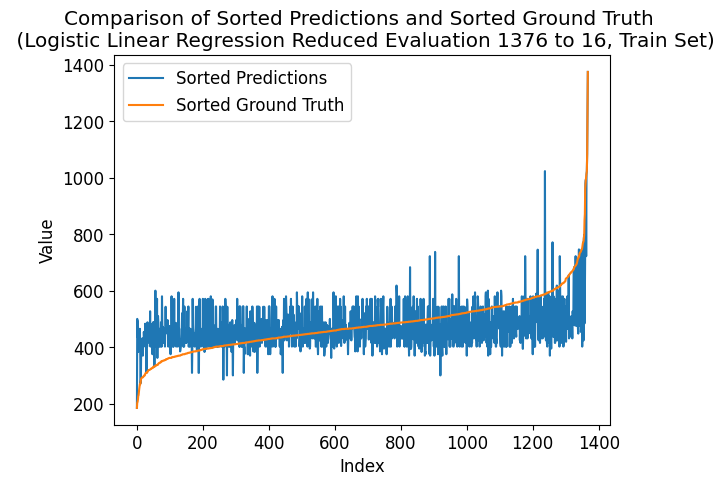

---- ---- ----
class_num = 1392
Number of unique elements: 383
[   0.   87.  174.  261.  348.  435.  522.  609.  696.  783.  870.  957.
 1044. 1131. 1218. 1305. 1392.]
test eval:
Mean squared error: 2.0972222222222223
Correlation coefficient: 0.33083959438263544
Coefficient of determination (R-squared score, R2 score): -0.12791783380018673
train eval:
Mean squared error: 1.226608187134503
Correlation coefficient: 0.5058904561511268
Coefficient of determination (R-squared score, R2 score): 0.1397732123109463


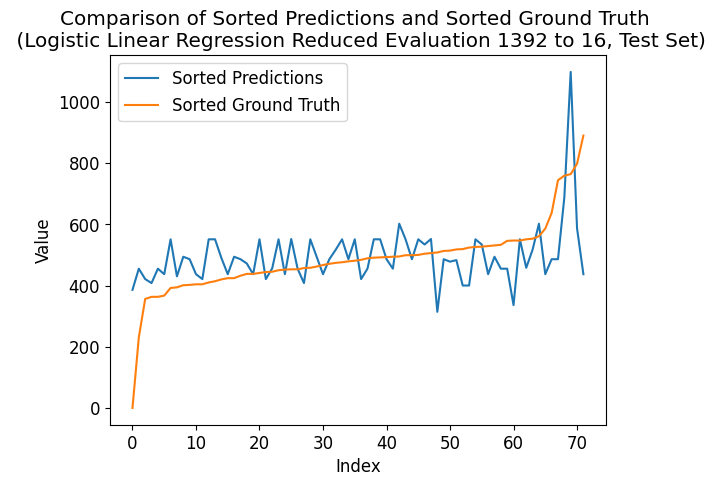

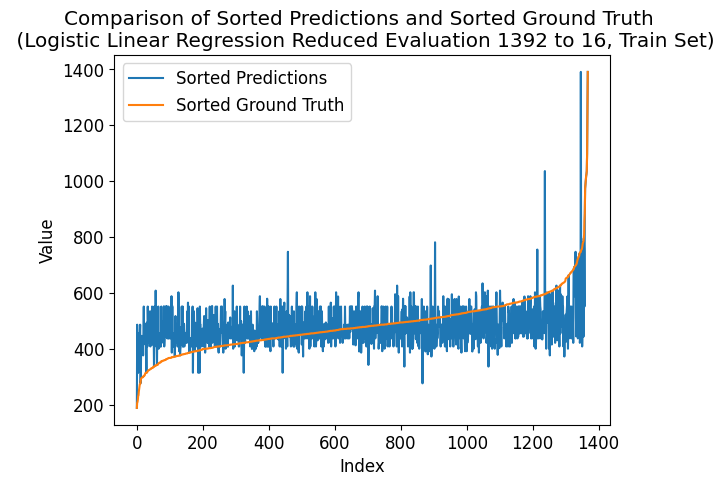

---- ---- ----
class_num = 1408
Number of unique elements: 382
[   0.   88.  176.  264.  352.  440.  528.  616.  704.  792.  880.  968.
 1056. 1144. 1232. 1320. 1408.]
test eval:
Mean squared error: 2.0833333333333335
Correlation coefficient: 0.34456362234832855
Coefficient of determination (R-squared score, R2 score): -0.1204481792717087
train eval:
Mean squared error: 1.3004385964912282
Correlation coefficient: 0.4601800591879395
Coefficient of determination (R-squared score, R2 score): 0.08799555703288053


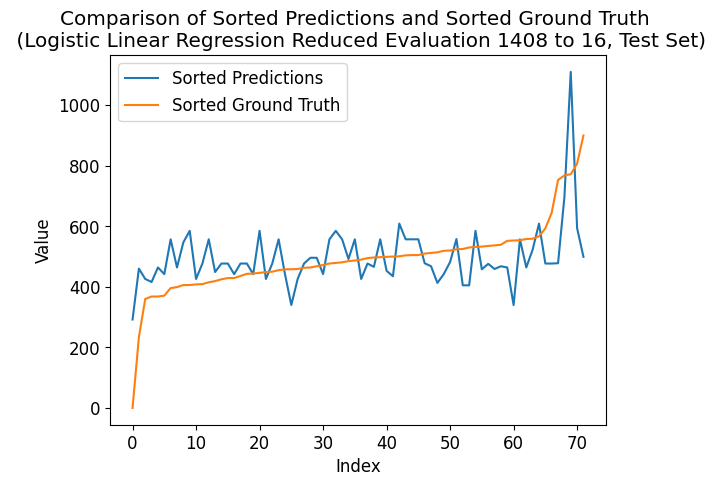

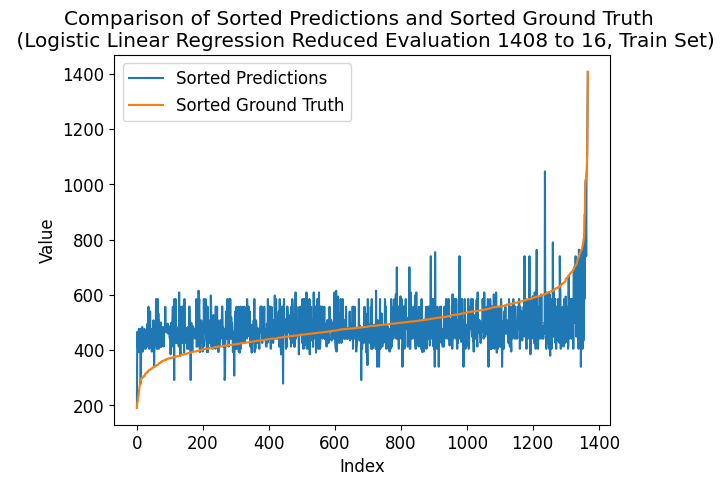

---- ---- ----
class_num = 1424
Number of unique elements: 386
[   0.   89.  178.  267.  356.  445.  534.  623.  712.  801.  890.  979.
 1068. 1157. 1246. 1335. 1424.]
test eval:
Mean squared error: 1.7916666666666667
Correlation coefficient: 0.41574004869527287
Coefficient of determination (R-squared score, R2 score): 0.036414565826330514
train eval:
Mean squared error: 1.1710526315789473
Correlation coefficient: 0.5141586856048364
Coefficient of determination (R-squared score, R2 score): 0.17873461628256015


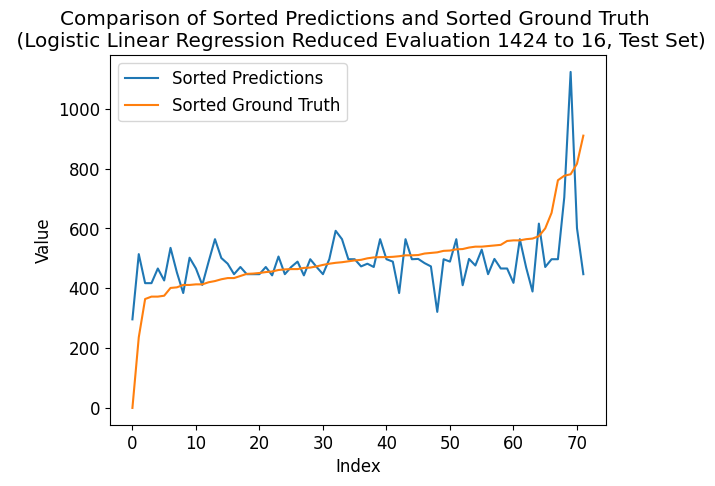

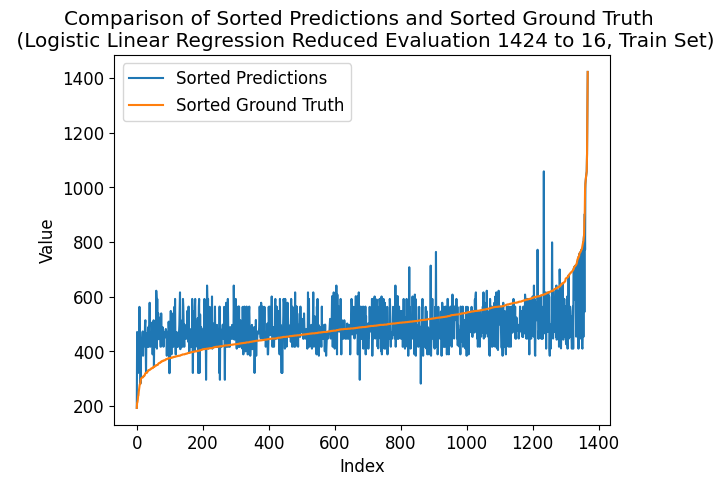

---- ---- ----
class_num = 1440
Number of unique elements: 396
[   0.   90.  180.  270.  360.  450.  540.  630.  720.  810.  900.  990.
 1080. 1170. 1260. 1350. 1440.]
test eval:
Mean squared error: 1.7777777777777777
Correlation coefficient: 0.41325664650877453
Coefficient of determination (R-squared score, R2 score): 0.043884220354808545
train eval:
Mean squared error: 1.185672514619883
Correlation coefficient: 0.4902188114305292
Coefficient of determination (R-squared score, R2 score): 0.16848161523739857


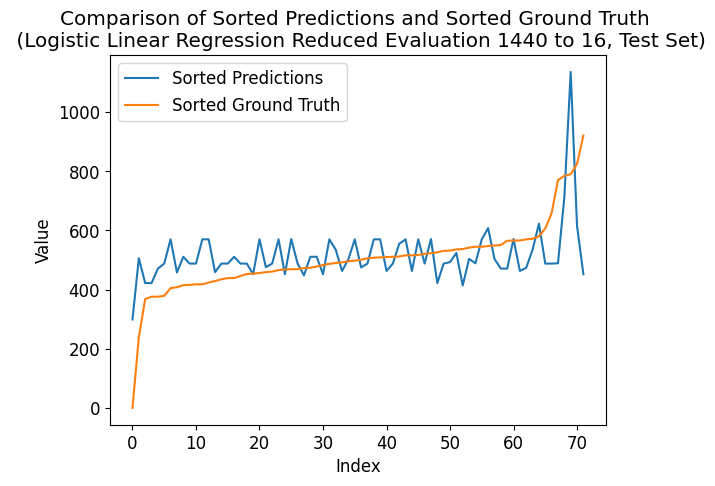

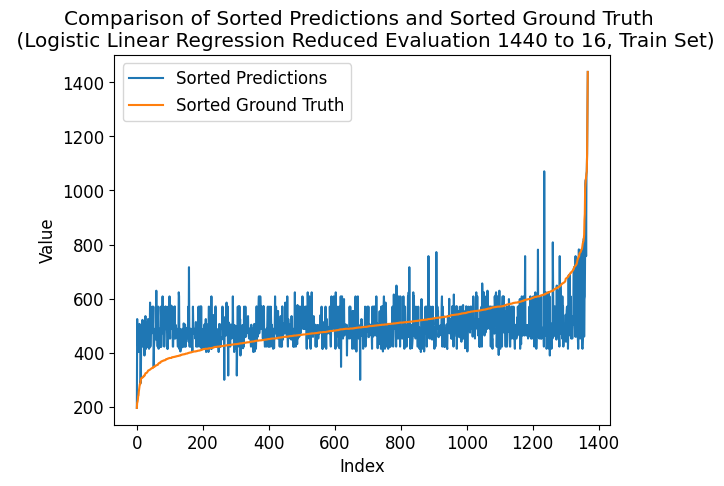

---- ---- ----
class_num = 1456
Number of unique elements: 392
[   0.   91.  182.  273.  364.  455.  546.  637.  728.  819.  910. 1001.
 1092. 1183. 1274. 1365. 1456.]
test eval:
Mean squared error: 1.8472222222222223
Correlation coefficient: 0.3922657747207214
Coefficient of determination (R-squared score, R2 score): 0.006535947712418277
train eval:
Mean squared error: 1.2076023391812865
Correlation coefficient: 0.4945476084131888
Coefficient of determination (R-squared score, R2 score): 0.15310211366965631


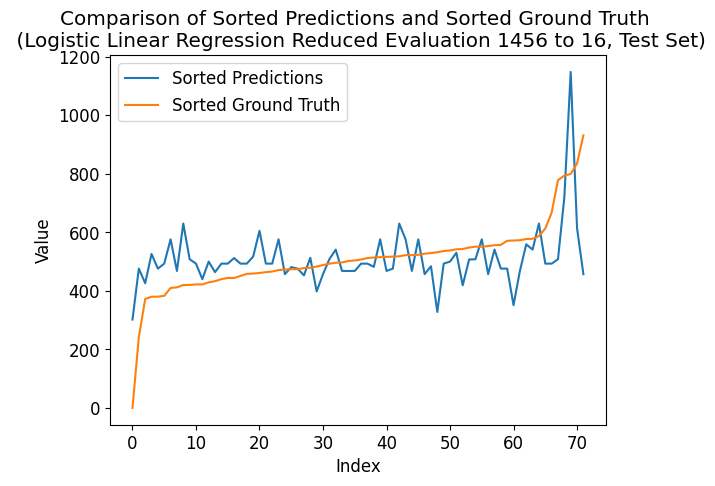

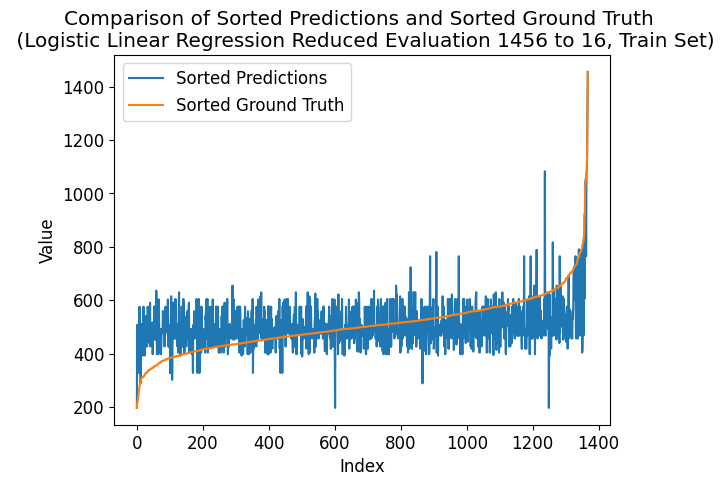

---- ---- ----
class_num = 1472
Number of unique elements: 396
[   0.   92.  184.  276.  368.  460.  552.  644.  736.  828.  920. 1012.
 1104. 1196. 1288. 1380. 1472.]
test eval:
Mean squared error: 1.9027777777777777
Correlation coefficient: 0.39368855021967386
Coefficient of determination (R-squared score, R2 score): -0.023342670401493848
train eval:
Mean squared error: 1.2485380116959064
Correlation coefficient: 0.5032400900486917
Coefficient of determination (R-squared score, R2 score): 0.12439371074320393


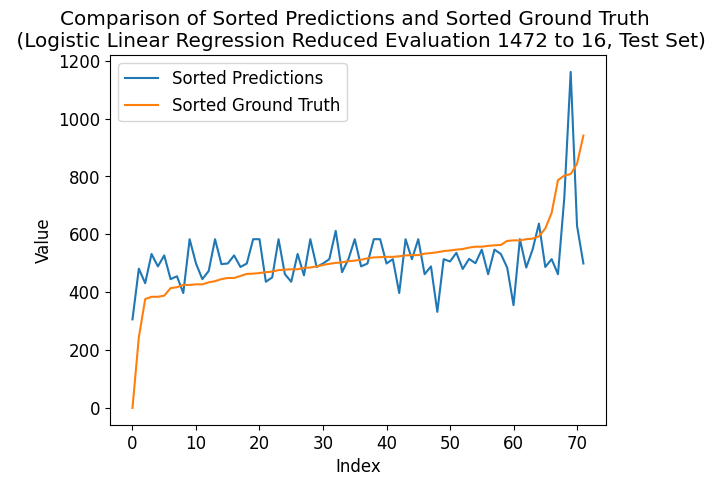

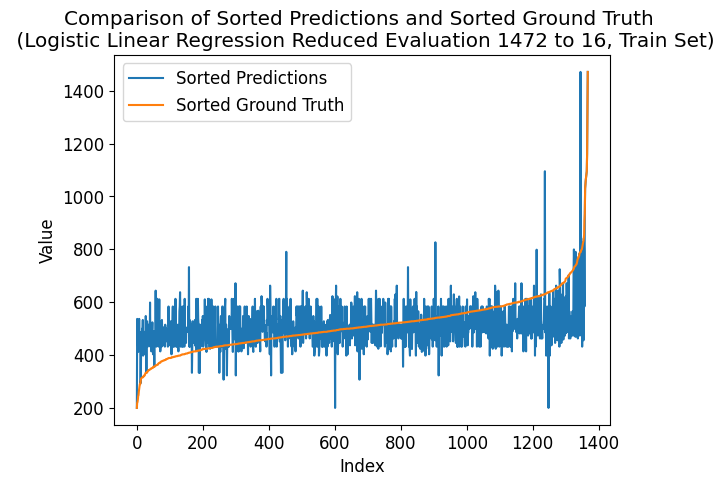

---- ---- ----
class_num = 1488
Number of unique elements: 402
[   0.   93.  186.  279.  372.  465.  558.  651.  744.  837.  930. 1023.
 1116. 1209. 1302. 1395. 1488.]
test eval:
Mean squared error: 1.875
Correlation coefficient: 0.41048083566793636
Coefficient of determination (R-squared score, R2 score): -0.008403361344537785
train eval:
Mean squared error: 1.2580409356725146
Correlation coefficient: 0.48405756700865465
Coefficient of determination (R-squared score, R2 score): 0.11772926006384898


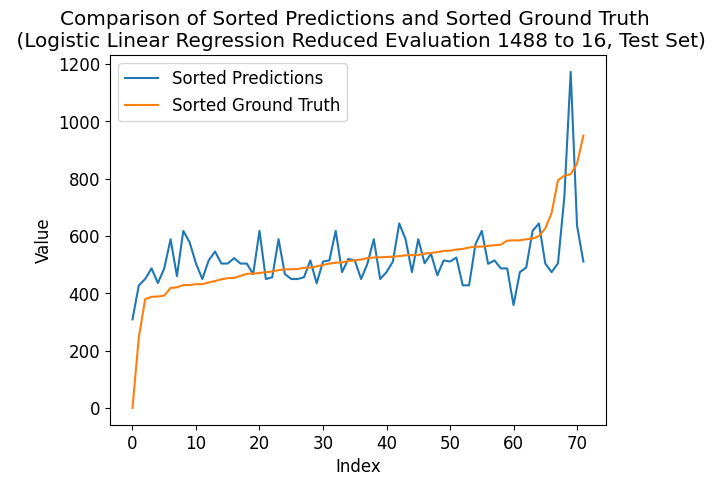

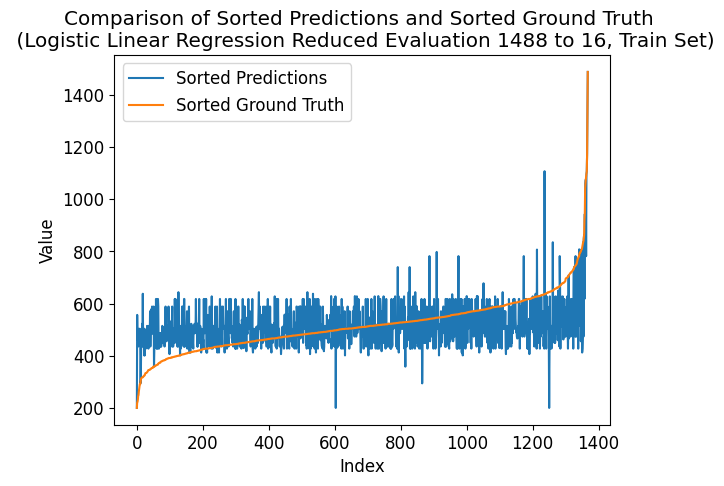

---- ---- ----
class_num = 1504
Number of unique elements: 404
[   0.   94.  188.  282.  376.  470.  564.  658.  752.  846.  940. 1034.
 1128. 1222. 1316. 1410. 1504.]
test eval:
Mean squared error: 1.9027777777777777
Correlation coefficient: 0.39678485708741124
Coefficient of determination (R-squared score, R2 score): -0.023342670401493848
train eval:
Mean squared error: 1.273391812865497
Correlation coefficient: 0.4896315247523248
Coefficient of determination (R-squared score, R2 score): 0.10696360896642931


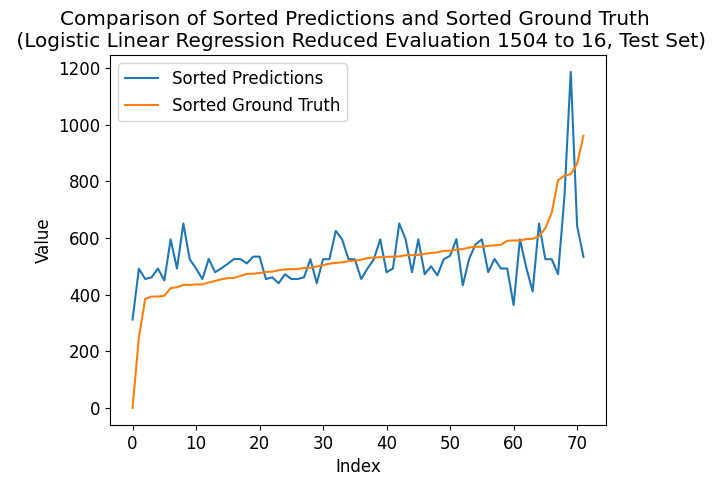

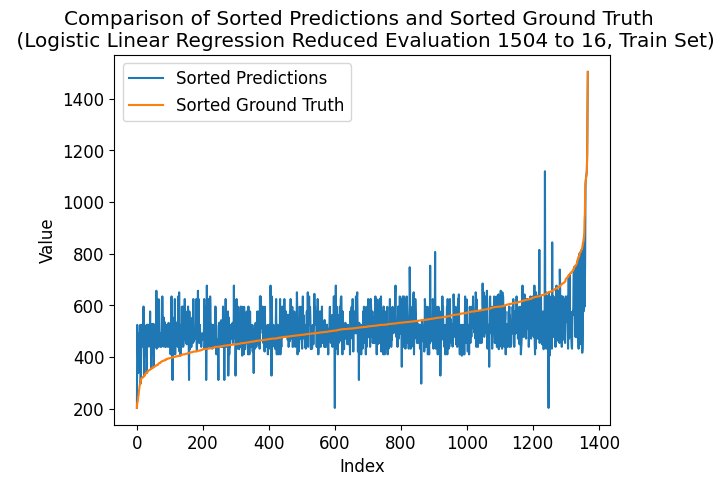

---- ---- ----
class_num = 1520
Number of unique elements: 404
[   0.   95.  190.  285.  380.  475.  570.  665.  760.  855.  950. 1045.
 1140. 1235. 1330. 1425. 1520.]
test eval:
Mean squared error: 1.7916666666666667
Correlation coefficient: 0.40697222497305247
Coefficient of determination (R-squared score, R2 score): 0.036414565826330514
train eval:
Mean squared error: 1.1973684210526316
Correlation coefficient: 0.4913412954857841
Coefficient of determination (R-squared score, R2 score): 0.16027921440126935


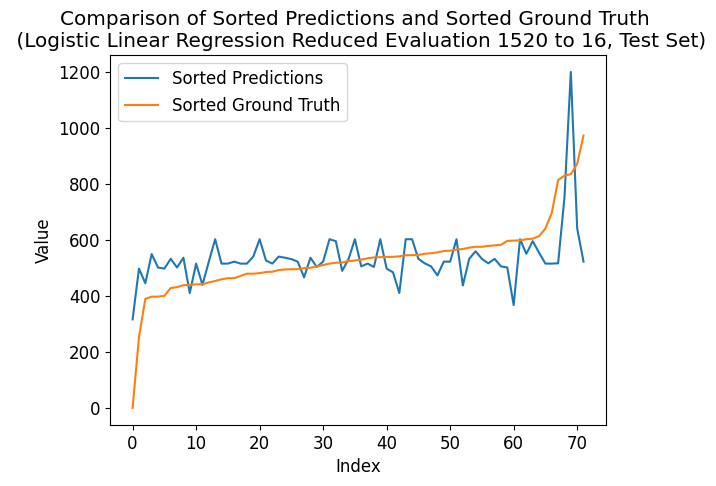

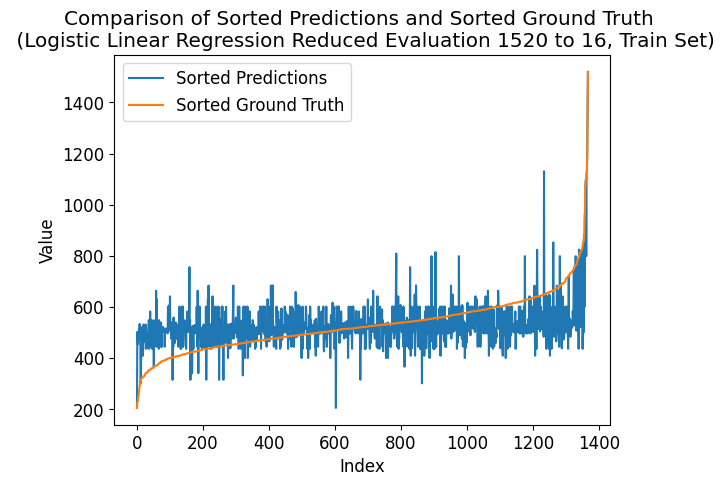

---- ---- ----
class_num = 1536
Number of unique elements: 408
[   0.   96.  192.  288.  384.  480.  576.  672.  768.  864.  960. 1056.
 1152. 1248. 1344. 1440. 1536.]
test eval:
Mean squared error: 2.2083333333333335
Correlation coefficient: 0.30649383154711757
Coefficient of determination (R-squared score, R2 score): -0.1876750700280112
train eval:
Mean squared error: 1.3245614035087718
Correlation coefficient: 0.47964636775154507
Coefficient of determination (R-squared score, R2 score): 0.07107810530836389


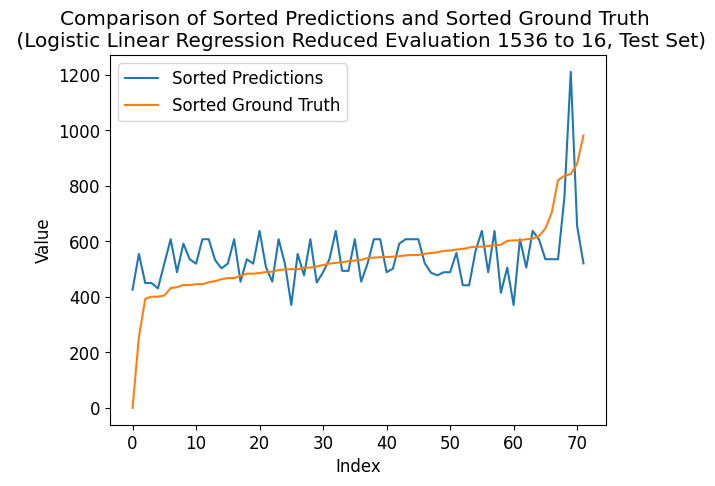

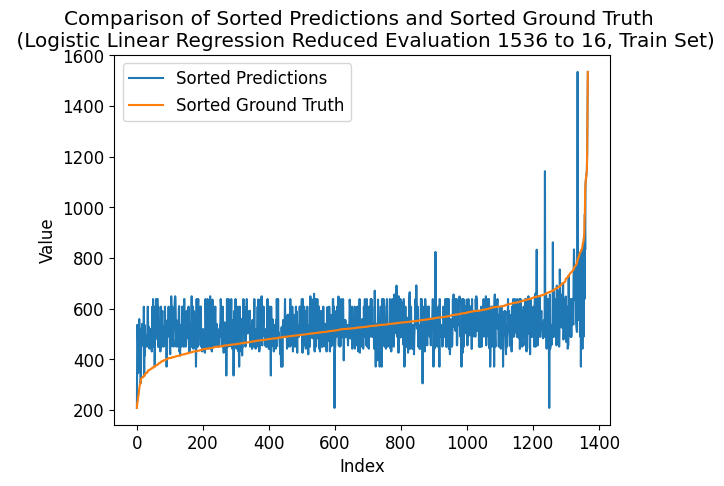

---- ---- ----
class_num = 1552
Number of unique elements: 405
[   0.   97.  194.  291.  388.  485.  582.  679.  776.  873.  970. 1067.
 1164. 1261. 1358. 1455. 1552.]
test eval:
Mean squared error: 1.7083333333333333
Correlation coefficient: 0.4414361692952945
Coefficient of determination (R-squared score, R2 score): 0.08123249299719892
train eval:
Mean squared error: 1.2485380116959064
Correlation coefficient: 0.488534227346123
Coefficient of determination (R-squared score, R2 score): 0.12439371074320393


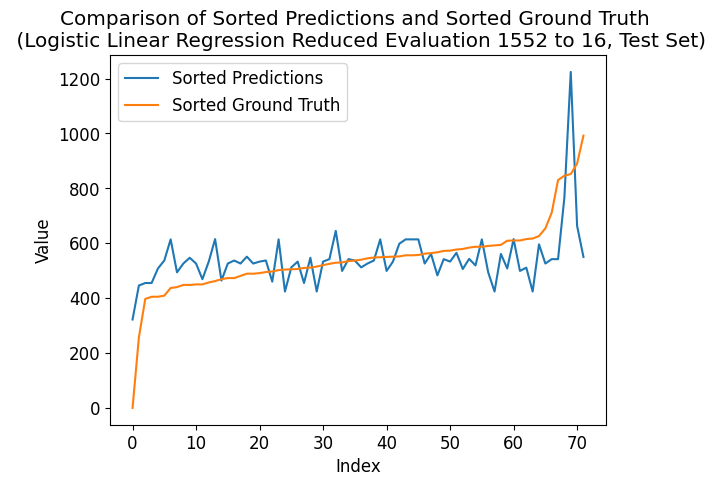

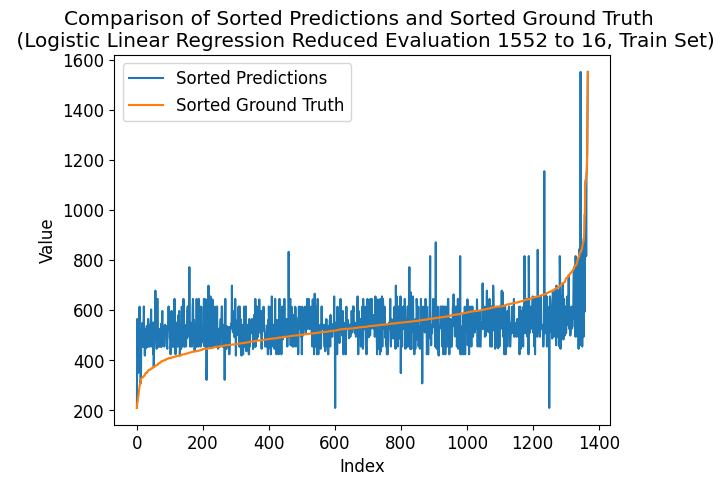

---- ---- ----
class_num = 1568
Number of unique elements: 413
[   0.   98.  196.  294.  392.  490.  588.  686.  784.  882.  980. 1078.
 1176. 1274. 1372. 1470. 1568.]
test eval:
Mean squared error: 1.9305555555555556
Correlation coefficient: 0.3582330363535253
Coefficient of determination (R-squared score, R2 score): -0.03828197945845013
train eval:
Mean squared error: 1.161549707602339
Correlation coefficient: 0.506796995884191
Coefficient of determination (R-squared score, R2 score): 0.18539906696191522


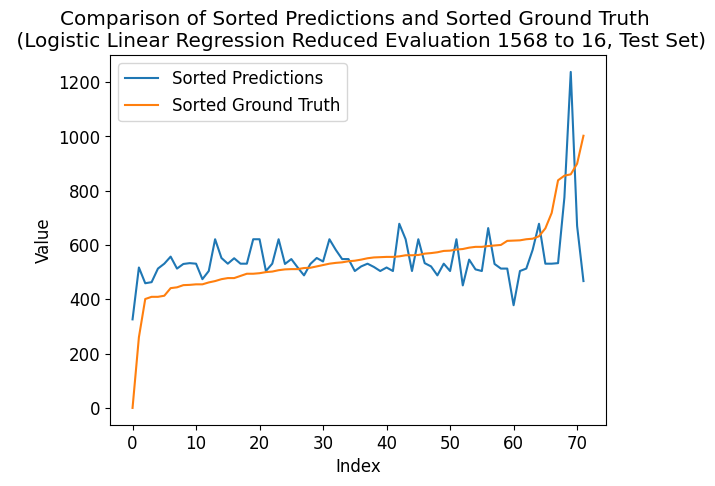

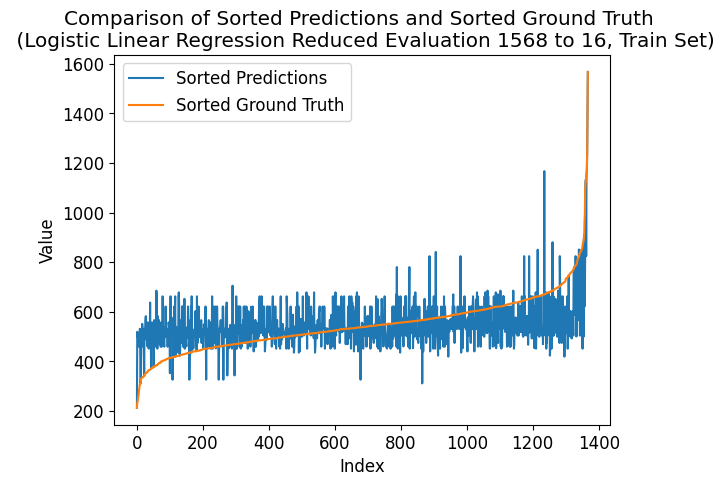

---- ---- ----
class_num = 1584
Number of unique elements: 417
[   0.   99.  198.  297.  396.  495.  594.  693.  792.  891.  990. 1089.
 1188. 1287. 1386. 1485. 1584.]
test eval:
Mean squared error: 1.9722222222222223
Correlation coefficient: 0.38708808512121956
Coefficient of determination (R-squared score, R2 score): -0.06069094304388423
train eval:
Mean squared error: 1.2551169590643274
Correlation coefficient: 0.4768290483095451
Coefficient of determination (R-squared score, R2 score): 0.11977986027288123


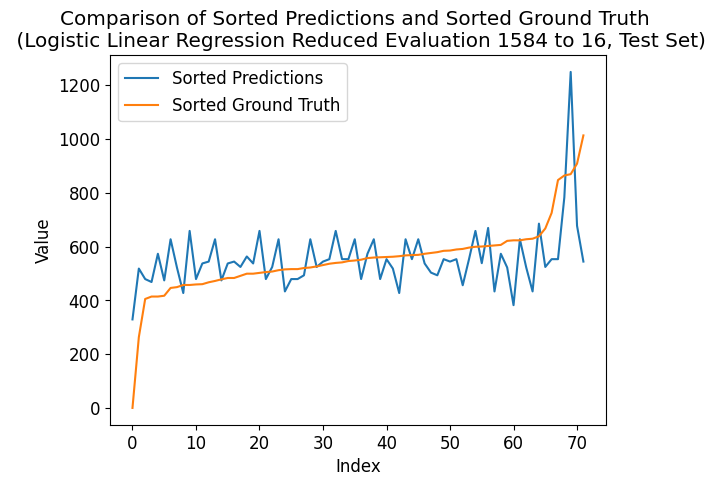

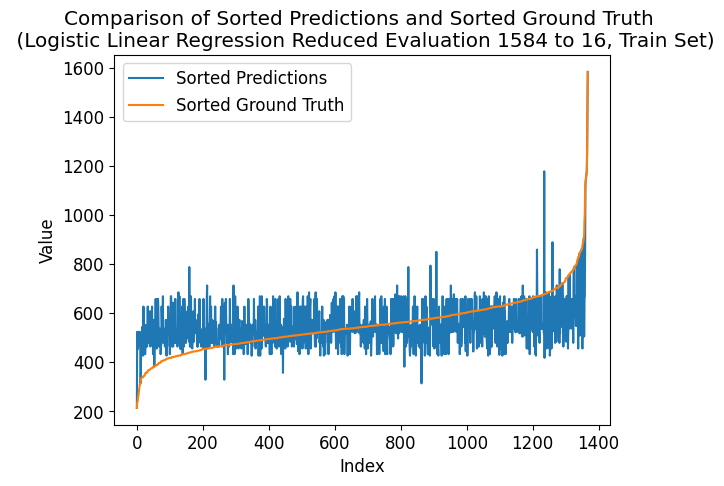

---- ---- ----
class_num = 1600
Number of unique elements: 415
[   0.  100.  200.  300.  400.  500.  600.  700.  800.  900. 1000. 1100.
 1200. 1300. 1400. 1500. 1600.]
test eval:
Mean squared error: 2.013888888888889
Correlation coefficient: 0.36854770096451805
Coefficient of determination (R-squared score, R2 score): -0.08309990662931832
train eval:
Mean squared error: 1.243421052631579
Correlation coefficient: 0.49224819113644336
Coefficient of determination (R-squared score, R2 score): 0.12798226110901056


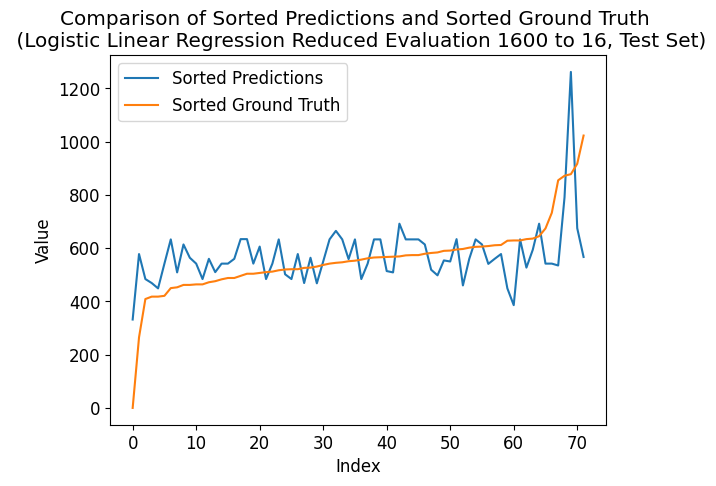

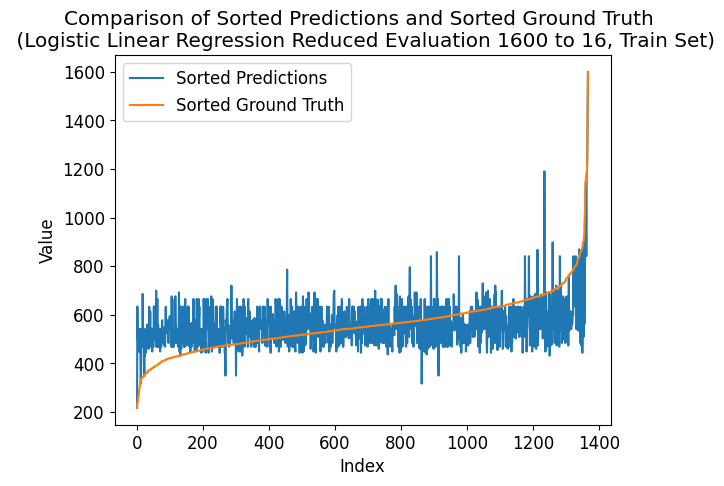

In [153]:
# independent data
x = group_satcked_green
# dependent data (labels/targets)
y = np.squeeze(stacked_red)

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max

print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

reduced_class_num = 16
class_num_array = np.arange(reduced_class_num, reduced_class_num * 100 + 1, reduced_class_num)
# class_num_array = np.arange(reduced_class_num * 5, reduced_class_num * 40 + 1, reduced_class_num)
mse_test_list = []
correlation_test_list = []
r_squared_test_list = []
mse_train_list = []
correlation_train_list = []
r_squared_train_list = []

for class_num in class_num_array:
    print('---- ---- ----')
    print(f'class_num = {class_num}')

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)

    # Generate class_num+1 evenly spaced intervals
    intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
    # print(intervals)
    # Digitize the array to get the indices of the intervals
    y_train = np.digitize(y_train, intervals) - 1
    y_test = np.digitize(y_test, intervals) - 1

    # to see unique elements (see if we have all 0, 1,..., class_num-1 classes, better close to all)
    unique_elements = np.unique(y_train)
    # print("Unique elements:", unique_elements)
    print("Number of unique elements:", len(unique_elements))

    model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='multinomial')
    fit_result = model.fit(x_train, y_train)

    y_pred = model.predict(x_test)
    y_pred_ = model.predict(x_train)

    # Define the boundaries for digitization
    intervals = np.arange(0, class_num+1, class_num/16)
    print(intervals)

    y_train_digital = np.digitize(y_train, intervals) - 1
    y_test_digital = np.digitize(y_test, intervals) - 1
    y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
    y_pred_test_digital = np.digitize(y_pred, intervals) - 1
    # print(y_pred)
    # print(y_pred_test_digital)
    print("test eval:")
    mse = mean_squared_error(y_test_digital, y_pred_test_digital)
    print("Mean squared error:", mse)
    correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
    print("Correlation coefficient:", correlation)
    r_squared = r2_score(y_test_digital, y_pred_test_digital)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)
    mse_test_list.append(mse)
    correlation_test_list.append(correlation)
    r_squared_test_list.append(r_squared)

    print("train eval:")
    mse = mean_squared_error(y_train_digital, y_pred_train_digital)
    print("Mean squared error:", mse)
    correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
    print("Correlation coefficient:", correlation)
    r_squared = r2_score(y_train_digital, y_pred_train_digital)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)
    mse_train_list.append(mse)
    correlation_train_list.append(correlation)
    r_squared_train_list.append(r_squared)

    plot_comparison(y_test, y_pred, f'Logistic Linear Regression Reduced Evaluation {class_num} to {reduced_class_num}, Test Set')
    plot_comparison(y_train, y_pred_, f'Logistic Linear Regression Reduced Evaluation {class_num} to {reduced_class_num}, Train Set')



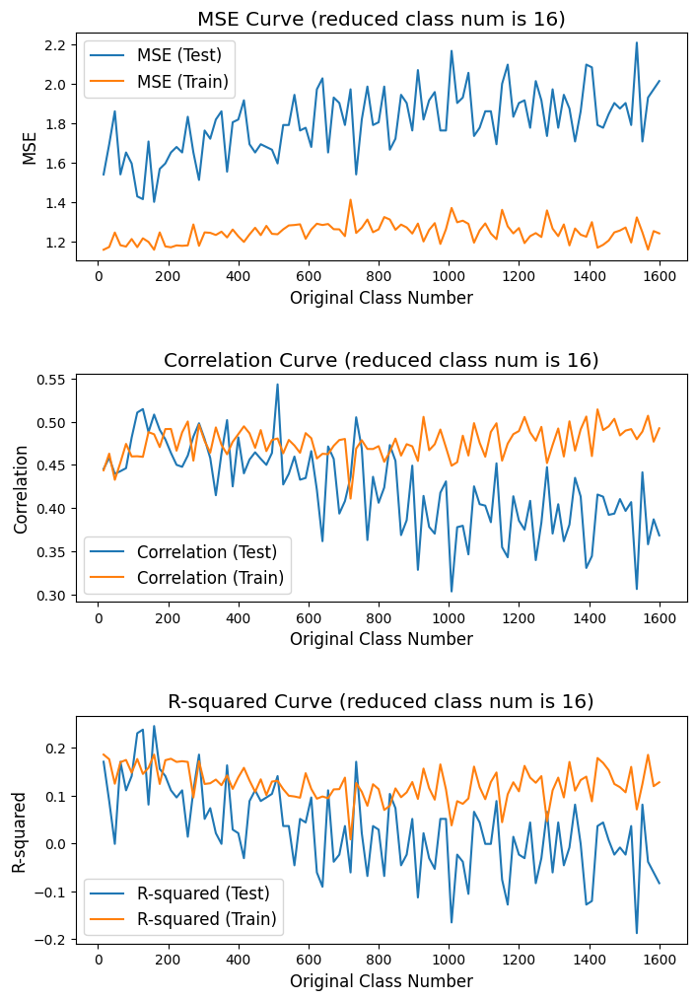

Max Index: 9
Max Original Class Num: 160


In [154]:
# plot the trend figures of mse, correlation, and r2

# Create a figure and subplots
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(8, 12))

# Plot MSE
ax1.plot(class_num_array, mse_test_list, label='MSE (Test)')
ax1.plot(class_num_array, mse_train_list, label='MSE (Train)')
ax1.set_ylabel('MSE')
ax1.set_xlabel('Original Class Number')
ax1.set_title(f'MSE Curve (reduced class num is {reduced_class_num})')
ax1.legend()

# Plot Correlation
ax2.plot(class_num_array, correlation_test_list, label='Correlation (Test)')
ax2.plot(class_num_array, correlation_train_list, label='Correlation (Train)')
ax2.set_ylabel('Correlation')
ax2.set_xlabel('Original Class Number')
ax2.set_title(f'Correlation Curve (reduced class num is {reduced_class_num})')
ax2.legend()

# Plot R-squared
ax3.plot(class_num_array, r_squared_test_list, label='R-squared (Test)')
ax3.plot(class_num_array, r_squared_train_list, label='R-squared (Train)')
ax3.set_ylabel('R-squared')
ax3.set_xlabel('Original Class Number')
ax3.set_title(f'R-squared Curve (reduced class num is {reduced_class_num})')
ax3.legend()

# Increase the vertical spacing between subplots
plt.subplots_adjust(hspace=0.5)

# Adjust tick, label, title, and legend font sizes
plt.rcParams.update({'font.size': 12})
ax1.tick_params(labelsize=10)
ax2.tick_params(labelsize=10)
ax3.tick_params(labelsize=10)

# Save the figure
plt.savefig(f'mse_correlation_r2_trend_curve_reduced_eval_reduced_class_num_{reduced_class_num}.png', bbox_inches='tight')

# Show the figure
plt.show()

# Convert r_squared_test_list to a NumPy array
r_squared_test_array = np.array(r_squared_test_list)
# Find the index of the maximum value
max_index = np.argmax(r_squared_test_array)
# Get the corresponding class_num value
max_class_num = class_num_array[max_index]

# Print the index and corresponding class_num
print("Max Index:", max_index)
print("Max Original Class Num:", max_class_num)

#### Fit and predict (balanced weights)

balanced weights don't improve the fitting, but make it worse.

In [155]:
# independent data
x = group_satcked_green

class_num = 48

# dependent data (labels/targets)
y = np.squeeze(stacked_red)
# print(np.max(y), np.min(y))

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
# print(intervals)
# Digitize the array to get the indices of the intervals
y_train = np.digitize(y_train, intervals) - 1
y_test = np.digitize(y_test, intervals) - 1
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

# to see unique elements (see if we have all 0, 1,..., class_num-1 classes, better close to all)
unique_elements = np.unique(y_train)
print("Unique elements:", unique_elements)
print("Number of unique elements:", len(unique_elements))

x_train shape: (1368, 5)
y_train shape: (1368,)
x_test shape: (72, 5)
y_test shape: (72,)
Unique elements: [ 6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 29 30
 33 34 35 37 42 47]
Number of unique elements: 30


In [156]:
# fit
model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, class_weight='balanced', multi_class='multinomial')
fit_result = model.fit(x_train, y_train)
print(fit_result.intercept_.shape, fit_result.coef_.shape)

# predict
# Use the trained model to make predictions
y_pred = model.predict(x_test)
# Alternatively, you can get the predicted probabilities for each class
y_prob = model.predict_proba(x_test)
# Print the predicted class labels
print(y_pred, y_test)
print(y_pred.shape, y_test.shape)
# Print the predicted probabilities
# print(y_prob)

(30,) (30, 5)
[ 7  7 11  9  8 19 29 21 14 20 14 11 35 13 11 26 13 15 20  9 22 14  8 20
  8 37  9 25 29  8 17 21  8 15 19 10 19 26  8 19  9  8 29 26 25 11 14 13
  8 27 26 15 25 18  8 14 13 14 14 20 20 13 14  7  9 20 22 13  8 20 29 22] [15 18 16 12 15 13 19 18 16 18 16 15 26 17 18 15 12 17 25  0 17 17 15 13
 14 26 18 16 13 13 16 17 14 15 13 12 14 18 17 16 18 12 17 30 19 15 15 18
 15 27 14 17 17 16 17 15 15 14 16 17 21 14 16 17 15 19 13  7 20 17 16 18]
(72,) (72,)


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


#### Evaluate (balanced weights)

Accuracy: 0.041666666666666664
Correlation coefficient: 0.4563969713481123


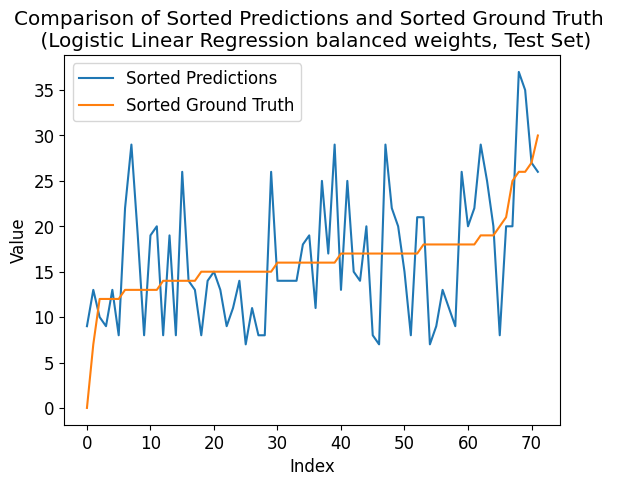

In [157]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_test, y_pred)
# print("Confusion Matrix:")
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#           |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)


plot_comparison(y_test, y_pred, 'Logistic Linear Regression balanced weights, Test Set')


Accuracy: 0.059941520467836254
Correlation coefficient: 0.38806679746981715


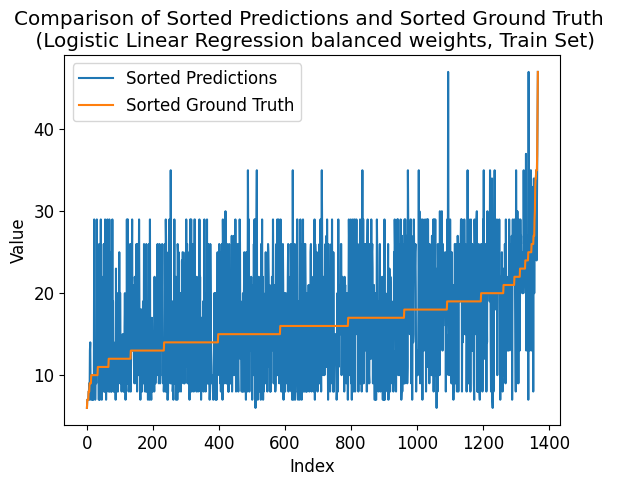

In [158]:
# predict on train
# Use the trained model to make predictions
y_pred_ = model.predict(x_train)
# Alternatively, you can get the predicted probabilities for each class
y_prob_ = model.predict_proba(x_train)

accuracy = accuracy_score(y_train, y_pred_)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_train, y_pred_)
# print("Confusion Matrix:")
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#              |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)


plot_comparison(y_train, y_pred_, 'Logistic Linear Regression balanced weights, Train Set')


## Batch download files

In [162]:
# batch download the plotted figures
# uncomment the code below to download figures if needed

'''
import glob

folder_path = '.'
# file_prefix = 'Comparison (Logistic Linear Regression Reduced Evaluation'
file_prefix = 'Comparison'

# Use glob to find all files with the given prefix in the folder
matching_files = glob.glob(f"{folder_path}/{file_prefix}*")
# print(matching_files)
# # Print the matching file names
# for file_path in matching_files:
#     print(file_path)

import zipfile

zip_filename = 'files.zip'
with zipfile.ZipFile(zip_filename, 'w') as zipf:
    # Add files to the zip file
    for file_path in matching_files:
        zipf.write(file_path)

from google.colab import files
files.download(zip_filename)
'''

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Delete generated files

Use the code cautiously.

In [160]:
# # Specify the path to the root folder
# root_folder = '/content'

# # Get a list of all files in the root folder
# files = os.listdir(root_folder)

# files_to_delete = [file for file in files if file.endswith(".png")]

# for file_ in files_to_delete:
#     print(file_)

# # Iterate over the files and delete them
# for file in files_to_delete:
#     file_path = os.path.join(root_folder, file)
#     if os.path.isfile(file_path):
#         os.remove(file_path)